## **Name: Rafia Ahsan**

# Tumor_Segmentation_2D U-net

In [ ]:
from google.colab import drive
drive._mount('/content/gdrive')

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline
import cv2
from tqdm import tqdm_notebook,tnrange
from glob import glob
from itertools import chain
from skimage.io import imread,imshow,concatenate_images
from skimage.morphology import label
from skimage.transform import resize
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
from tensorflow.keras import backend as K
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
train_images = (r'/content/gdrive/MyDrive/Segmentation/test/images/')
train_mask = (r'/content/gdrive/MyDrive/Segmentation/test/tumormask/')

train_img_paths = sorted(
    [
        os.path.join(train_images, fname)
        for fname in os.listdir(train_images)
        if fname.endswith(".jpeg")
    ]
)
train_mask_paths = sorted(
    [
        os.path.join(train_mask, fname)
        for fname in os.listdir(train_mask)
        if fname.endswith(".jpeg") and not fname.startswith(".")
    ]
)


#Validation
val_images = (r"/content/gdrive/MyDrive/Segmentation/Original data/Validation_orig/")
val_mask = (r"/content/gdrive/MyDrive/Segmentation/Original data/Validation_tumormask/")

val_img_paths = sorted(
    [
        os.path.join(val_images, fname)
        for fname in os.listdir(val_images)
        if fname.endswith(".jpeg")
    ]
)
val_mask_paths = sorted(
    [
        os.path.join(val_mask, fname)
        for fname in os.listdir(val_mask)
        if fname.endswith(".jpeg") and not fname.startswith(".")
    ]
)


#test
test_images = (r"/content/gdrive/MyDrive/Segmentation/Original data/test_orig/")
test_mask = (r"/content/gdrive/MyDrive/Segmentation/Original data/test_tumormask/")

test_img_paths = sorted(
    [
        os.path.join(test_images, fname)
        for fname in os.listdir(test_images)
        if fname.endswith(".jpeg")
    ]
)
test_mask_paths = sorted(
    [
        os.path.join(test_mask, fname)
        for fname in os.listdir(test_mask)
        if fname.endswith(".jpeg") and not fname.startswith(".")
    ]
)

print(train_img_paths[:10], '|',train_mask_paths[:10])
print(val_img_paths[:10], '|',val_mask_paths[:10])

In [ ]:
fig=plt.figure(figsize=(10,10))
for i in range(1,4):
    fig.add_subplot(3,3,i)
    img_path=train_img_paths[i]
    mask_path=train_mask_paths[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    mask=cv2.imread(mask_path)
    plt.imshow(img)
    plt.imshow(mask,alpha=0.4)
    plt.grid(False)

plt.show()

In [ ]:
df_train=pd.DataFrame(data={"filename":train_img_paths,"mask":train_mask_paths})
df_val=pd.DataFrame(data={"filename":val_img_paths,"mask":val_mask_paths})
df_test=pd.DataFrame(data={"filename":test_img_paths,"mask":test_mask_paths})

print(df_train.shape)
print(df_val.shape)
#print(df_test.shape)

In [ ]:
df_train.to_csv('train.csv')

In [ ]:
def train_generator(data_frame,batch_size,aug_dict,image_color_mode="rgb",mask_color_mode="grayscale",image_save_prefix="image",mask_save_prefix="mask",save_to_dir=None,target_size=(224,224),seed=1):

    image_datagen=ImageDataGenerator(**aug_dict)
    mask_datagen=ImageDataGenerator(**aug_dict)

    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = "filename",
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = "mask",
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)

    train_gen=zip(image_generator,mask_generator)

    for (img,mask) in train_gen:
        img , mask =adjust_data(img,mask)
        yield (img,mask)

def adjust_data(img,mask):
        img=img/255
        mask=mask/255
        mask[mask>0.5]=1
        mask[mask<=0.5]=0

        return (img,mask)

In [ ]:
def dice_coef(y_true,y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    cal=K.sum(y_truef*y_predf)

    return ((2*cal+100)/(K.sum(y_truef)+K.sum(y_predf)+100))

def dice_coef_loss(y_true,y_pred):
    return -dice_coef(y_true,y_pred)

def iou(y_true,y_pred):
    intersection=K.sum(y_true*y_pred)
    sum_=K.sum(y_true+y_pred)
    jac=(intersection+100)/(sum_-intersection+100)
    return jac

def jac_distance(y_true,y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)

    return -iou(y_true,y_pred)

# Model

In [ ]:
def unet(input_size=(224,224,3)):
    inputs = layers.Input(input_size)

    conv1 = layers.Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = layers.Activation('relu')(conv1)
    conv1 = layers.Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = layers.BatchNormalization(axis=3)(conv1)
    bn1 = layers.Activation('relu')(bn1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = layers.Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = layers.Activation('relu')(conv2)
    conv2 = layers.Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = layers.BatchNormalization(axis=3)(conv2)
    bn2 = layers.Activation('relu')(bn2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = layers.Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = layers.Activation('relu')(conv3)
    conv3 = layers.Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = layers.BatchNormalization(axis=3)(conv3)
    bn3 = layers.Activation('relu')(bn3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = layers.Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = layers.Activation('relu')(conv4)
    conv4 = layers.Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = layers.BatchNormalization(axis=3)(conv4)
    bn4 = layers.Activation('relu')(bn4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = layers.Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = layers.Activation('relu')(conv5)
    conv5 = layers.Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = layers.BatchNormalization(axis=3)(conv5)
    bn5 = layers.Activation('relu')(bn5)

    up6 = layers.concatenate([layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = layers.Activation('relu')(conv6)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = layers.BatchNormalization(axis=3)(conv6)
    bn6 = layers.Activation('relu')(bn6)

    up7 = layers.concatenate([layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = layers.Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = layers.Activation('relu')(conv7)
    conv7 = layers.Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = layers.BatchNormalization(axis=3)(conv7)
    bn7 = layers.Activation('relu')(bn7)

    up8 = layers.concatenate([layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = layers.Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = layers.Activation('relu')(conv8)
    conv8 = layers.Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = layers.BatchNormalization(axis=3)(conv8)
    bn8 = layers.Activation('relu')(bn8)

    up9 = layers.concatenate([layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = layers.Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = layers.Activation('relu')(conv9)
    conv9 = layers.Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = layers.BatchNormalization(axis=3)(conv9)
    bn9 = layers.Activation('relu')(bn9)

    conv10 = layers.Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return models.Model(inputs=[inputs], outputs=[conv10])

In [ ]:
model=unet()
model.summary()

# Training Parameters

In [ ]:
EPOCHS = 60
BATCH_SIZE = 32
learning_rate = 1e-2
decay_rate = learning_rate / EPOCHS
opt = Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, decay=decay_rate, amsgrad=False)
#opt = RMSprop(lr=learning_rate, epsilon=None, decay=decay_rate)

In [ ]:
train_generator_args = dict()

train_gen = train_generator(df_train, BATCH_SIZE,train_generator_args ,
                                target_size=(224,224))

val_gener = train_generator(df_val, BATCH_SIZE,dict(),
                                target_size=(224,224))

model = unet(input_size=(224,224, 3))




model.compile(optimizer=opt, loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

callbacks = [ModelCheckpoint('/content/gdrive/MyDrive/Segmentation/segmentation_weights/unet_60_1e-2.hdf5', verbose=1, save_best_only=True)]

history = model.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE,
                    epochs=EPOCHS,
                    callbacks=callbacks,
                    validation_data = val_gener,
                    validation_steps=len(df_val) / BATCH_SIZE)

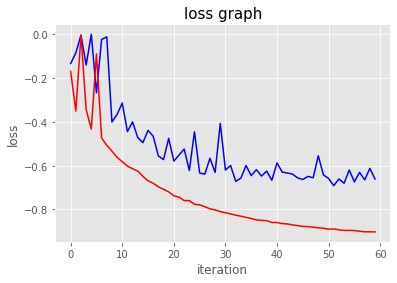

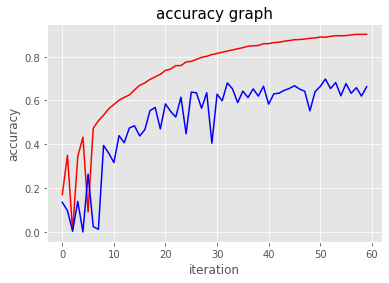

In [ ]:
a = history.history

list_traindice = a['dice_coef']
list_valdice = a['val_dice_coef']

list_trainjaccard = a['iou']
list_valjaccard = a['val_iou']

list_trainloss = a['loss']
list_valloss = a['val_loss']
plt.figure(1)
plt.plot(list_valloss, 'b-')
plt.plot(list_trainloss,'r-')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.title('loss graph', fontsize = 15)
plt.figure(2)
plt.plot(list_traindice, 'r-')
plt.plot(list_valdice, 'b-')
plt.xlabel('iteration')
plt.ylabel('accuracy')
plt.title('accuracy graph', fontsize = 15)
plt.show()

In [ ]:
def read_image(x):
    x = x.decode()
    image = cv2.imread(x, cv2.IMREAD_COLOR)
    image = np.clip(image - np.median(image)+127, 0, 255)
    image = image/255.0
    image = image.astype(np.float32)
    return image


def read_mask(y):
    y = y.decode()
    mask = cv2.imread(y, cv2.IMREAD_GRAYSCALE)
    mask = mask/255.0
    mask = mask.astype(np.float32)
    mask = np.expand_dims(mask, axis=-1)
    return mask


def parse_data(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32])
    x.set_shape([224, 224, 3])
    y.set_shape([224, 224, 1])
    return x, y

def dice_coef(y_true,y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    cal=K.sum(y_truef*y_predf)

    return ((2*cal+100)/(K.sum(y_truef)+K.sum(y_predf)+100))

def dice_loss(y_true,y_pred):
    return -dice_coef(y_true,y_pred)


def tf_dataset(x, y, batch=8):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=32)
    dataset = dataset.map(map_func=parse_data)
    dataset = dataset.batch(batch)
    return dataset

train_dataset = tf_dataset(train_img_paths, train_mask_paths, batch=1)
valid_dataset = tf_dataset(val_img_paths, val_mask_paths, batch=1)

batch_size = 32

train_steps = (len(train_img_paths)//batch_size)
valid_steps = (len(val_img_paths)//batch_size)


In [ ]:
from tensorflow.keras.models import load_model

model.load_weights("/content/gdrive/MyDrive/Segmentation/segmentation_weights/unet_60_1e-2.hdf5")

In [ ]:
def dice(pred, true, k = 1):
    intersection = np.sum(pred[true==k]) * 2.0
    dice = intersection / (np.sum(pred) + np.sum(true))
    return dice

for i in range(557):
    img = cv2.imread(df_test['filename'].iloc[i])
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)
    mask=cv2.imread(df_test['mask'].iloc[i], cv2.IMREAD_GRAYSCALE)
    mask = mask/255
    mask=np.squeeze(mask) > .5
    pred=np.squeeze(pred) > .5

    pred = pred.astype('uint8')
    mask = mask.astype('uint8')

    dc=dice(pred, mask)
    all_dc=[]
    all_dc.append(dc)
print('mean Dice Score:', np.mean(np.array(dc)))

mean Dice Score: 0.8805970149253731


# Predictions

In [ ]:
model =models.load_model('/content/gdrive/MyDrive/Segmentation/segmentation_weights/unet_60_1e-2.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1000.jpeg


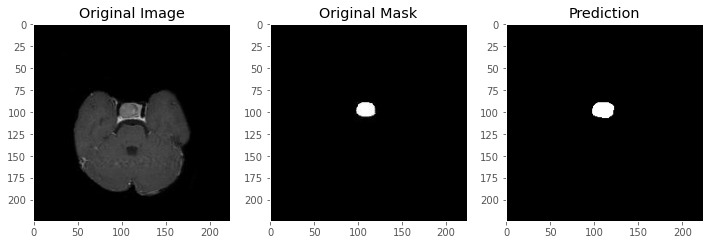

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1001.jpeg


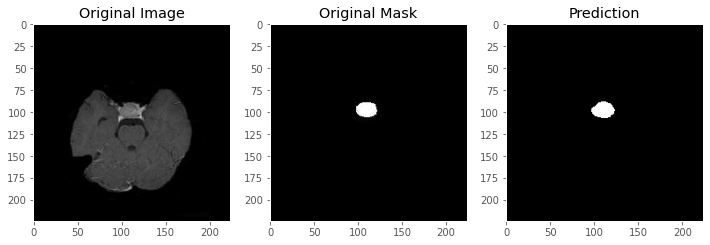

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1002.jpeg


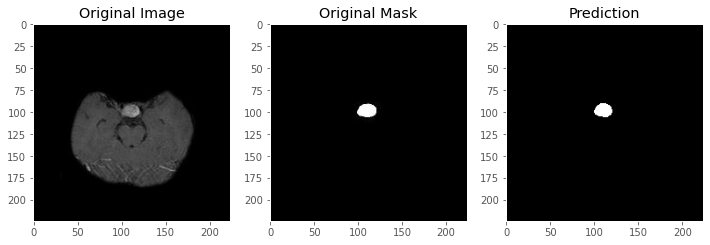

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1003.jpeg


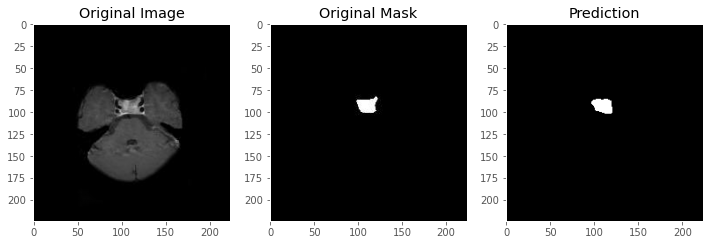

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1004.jpeg


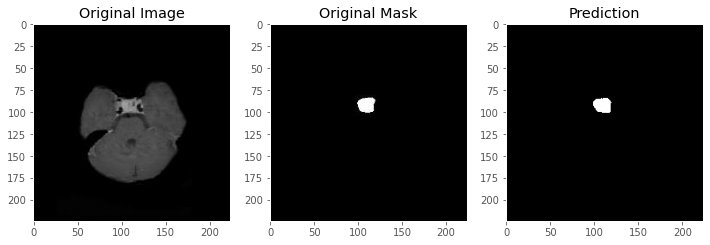

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1005.jpeg


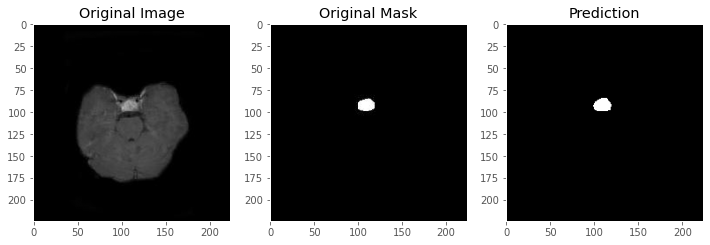

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1006.jpeg


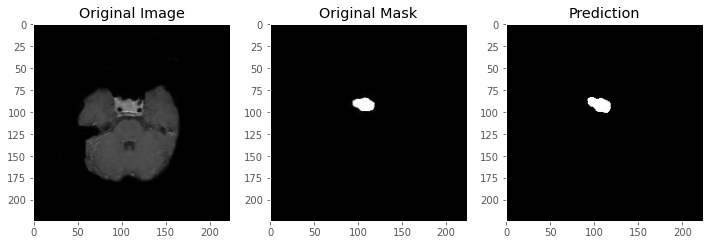

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1007.jpeg


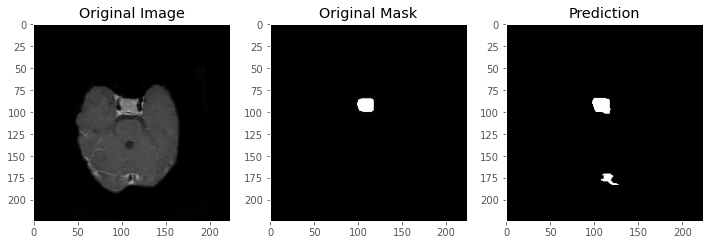

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1008.jpeg


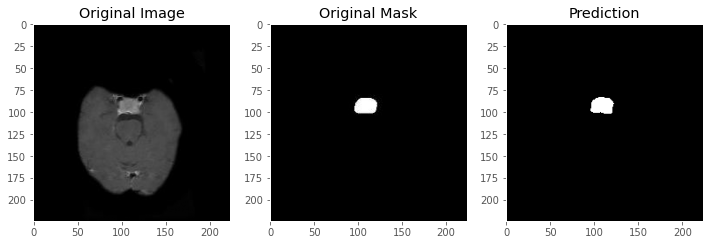

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1009.jpeg


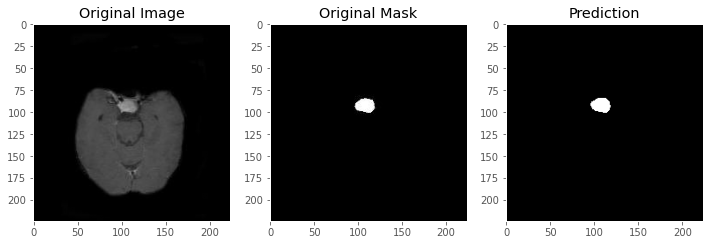

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1010.jpeg


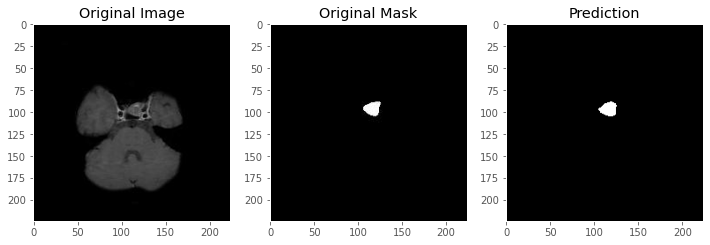

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1011.jpeg


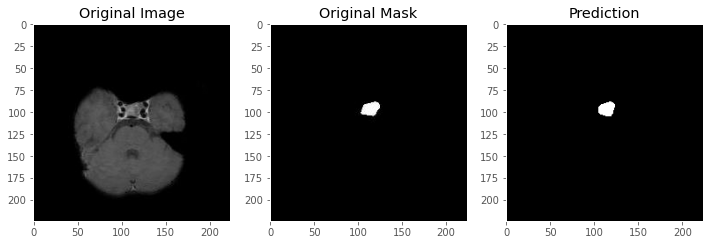

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1012.jpeg


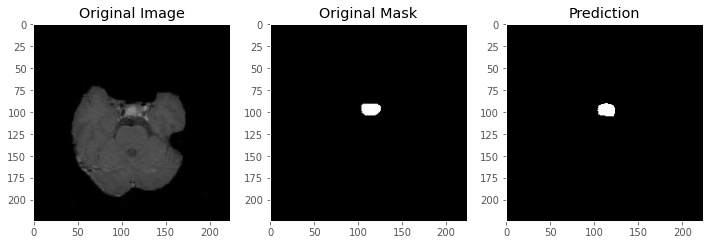

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1013.jpeg


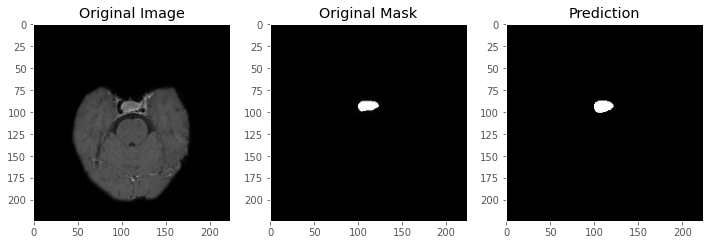

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1014.jpeg


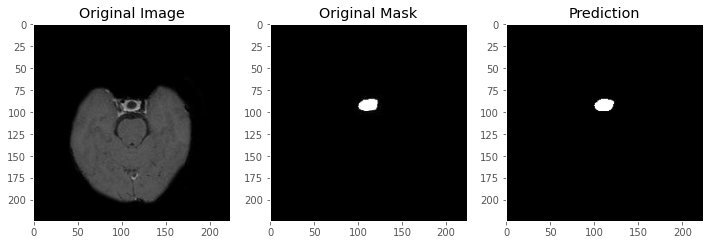

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1015.jpeg


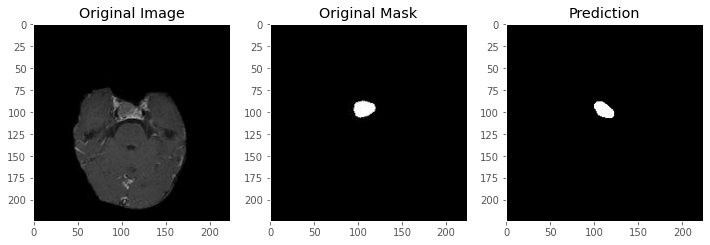

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1016.jpeg


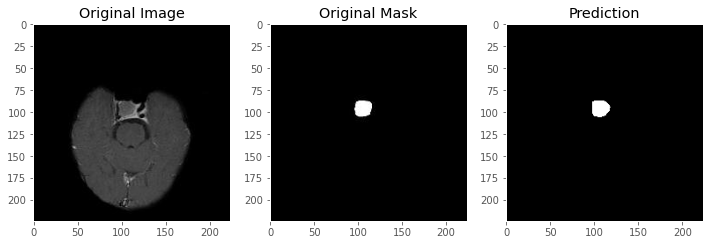

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1017.jpeg


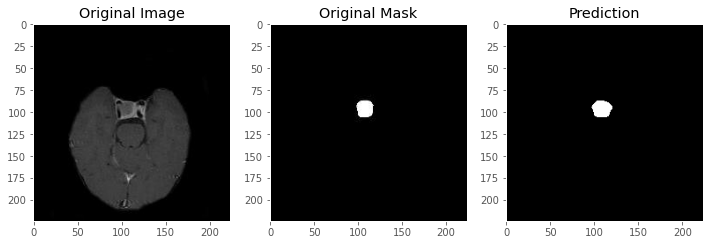

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1018.jpeg


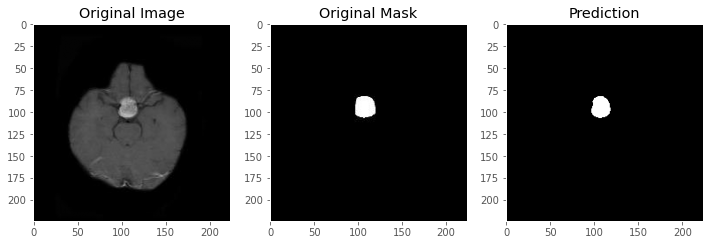

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1019.jpeg


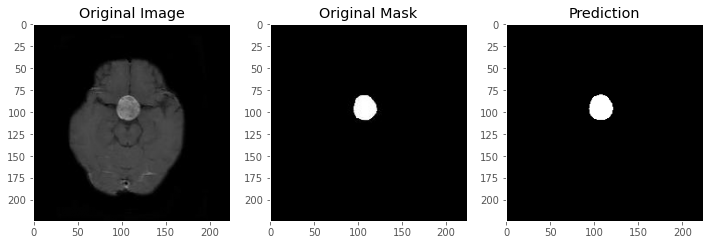

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1020.jpeg


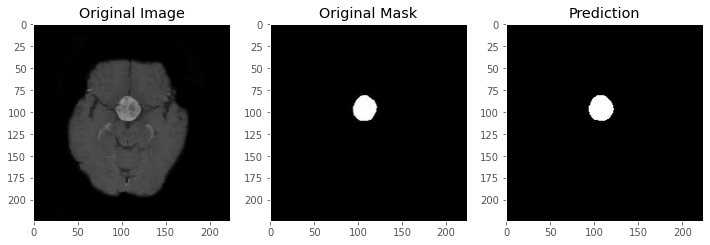

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1021.jpeg


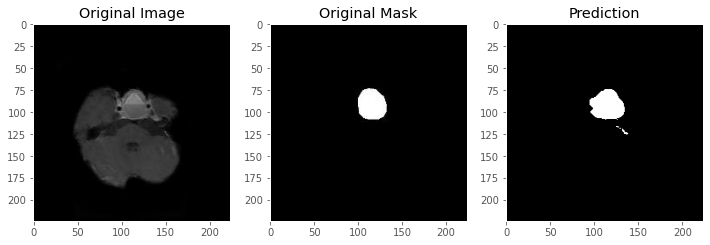

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1022.jpeg


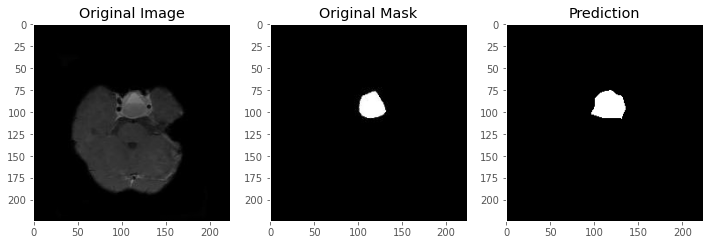

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1023.jpeg


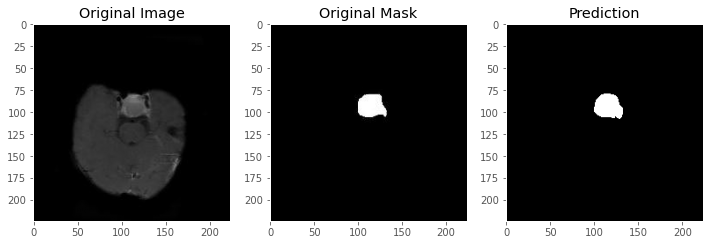

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1024.jpeg


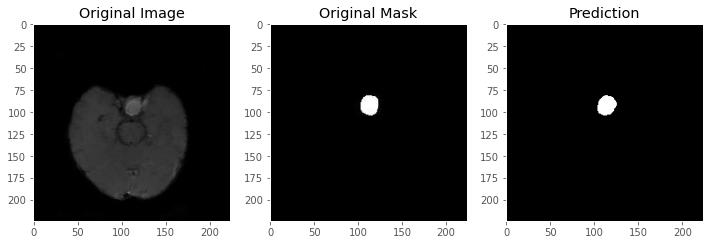

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1112.jpeg


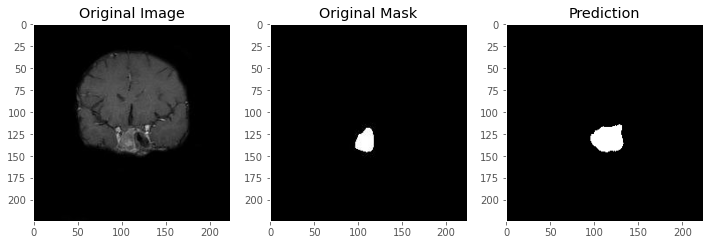

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1113.jpeg


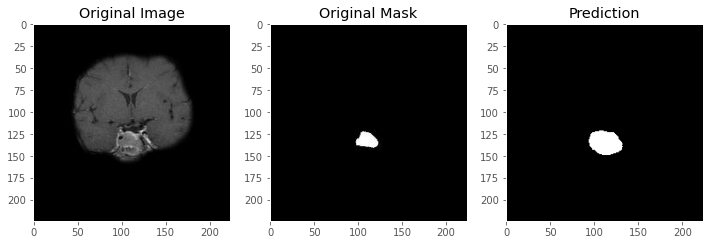

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1114.jpeg


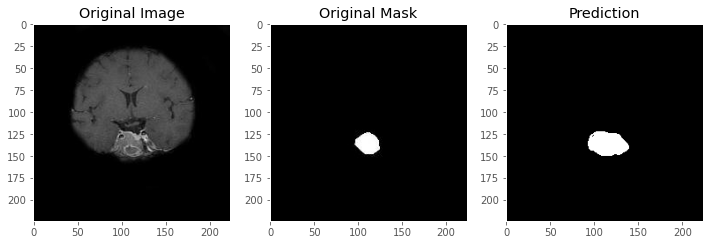

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1115.jpeg


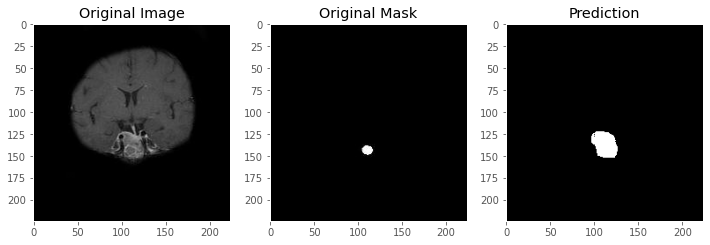

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1116.jpeg


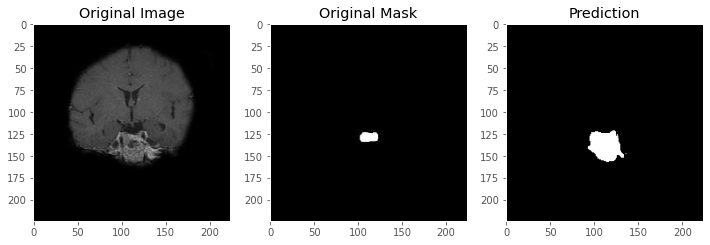

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1117.jpeg


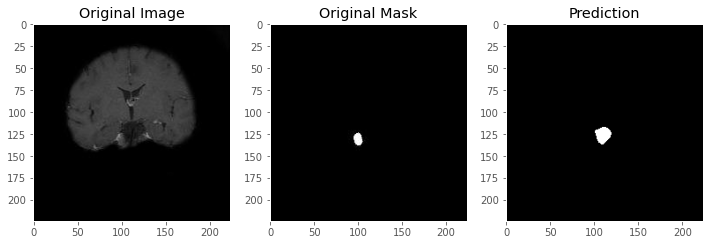

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1118.jpeg


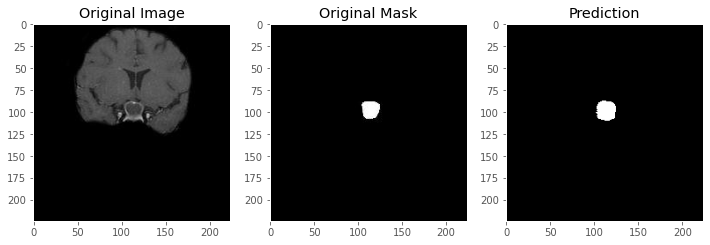

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1119.jpeg


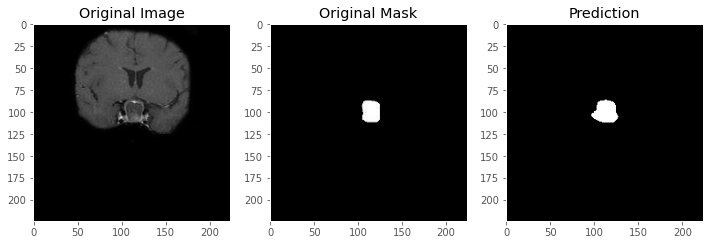

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1120.jpeg


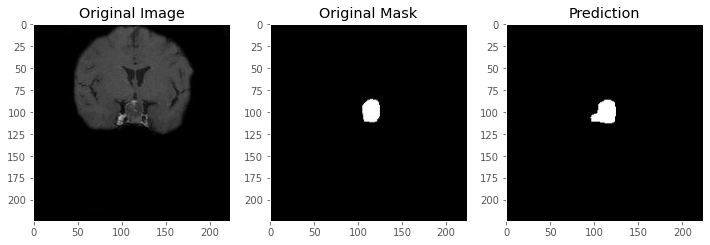

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1121.jpeg


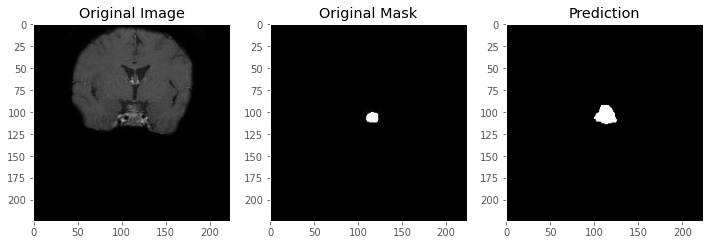

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1122.jpeg


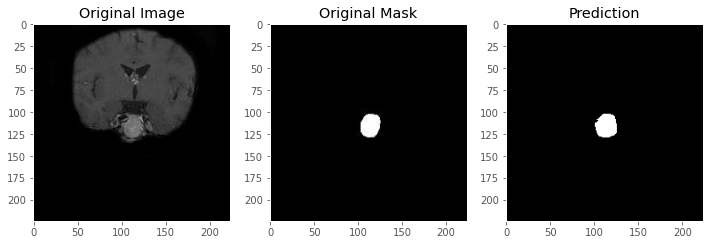

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1123.jpeg


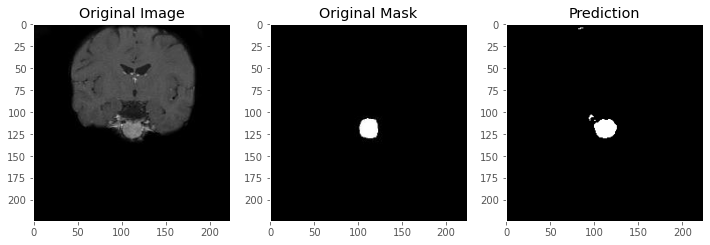

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1124.jpeg


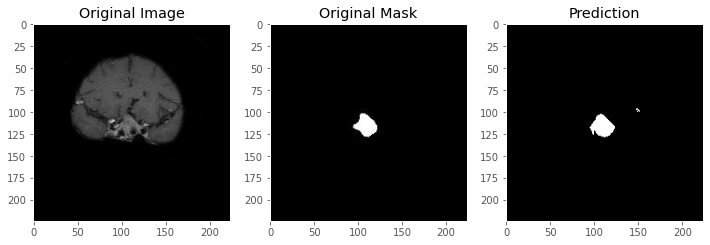

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1125.jpeg


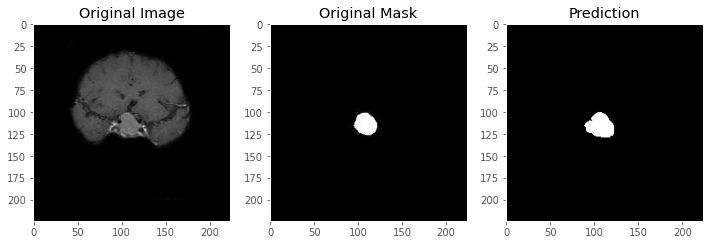

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1126.jpeg


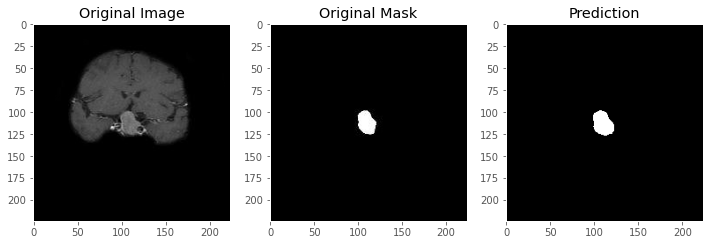

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1127.jpeg


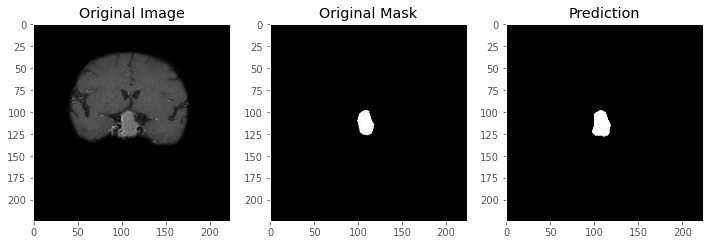

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1128.jpeg


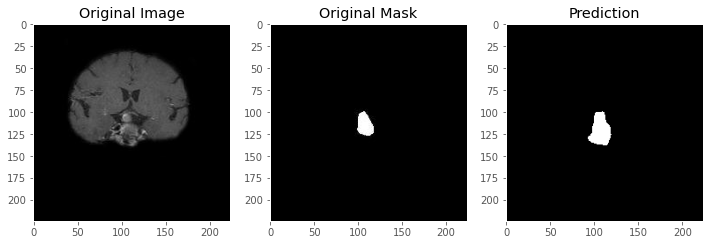

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1129.jpeg


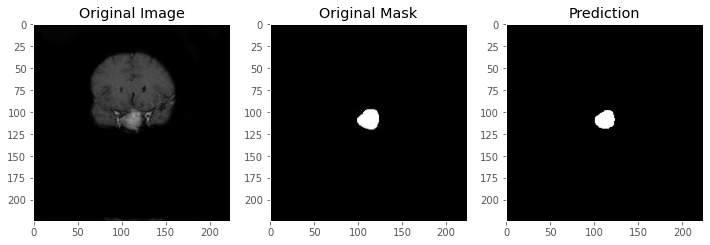

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1130.jpeg


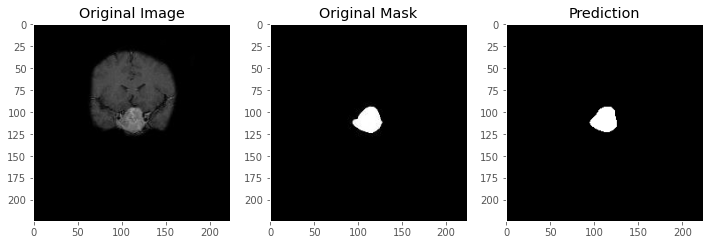

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1131.jpeg


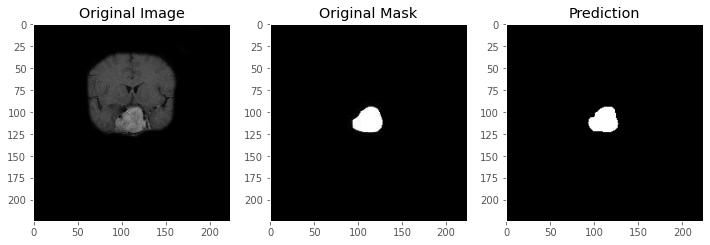

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1132.jpeg


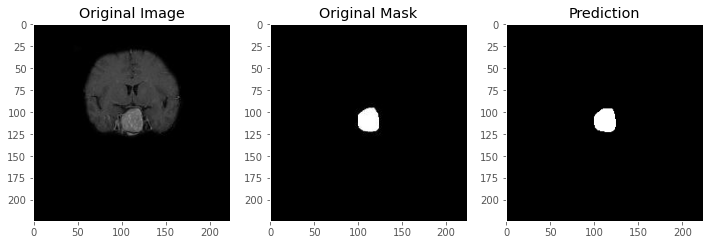

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1133.jpeg


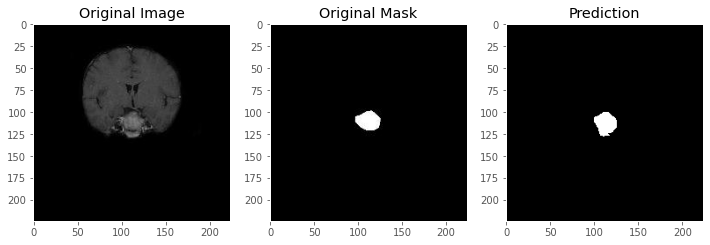

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1134.jpeg


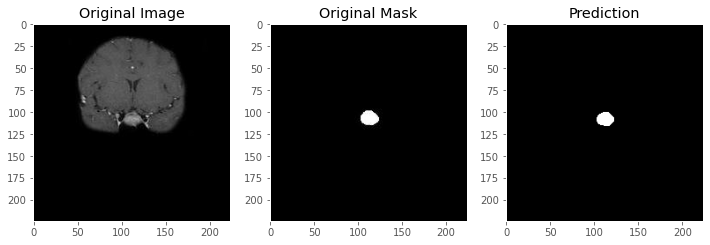

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1135.jpeg


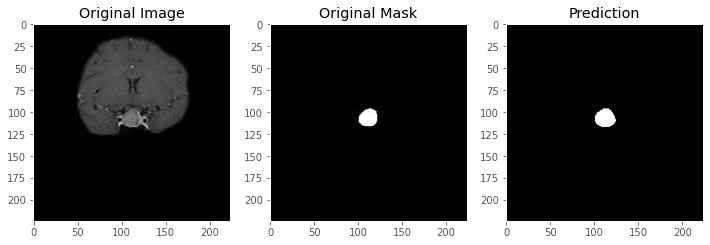

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1136.jpeg


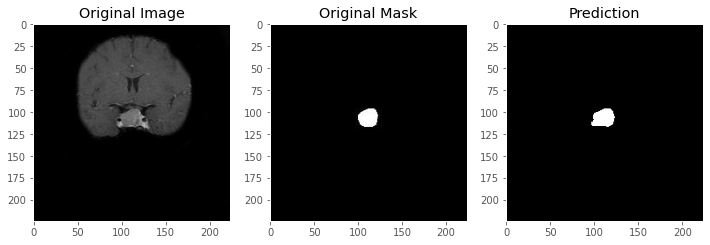

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1137.jpeg


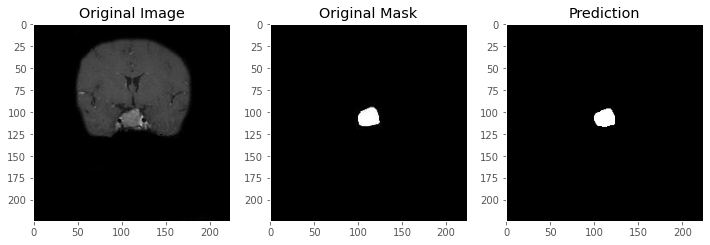

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1138.jpeg


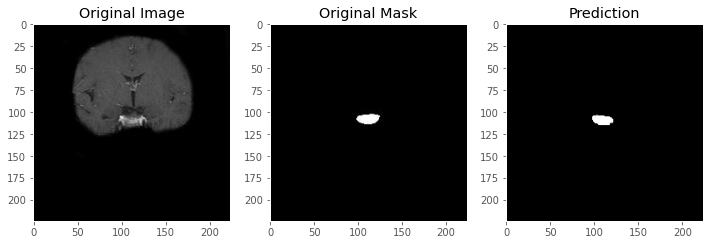

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1139.jpeg


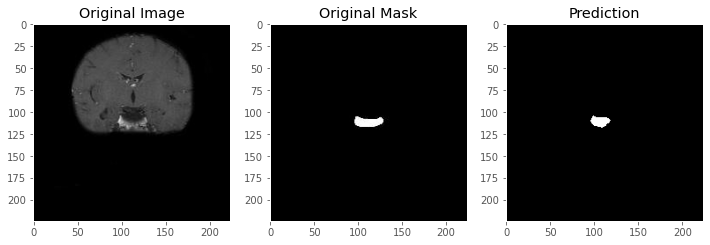

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1140.jpeg


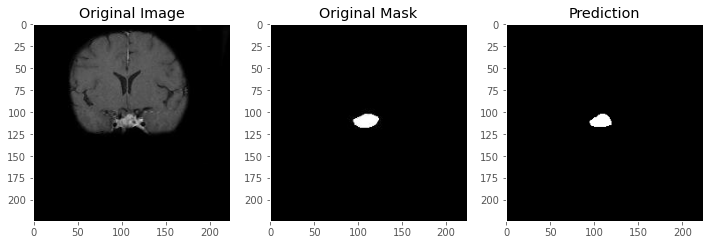

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1141.jpeg


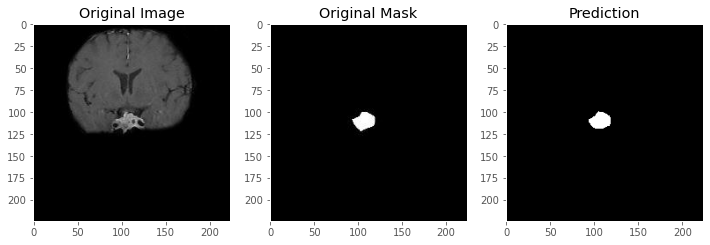

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1142.jpeg


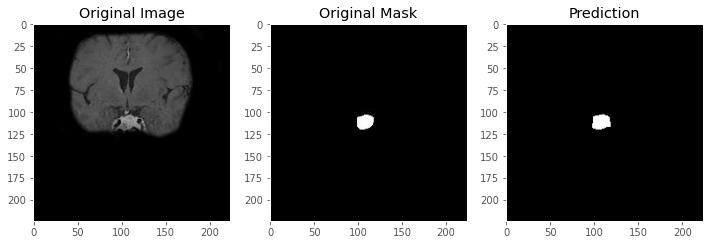

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1143.jpeg


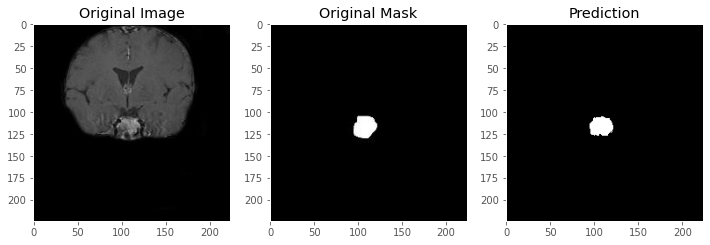

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1144.jpeg


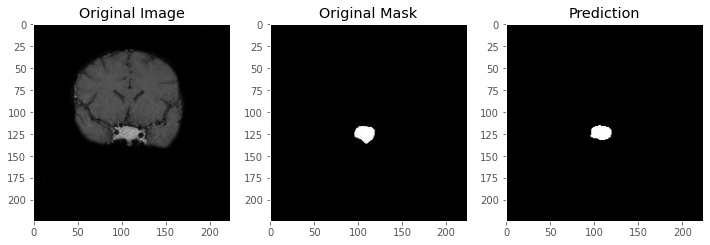

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1145.jpeg


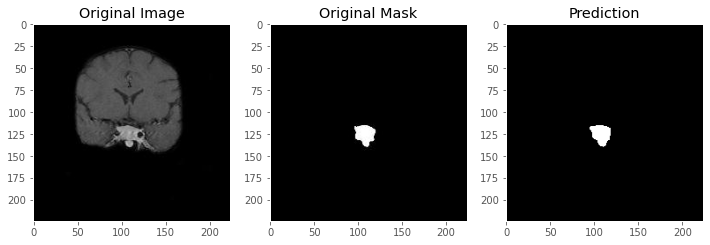

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1146.jpeg


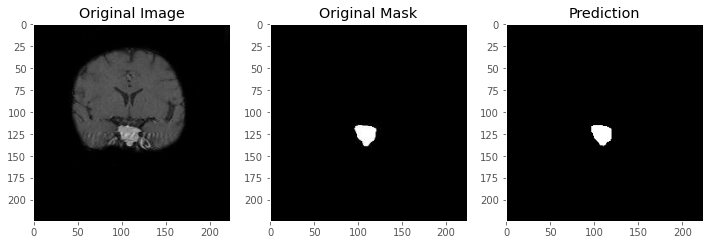

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1147.jpeg


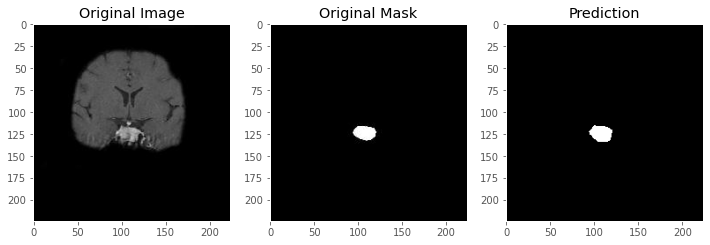

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1148.jpeg


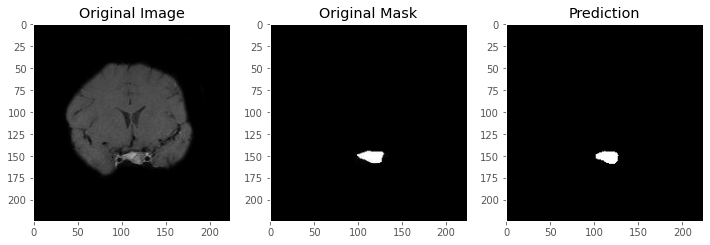

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1149.jpeg


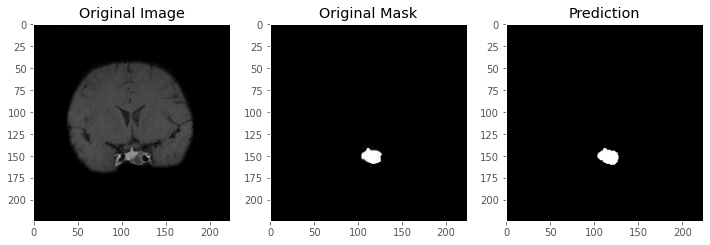

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1150.jpeg


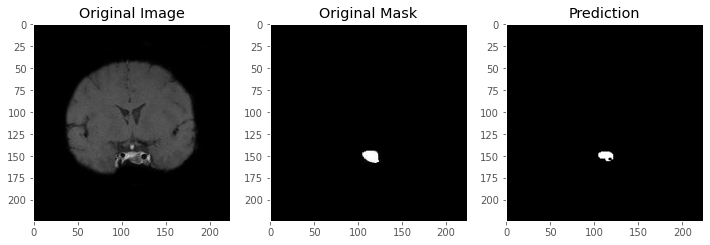

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1151.jpeg


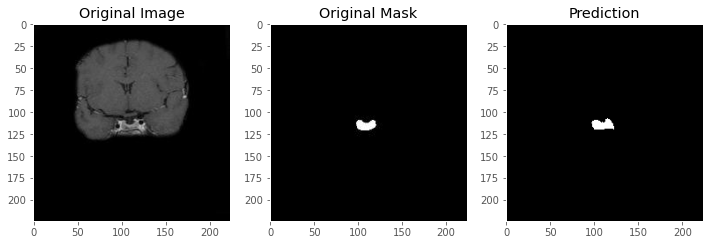

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1152.jpeg


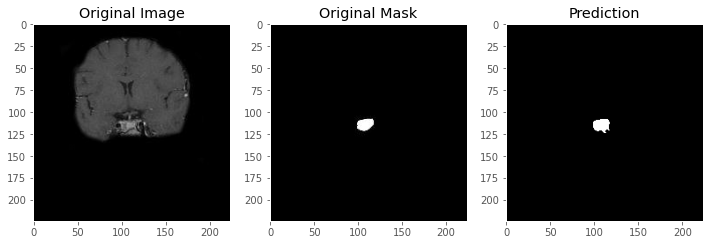

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1153.jpeg


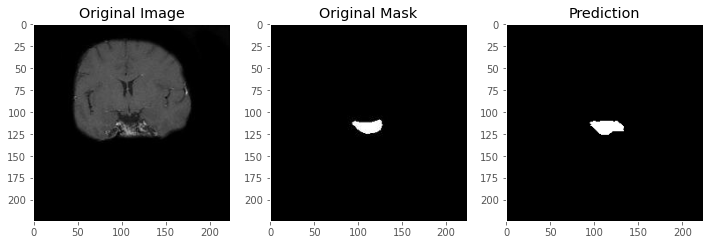

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1154.jpeg


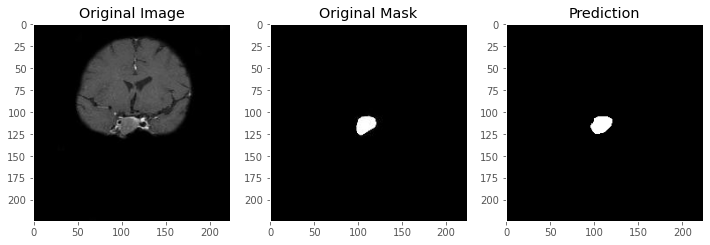

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1155.jpeg


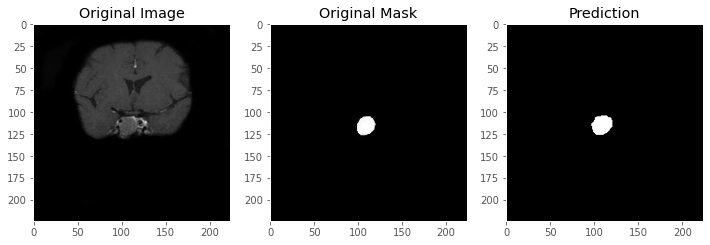

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1156.jpeg


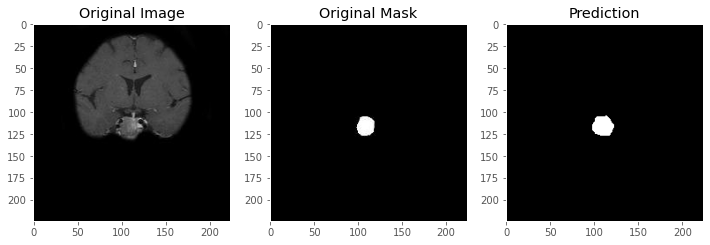

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1157.jpeg


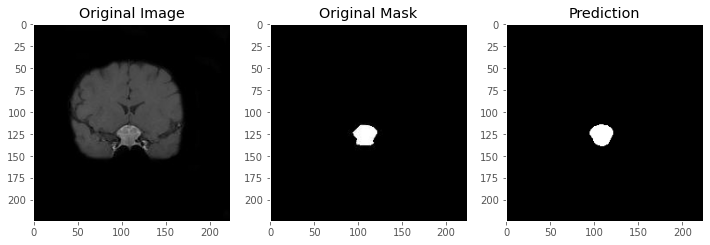

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1158.jpeg


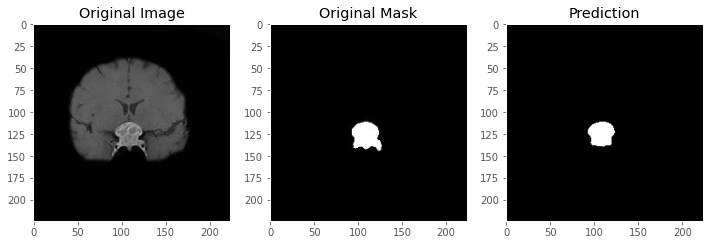

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1159.jpeg


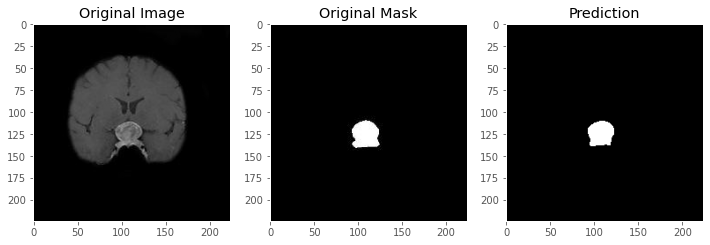

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1160.jpeg


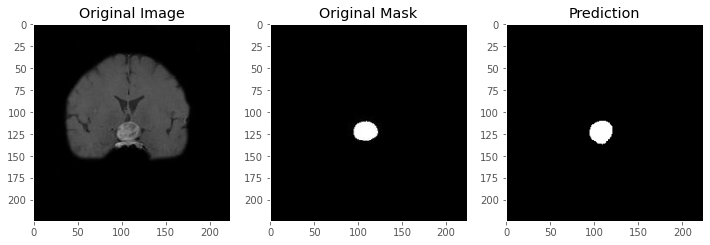

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1161.jpeg


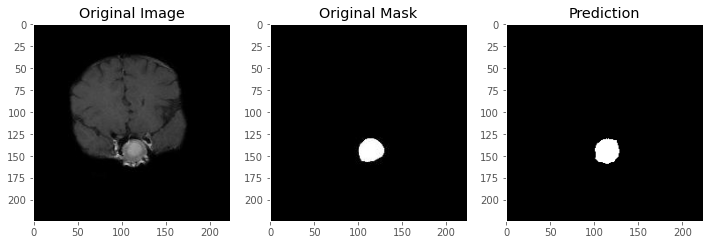

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1162.jpeg


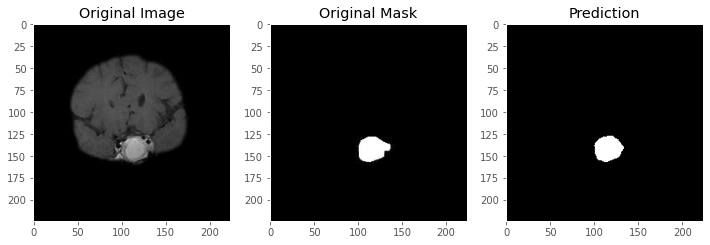

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1163.jpeg


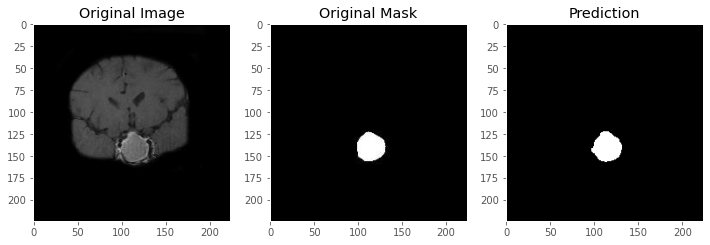

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1164.jpeg


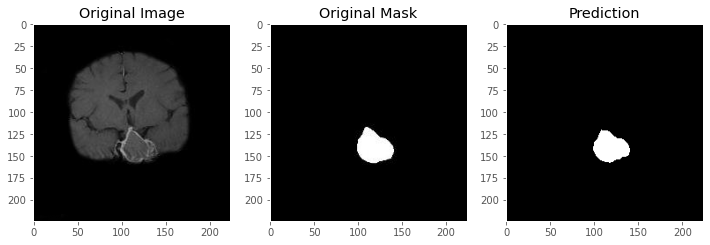

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1165.jpeg


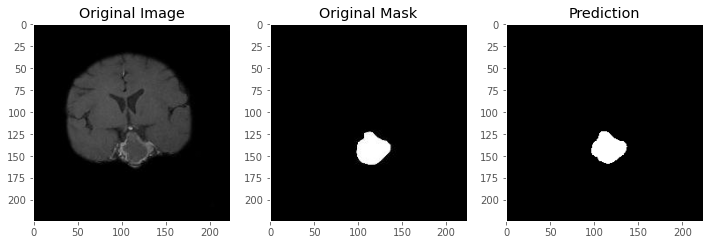

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1233.jpeg


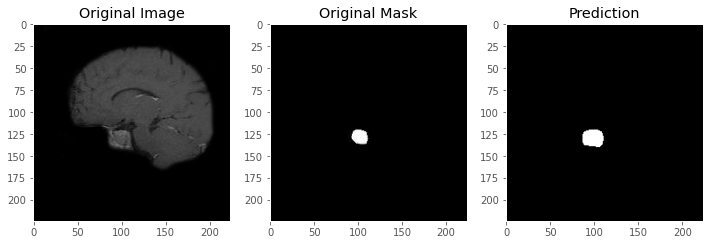

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1234.jpeg


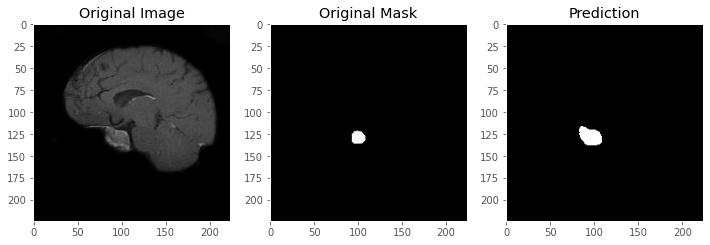

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1235.jpeg


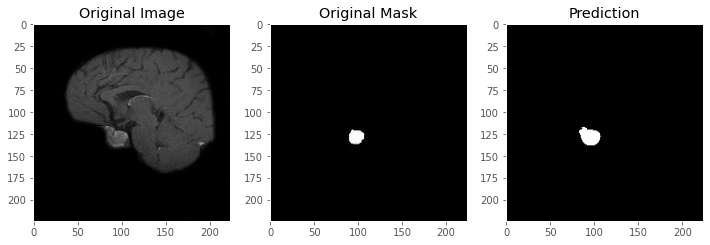

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1236.jpeg


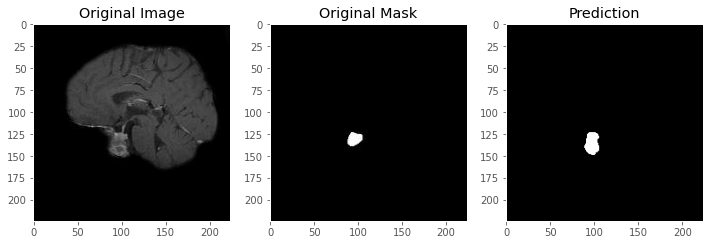

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1237.jpeg


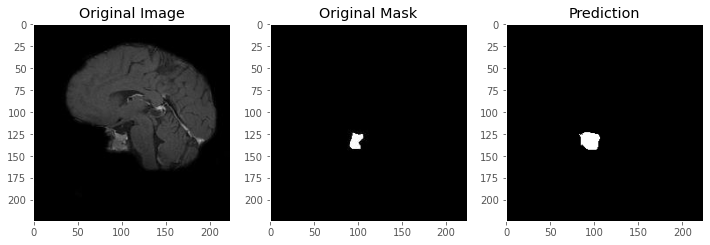

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1238.jpeg


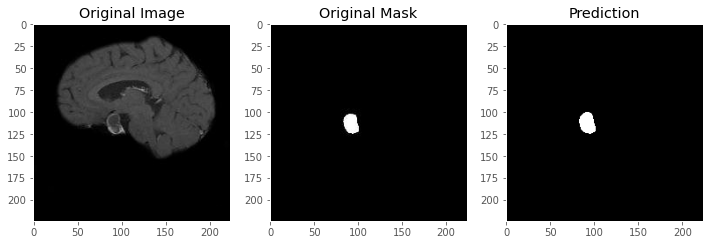

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1239.jpeg


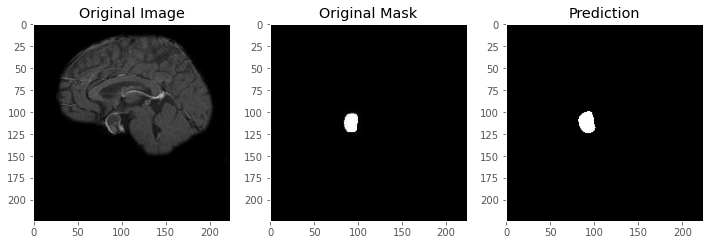

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1240.jpeg


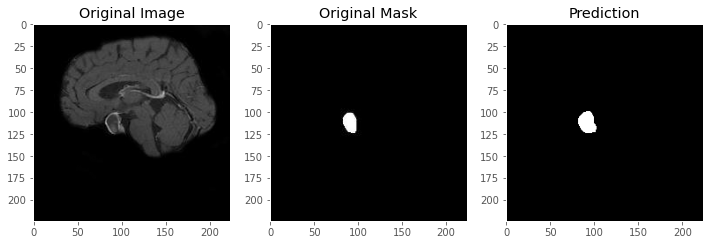

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1241.jpeg


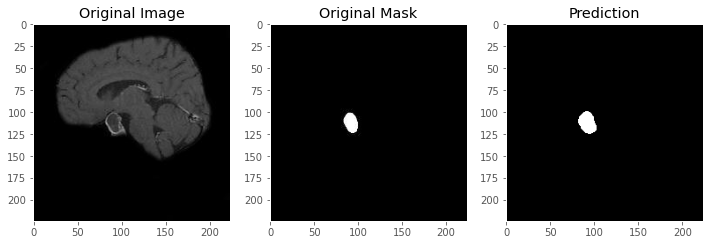

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1242.jpeg


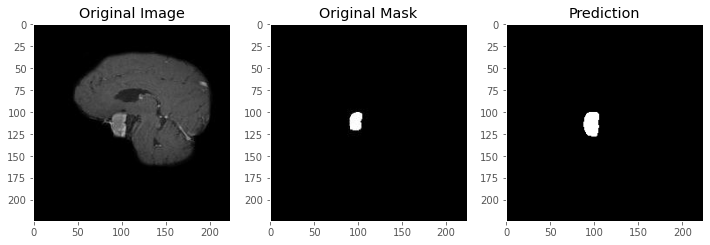

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1243.jpeg


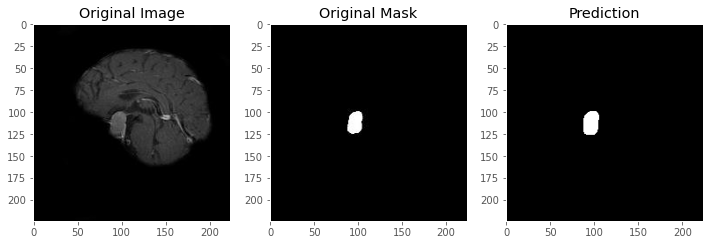

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1244.jpeg


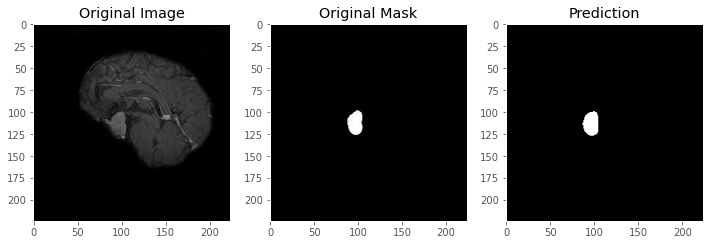

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1245.jpeg


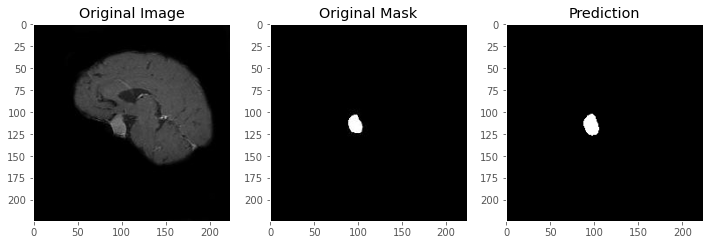

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1246.jpeg


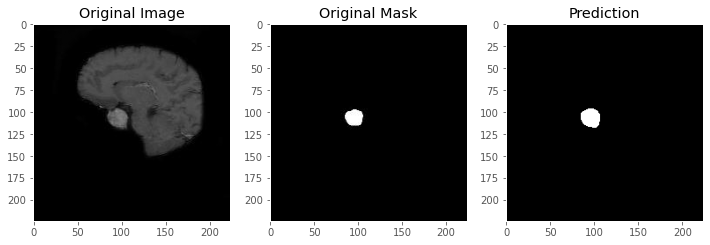

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1247.jpeg


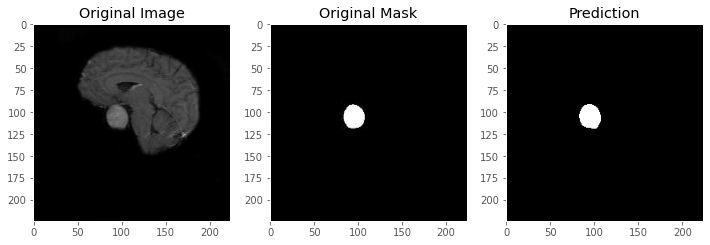

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1248.jpeg


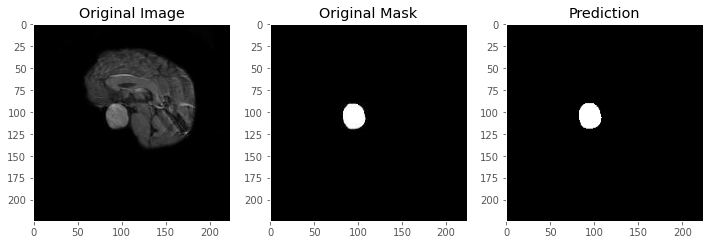

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1249.jpeg


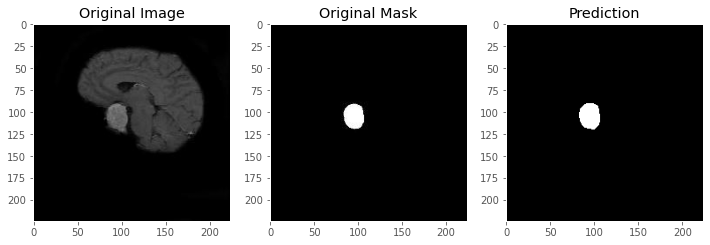

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1250.jpeg


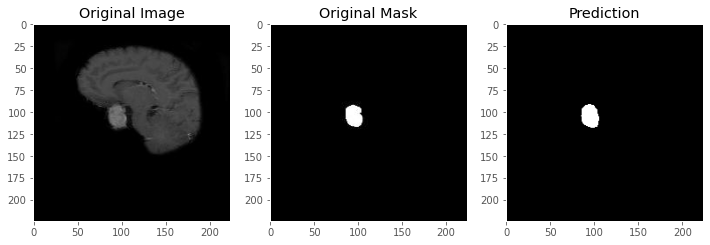

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1251.jpeg


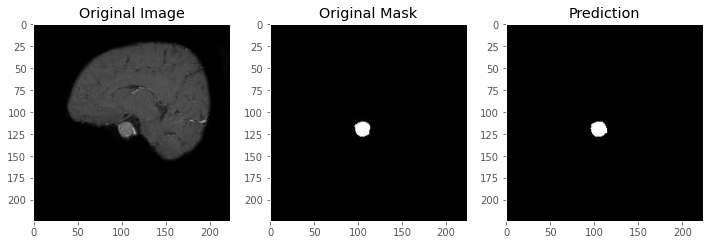

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1252.jpeg


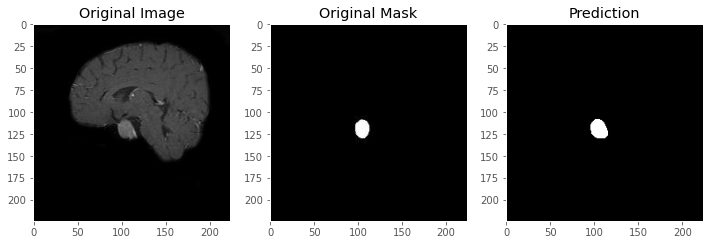

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1253.jpeg


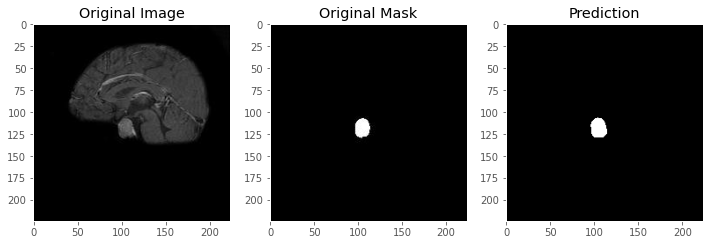

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1254.jpeg


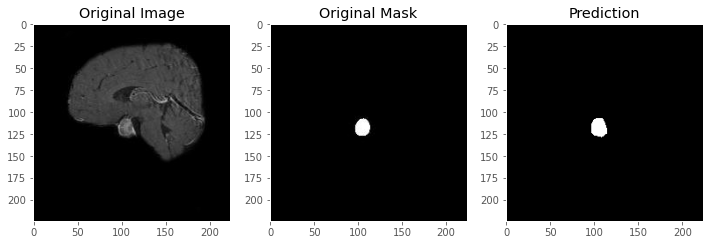

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1255.jpeg


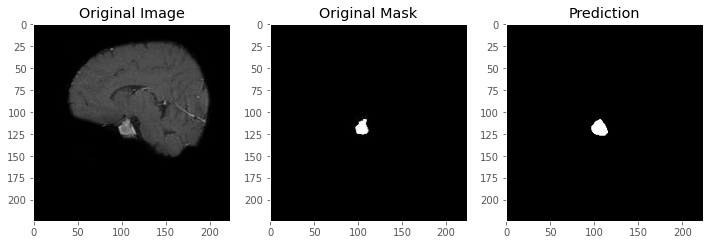

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1256.jpeg


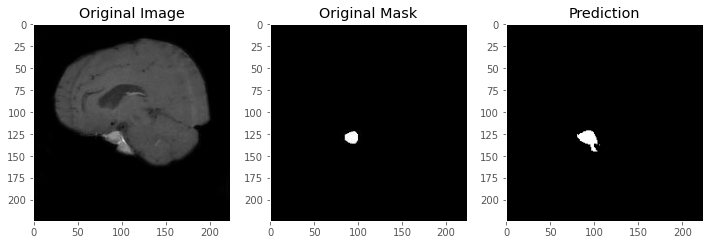

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1257.jpeg


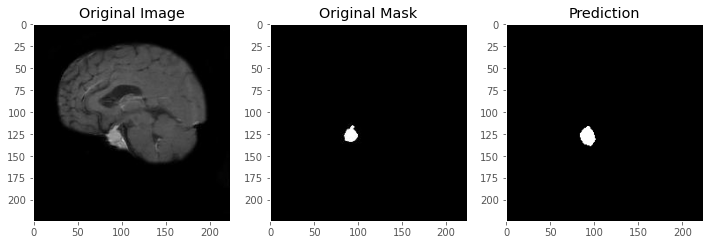

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1258.jpeg


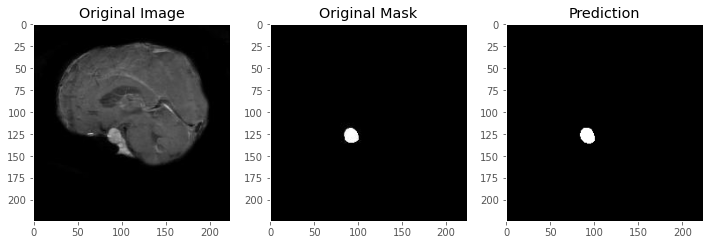

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1259.jpeg


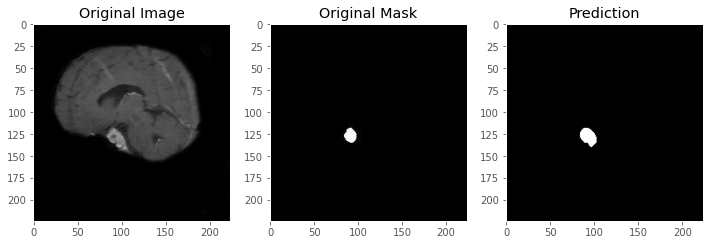

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1260.jpeg


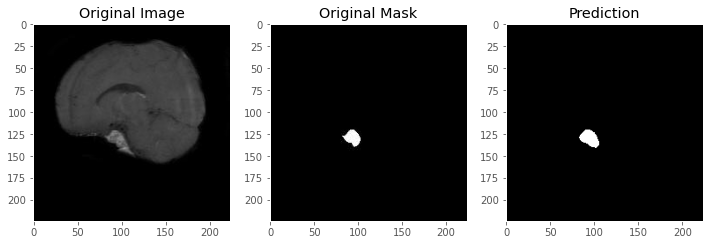

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1261.jpeg


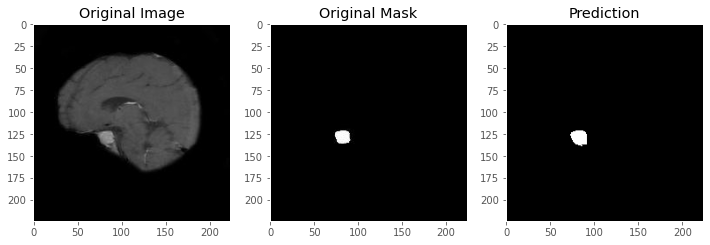

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1262.jpeg


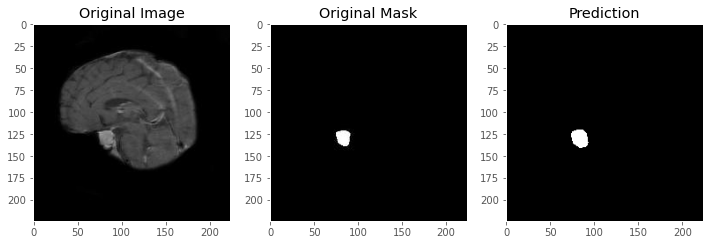

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1263.jpeg


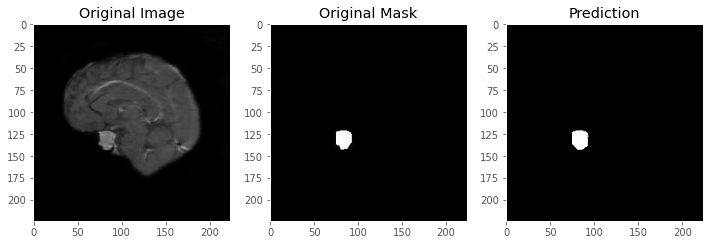

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1264.jpeg


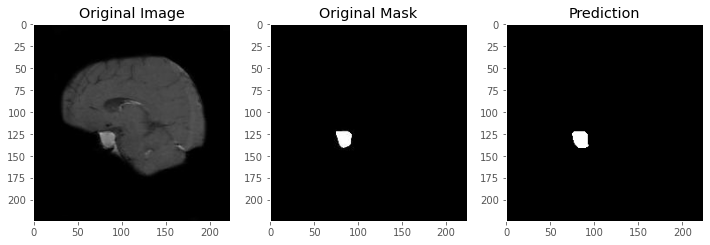

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1265.jpeg


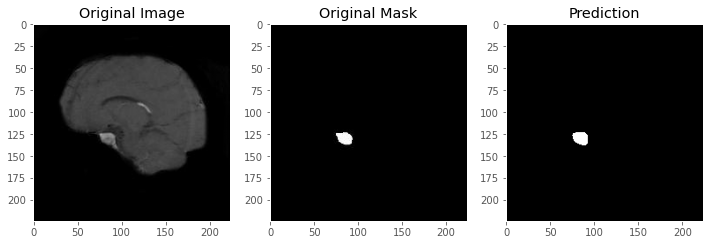

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1266.jpeg


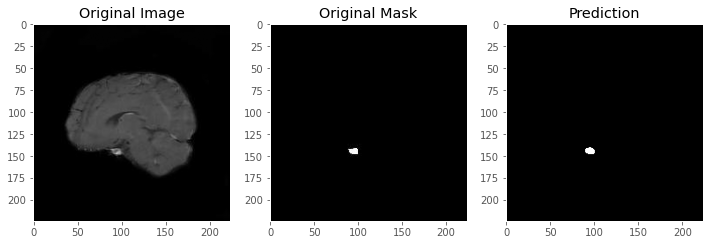

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1267.jpeg


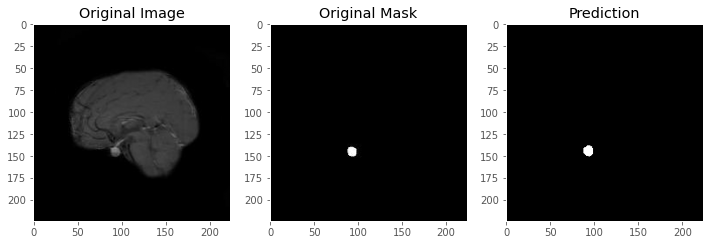

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1268.jpeg


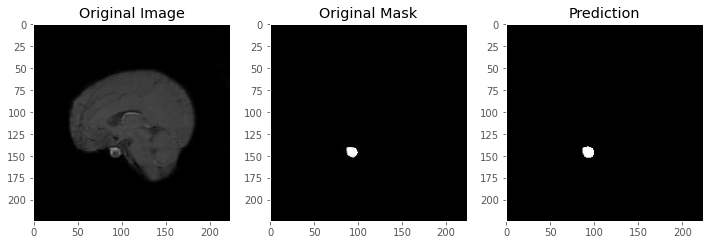

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1269.jpeg


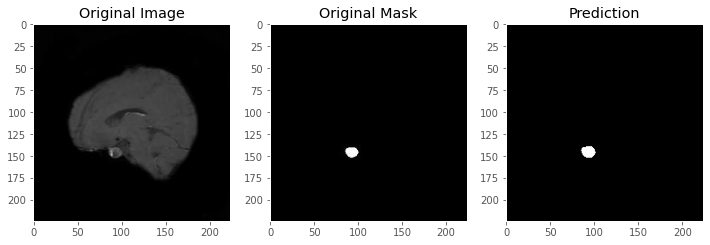

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1270.jpeg


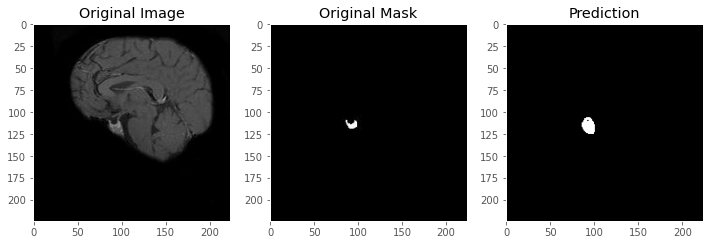

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1271.jpeg


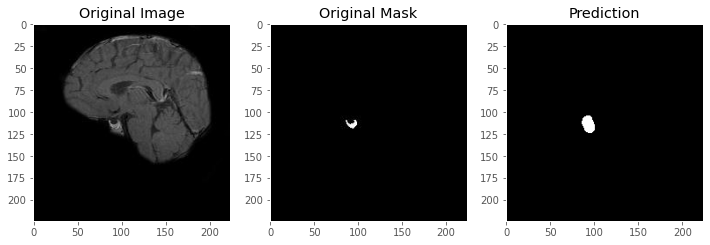

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1272.jpeg


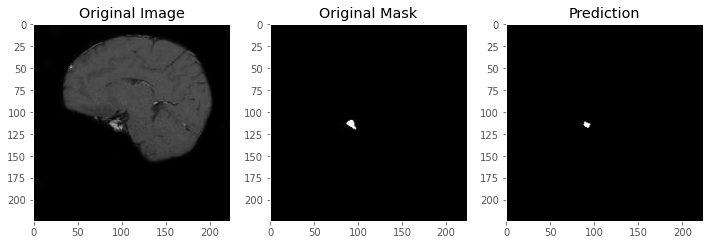

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1273.jpeg


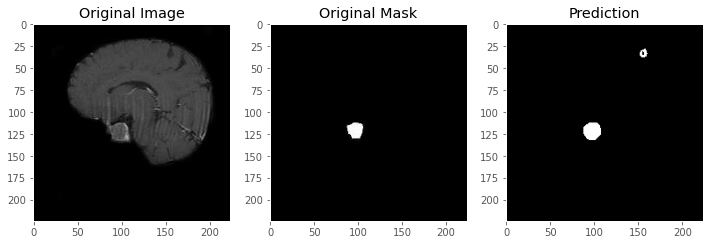

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1274.jpeg


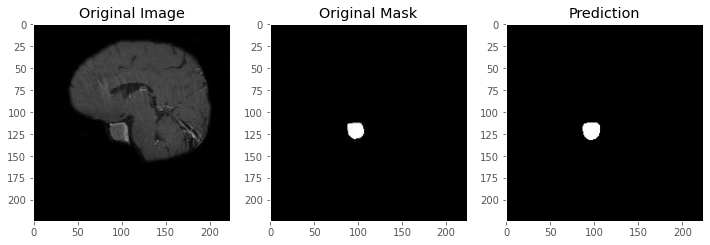

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1275.jpeg


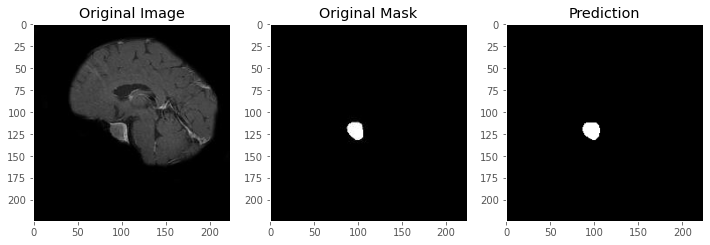

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1276.jpeg


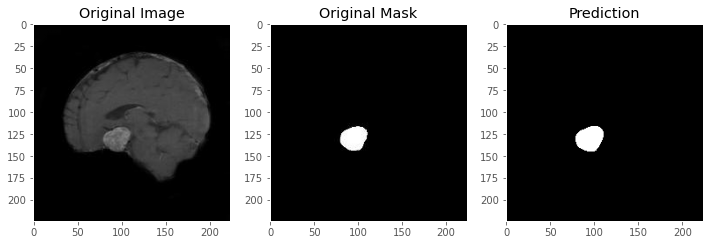

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1277.jpeg


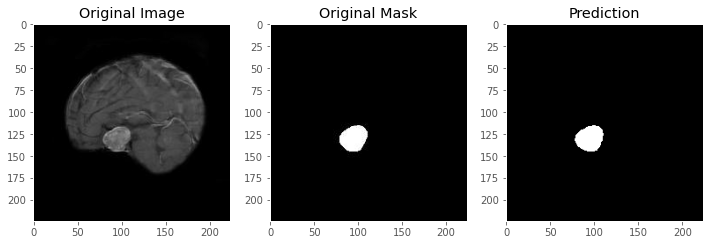

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1278.jpeg


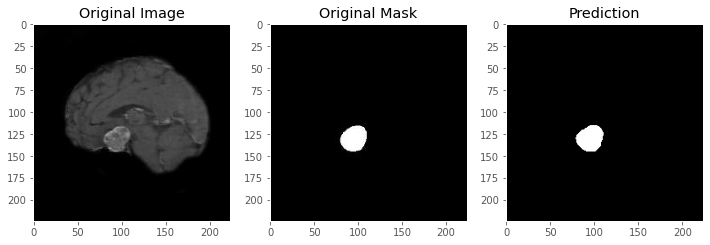

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1279.jpeg


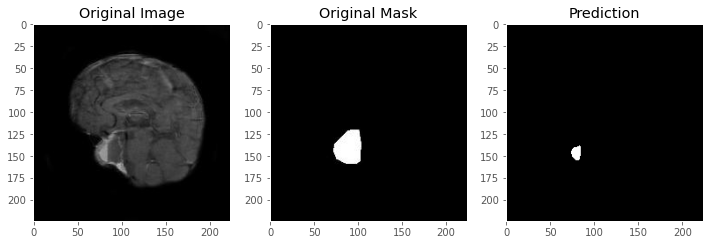

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1280.jpeg


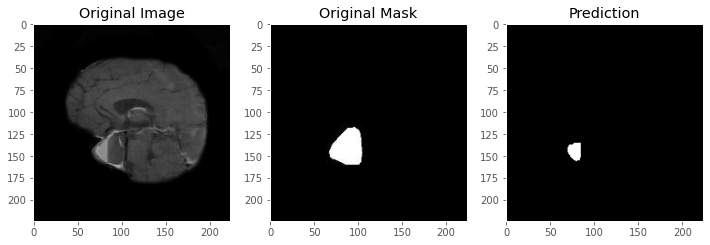

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1281.jpeg


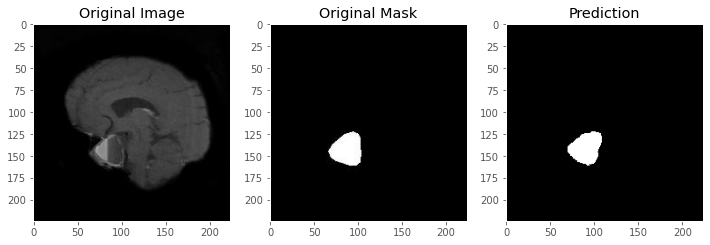

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1282.jpeg


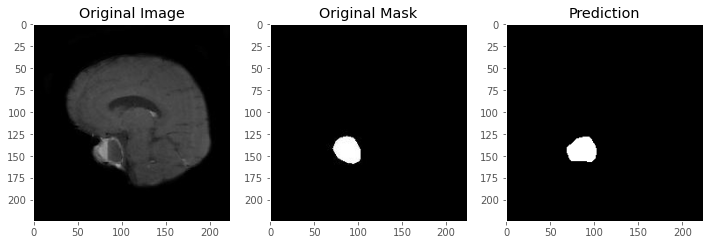

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_135.jpeg


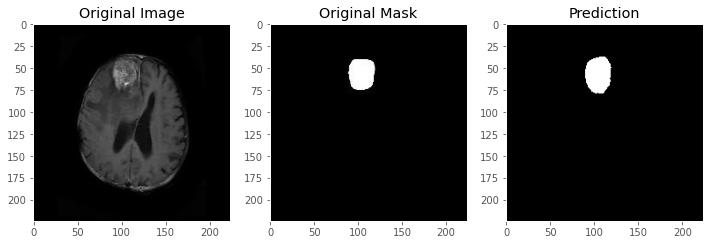

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_136.jpeg


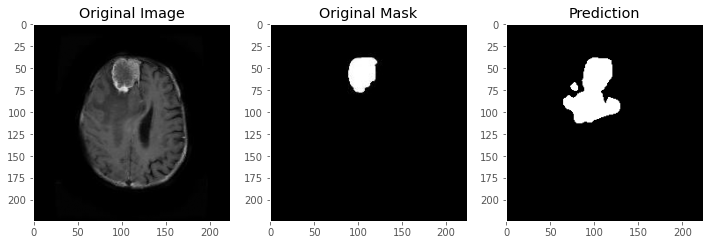

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_137.jpeg


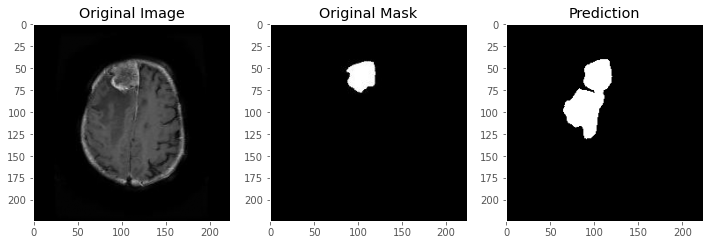

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_138.jpeg


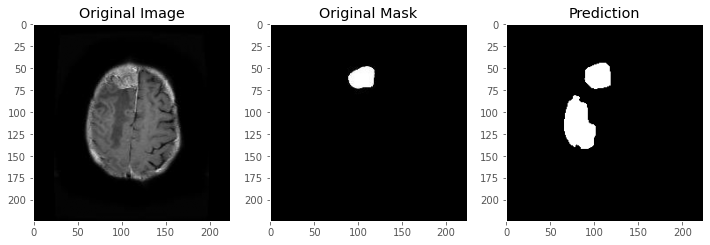

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_139.jpeg


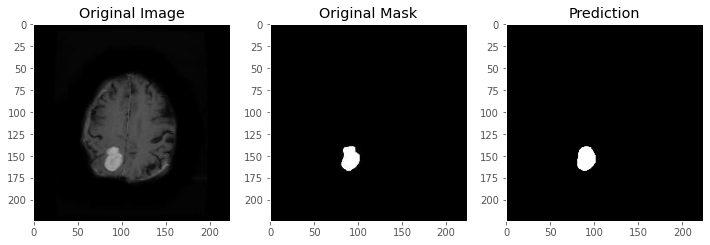

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_140.jpeg


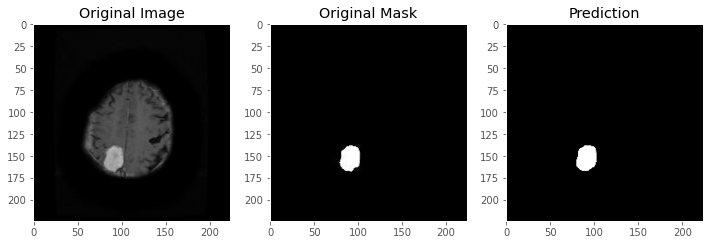

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_141.jpeg


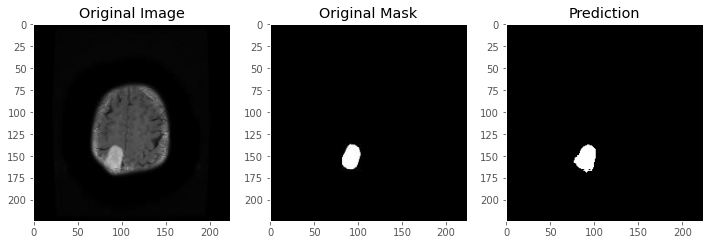

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_142.jpeg


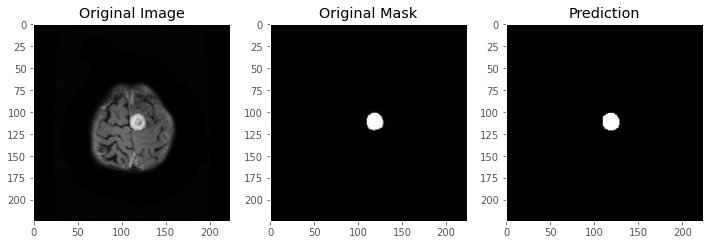

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_143.jpeg


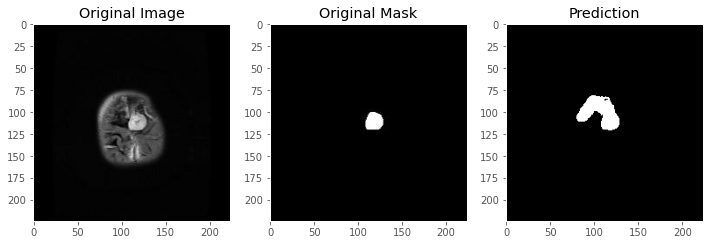

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_144.jpeg


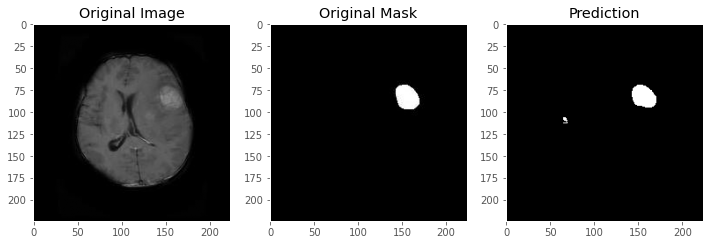

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_145.jpeg


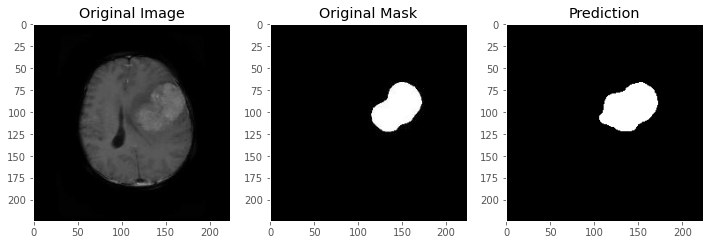

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_146.jpeg


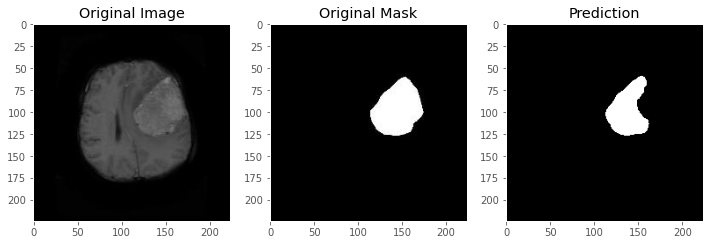

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_147.jpeg


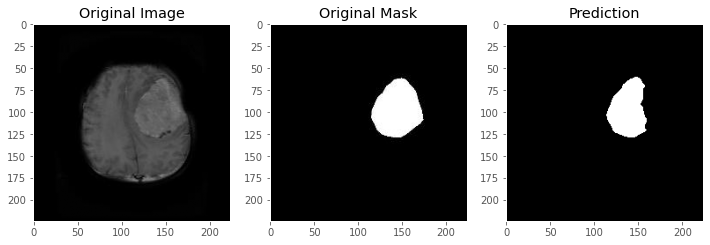

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_148.jpeg


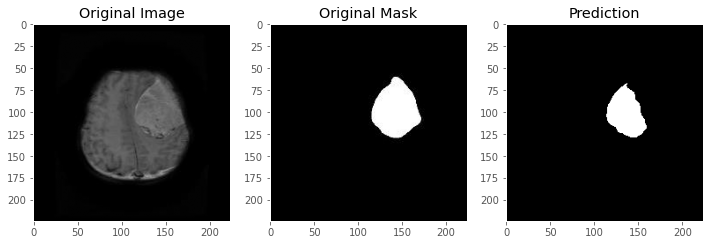

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_149.jpeg


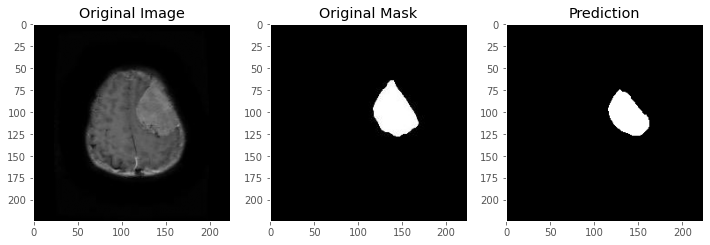

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_150.jpeg


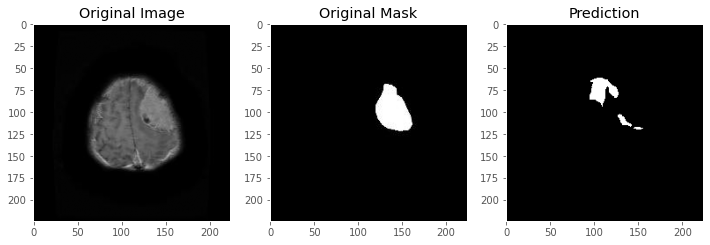

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_151.jpeg


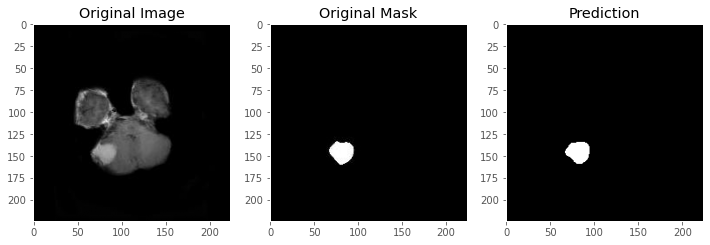

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_152.jpeg


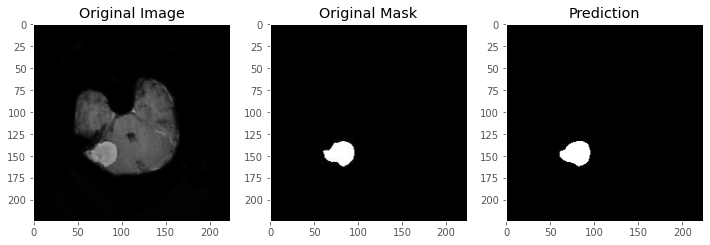

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_153.jpeg


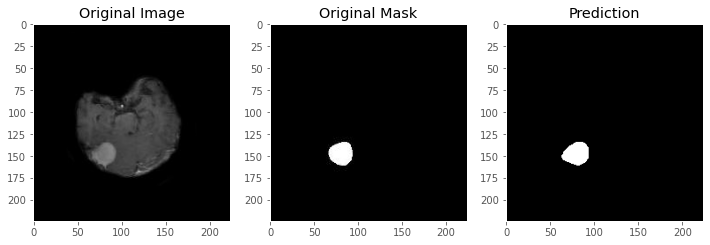

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_154.jpeg


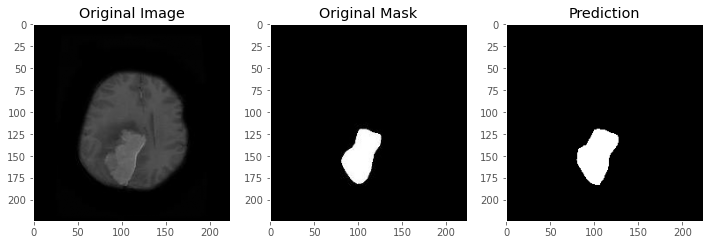

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_155.jpeg


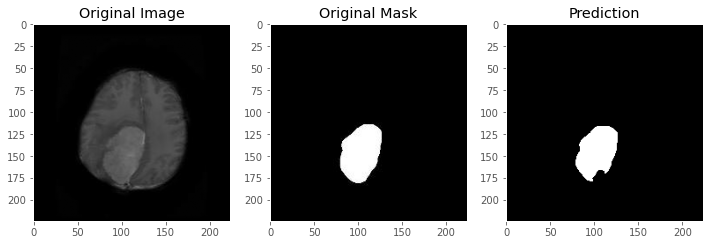

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_156.jpeg


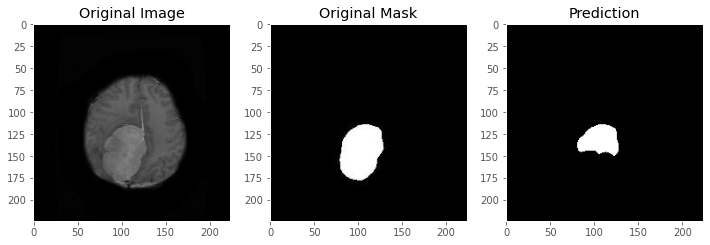

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_157.jpeg


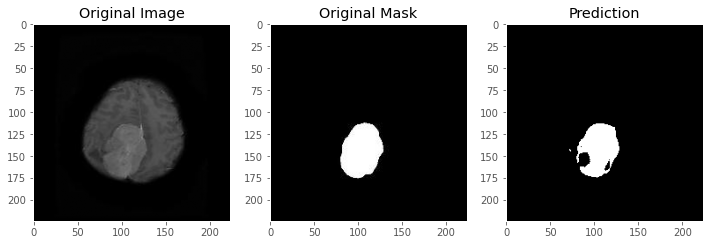

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_158.jpeg


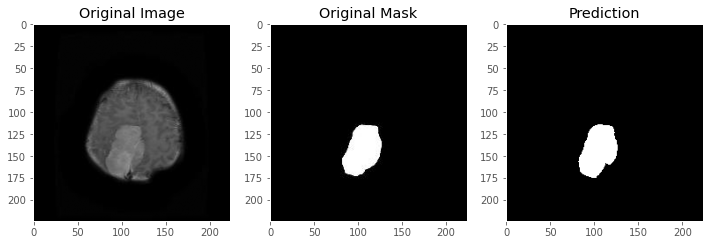

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_159.jpeg


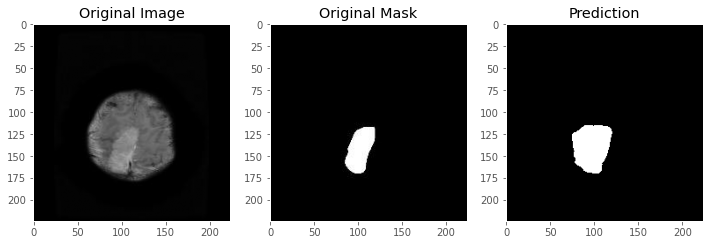

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_160.jpeg


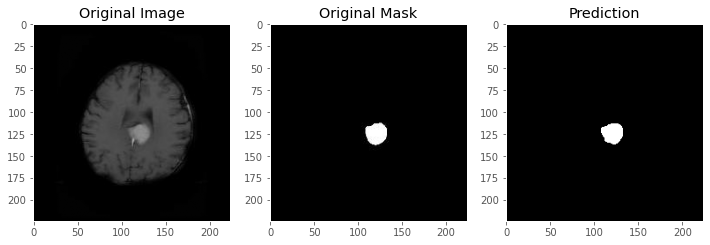

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_161.jpeg


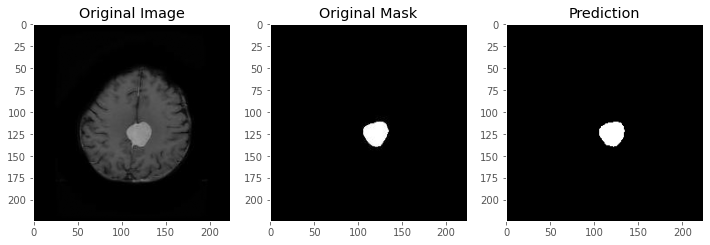

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_162.jpeg


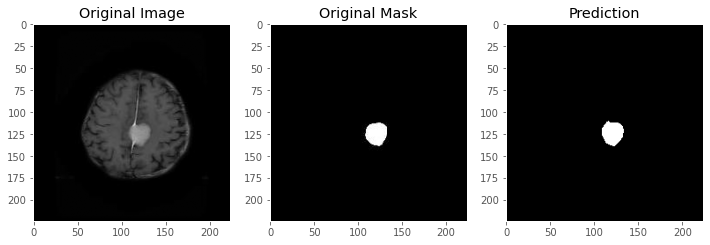

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_163.jpeg


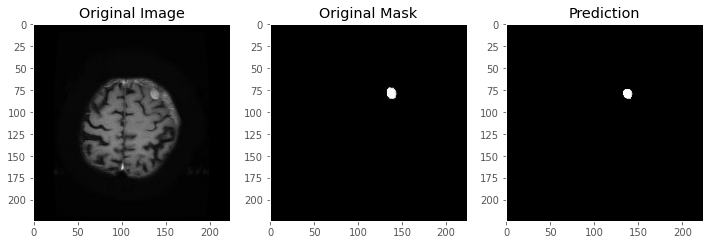

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_164.jpeg


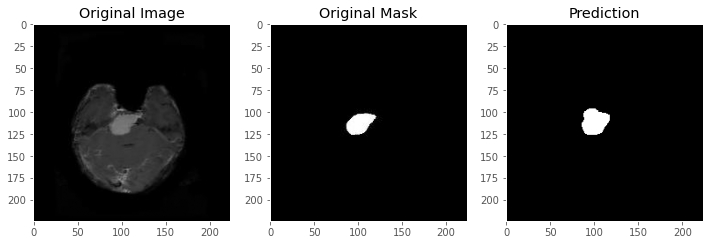

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_165.jpeg


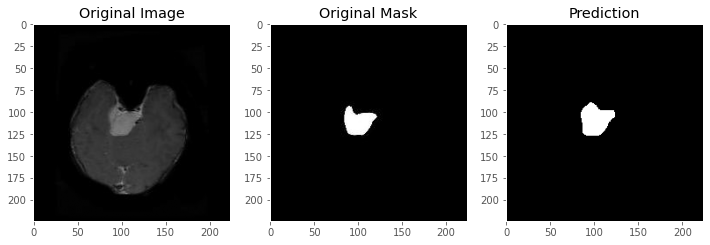

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_166.jpeg


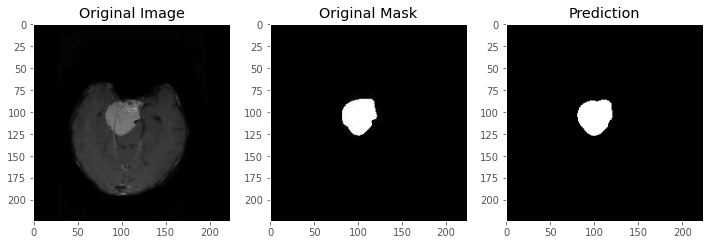

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_167.jpeg


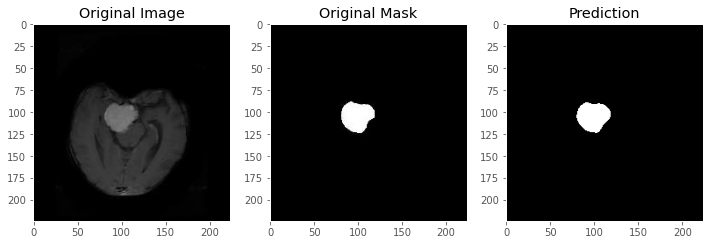

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_168.jpeg


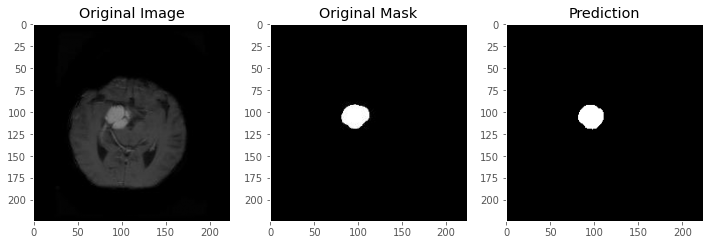

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_169.jpeg


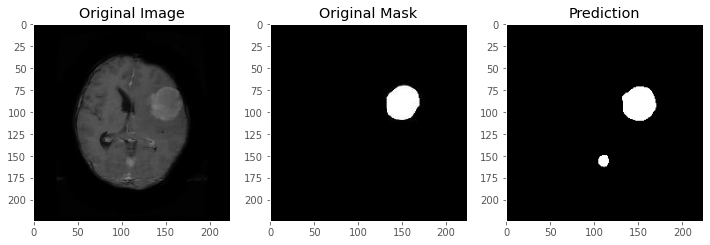

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_170.jpeg


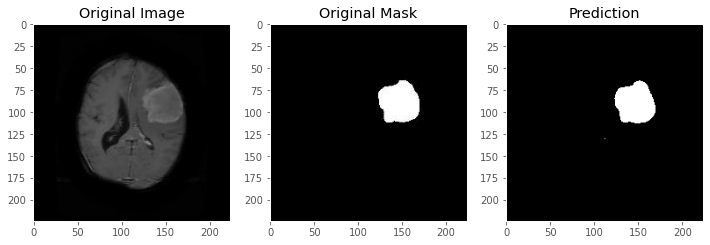

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_171.jpeg


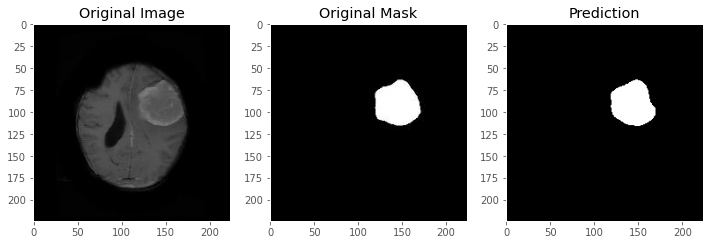

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_172.jpeg


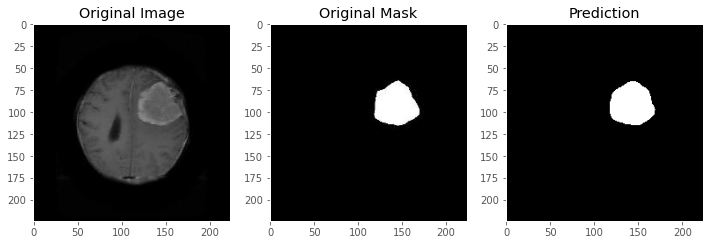

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_173.jpeg


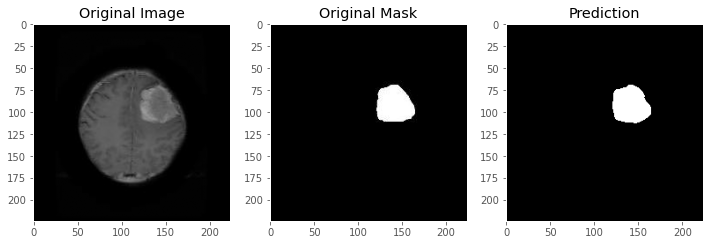

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_174.jpeg


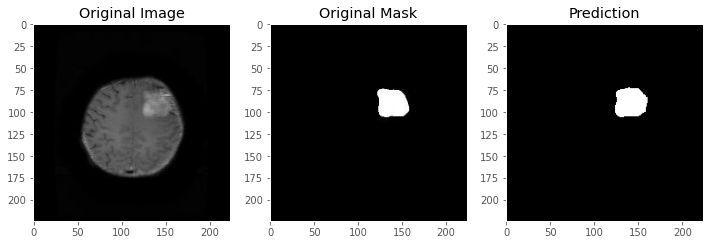

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1998.jpeg


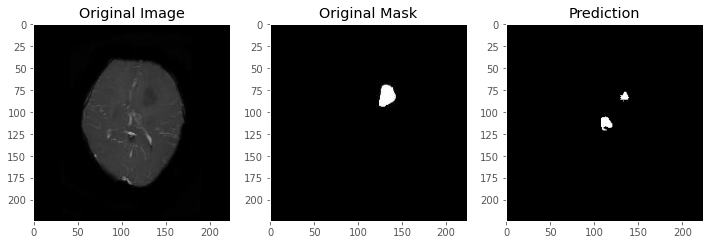

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_1999.jpeg


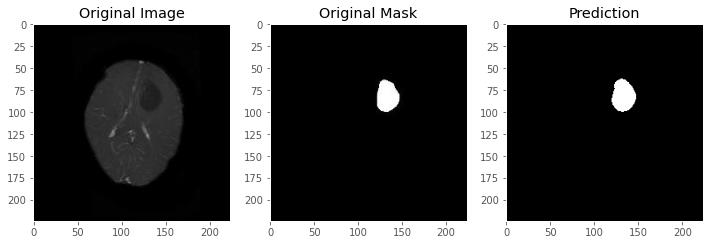

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2000.jpeg


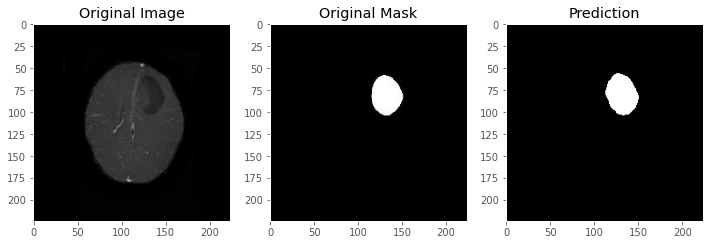

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2001.jpeg


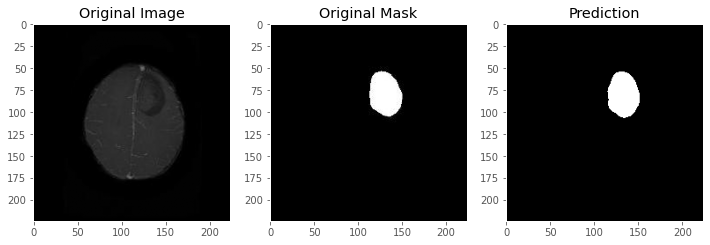

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2002.jpeg


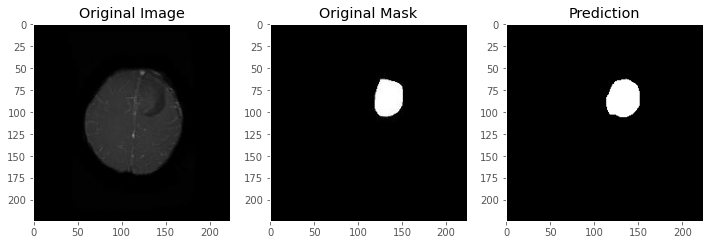

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2003.jpeg


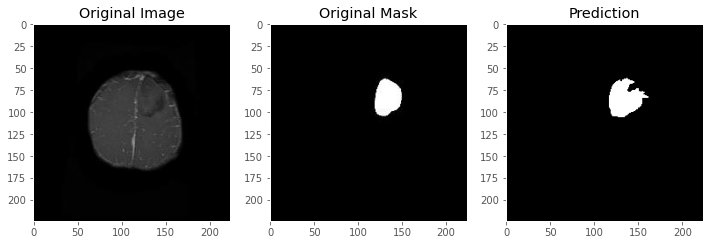

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2004.jpeg


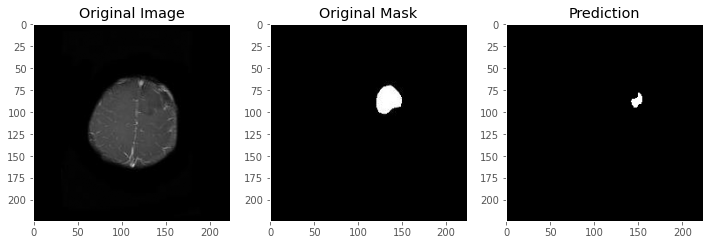

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2005.jpeg


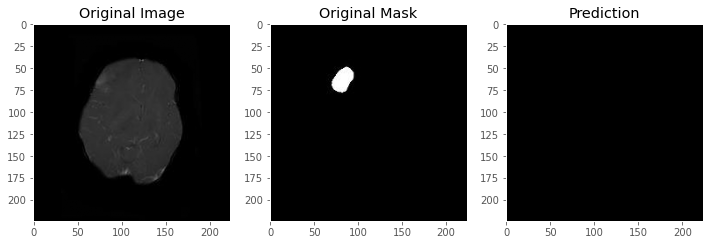

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2006.jpeg


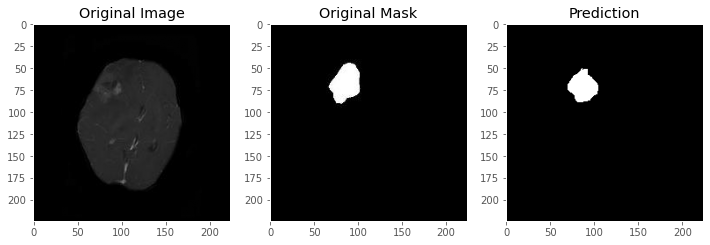

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2007.jpeg


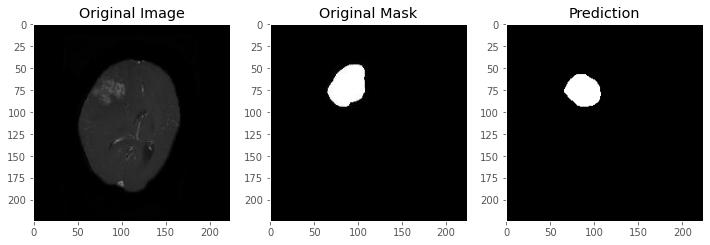

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2008.jpeg


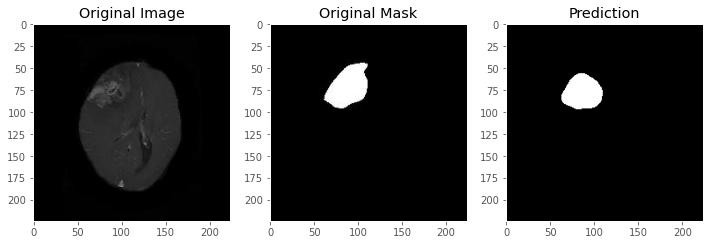

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2009.jpeg


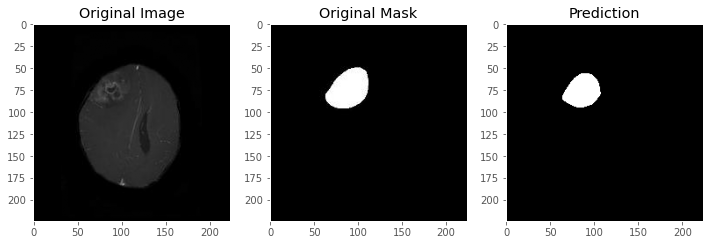

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2010.jpeg


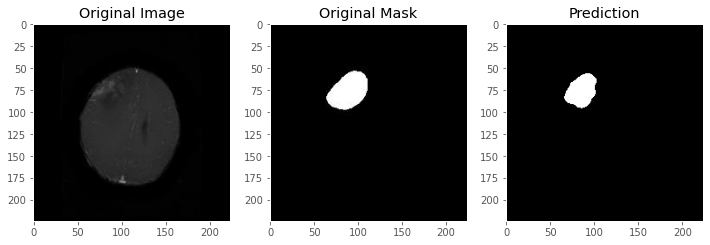

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2011.jpeg


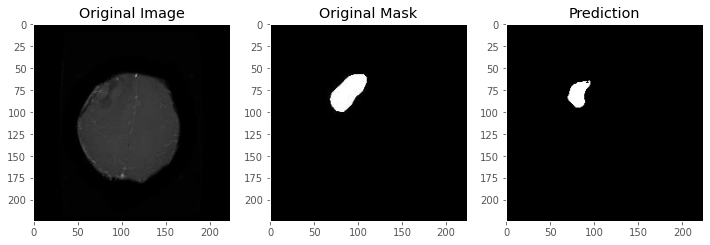

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2012.jpeg


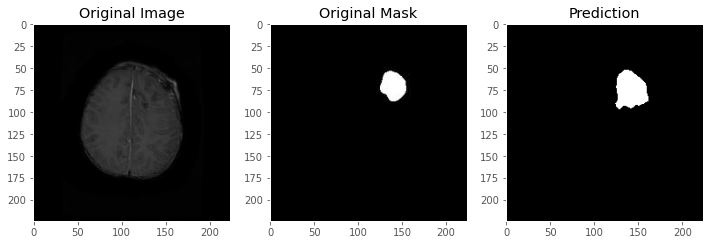

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2013.jpeg


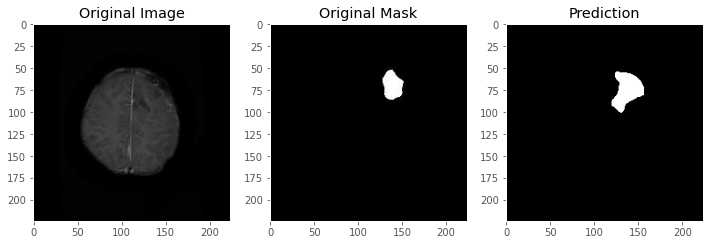

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2014.jpeg


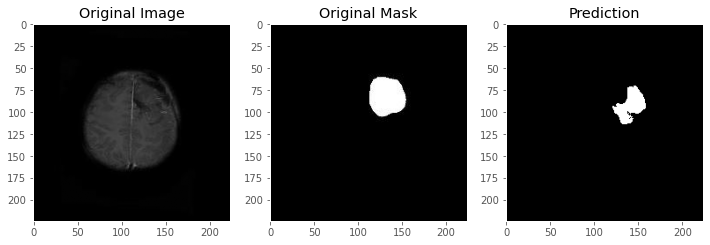

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2015.jpeg


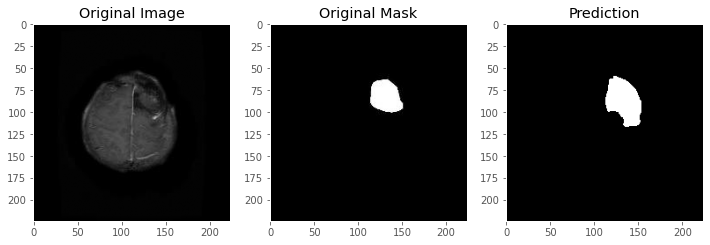

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2016.jpeg


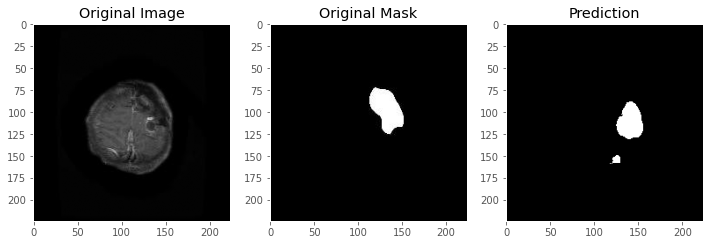

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2017.jpeg


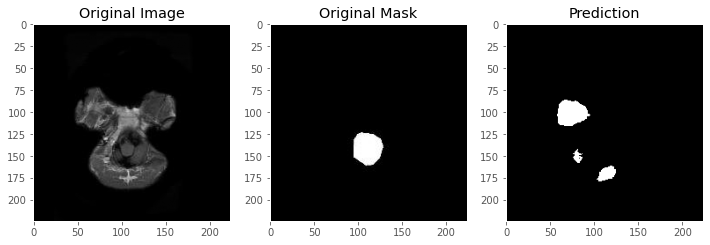

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2018.jpeg


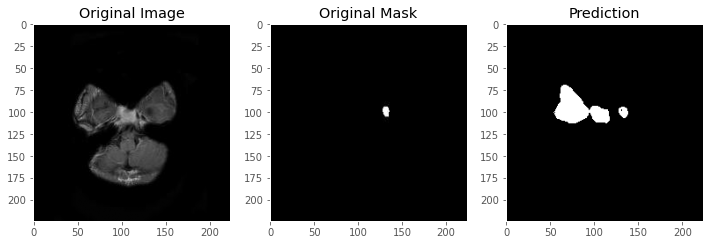

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2019.jpeg


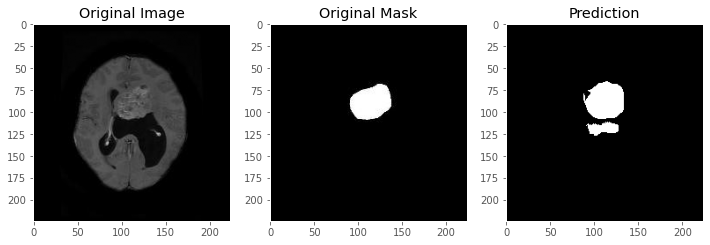

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2020.jpeg


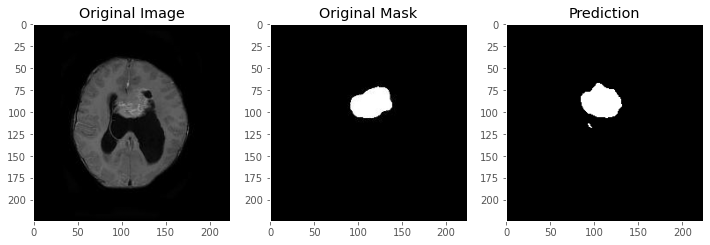

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2021.jpeg


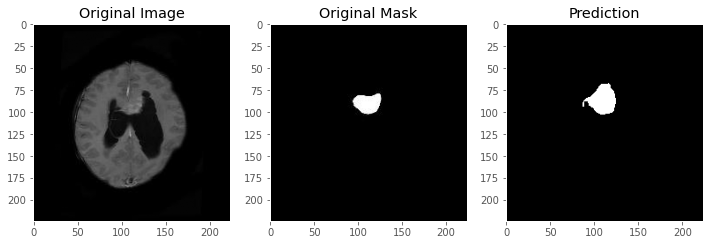

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2022.jpeg


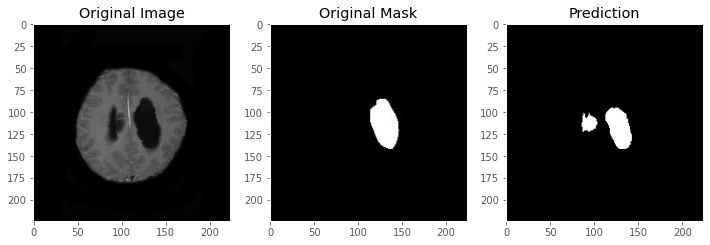

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2023.jpeg


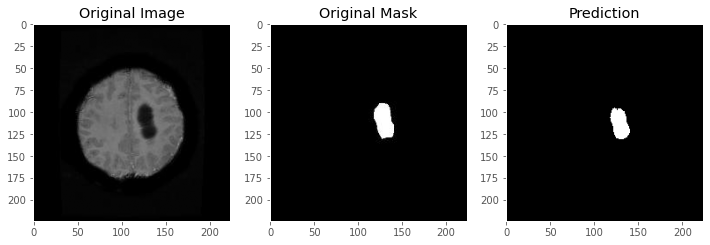

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2024.jpeg


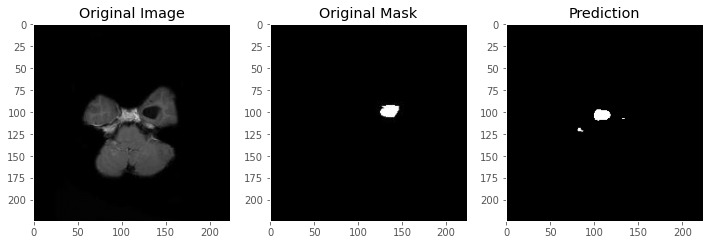

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2025.jpeg


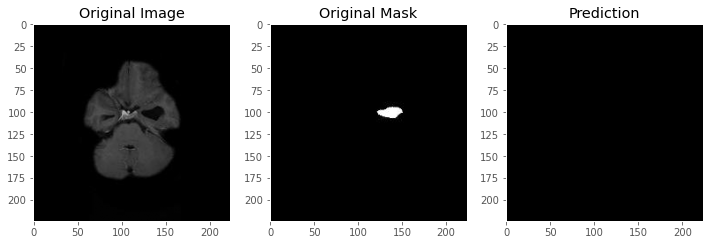

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2026.jpeg


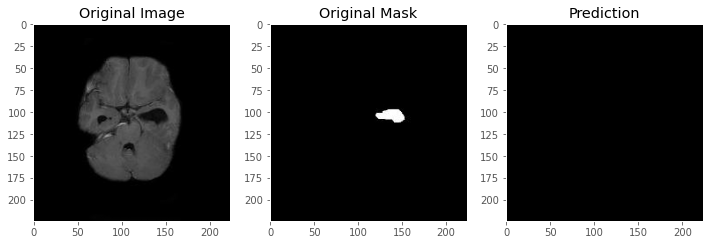

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2027.jpeg


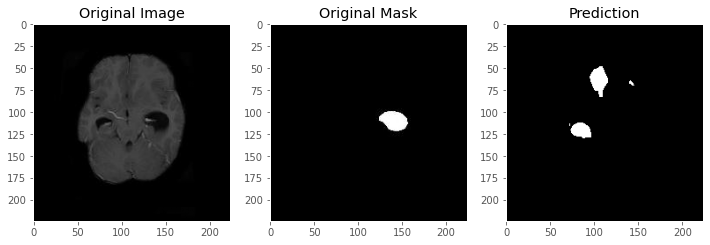

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2028.jpeg


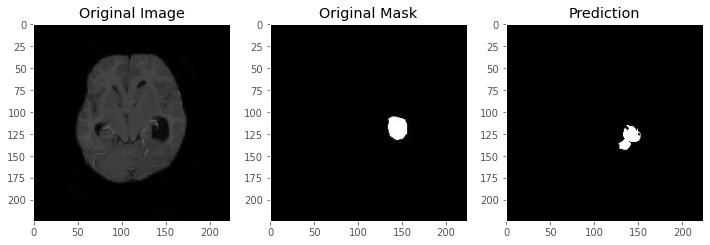

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2029.jpeg


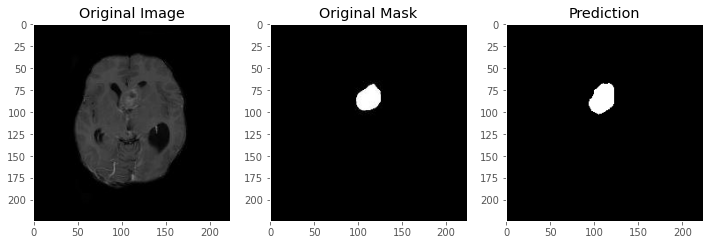

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2030.jpeg


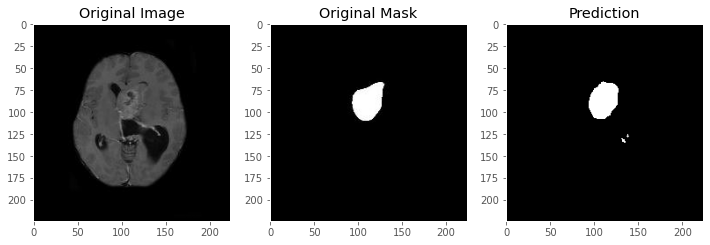

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2031.jpeg


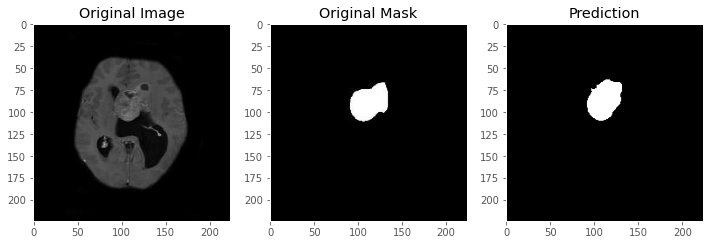

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2032.jpeg


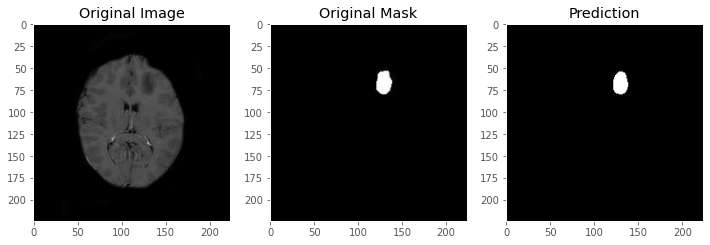

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2033.jpeg


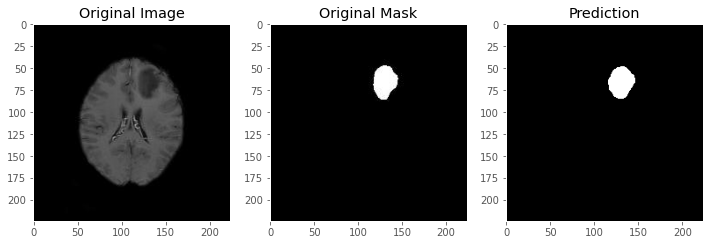

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2034.jpeg


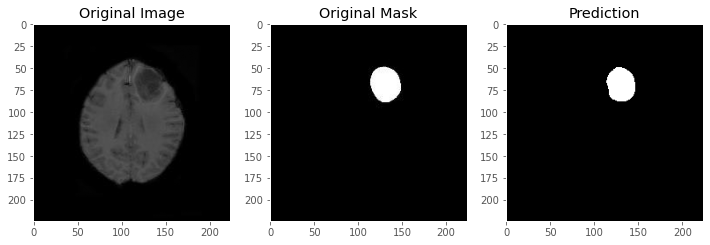

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2035.jpeg


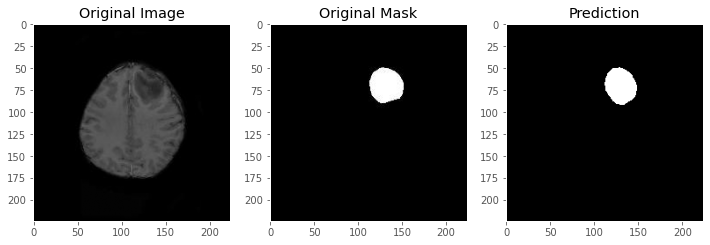

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2036.jpeg


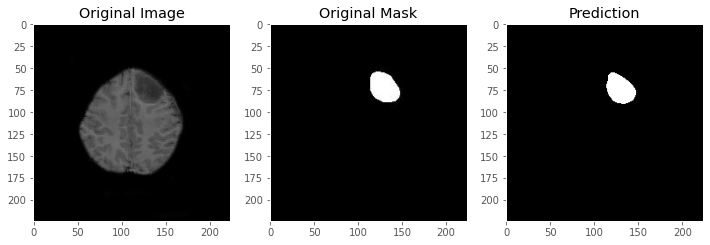

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2037.jpeg


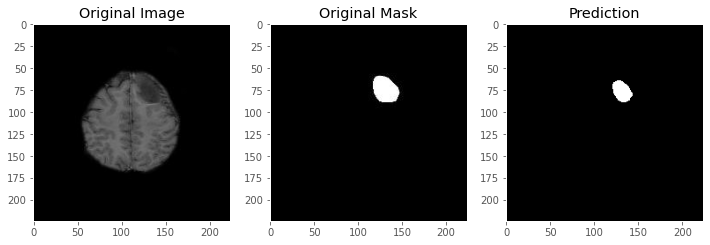

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2038.jpeg


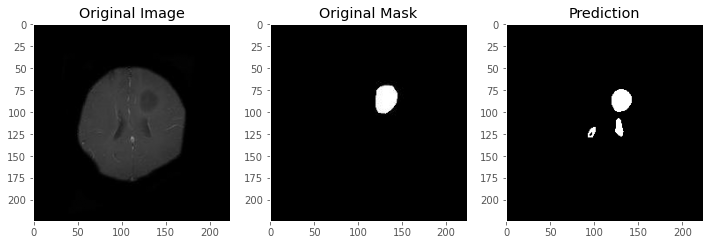

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2039.jpeg


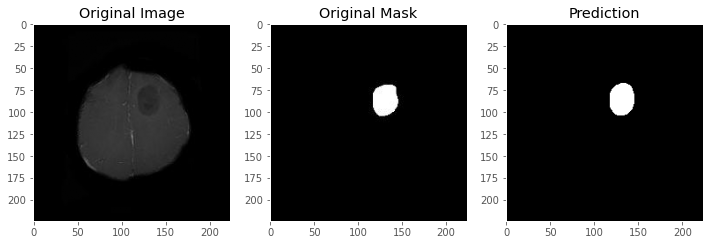

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2040.jpeg


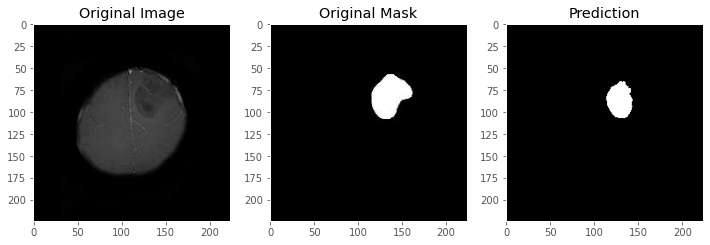

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2041.jpeg


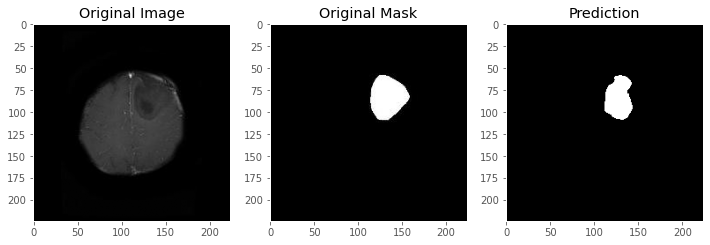

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2042.jpeg


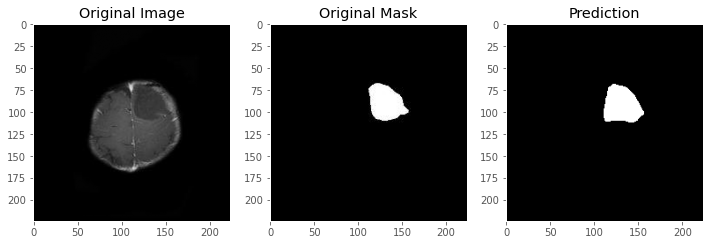

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2043.jpeg


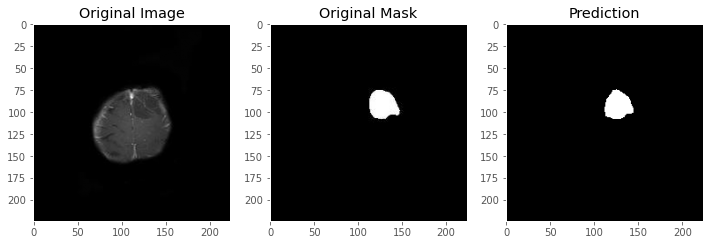

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2044.jpeg


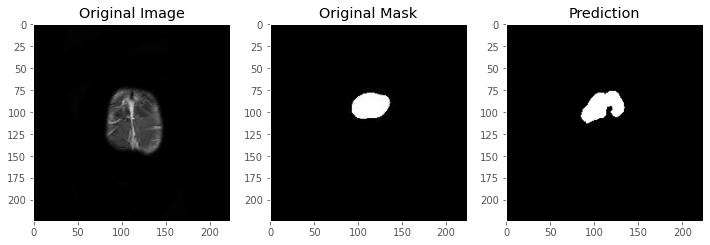

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2045.jpeg


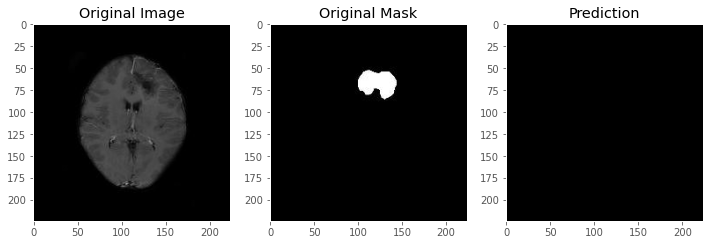

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2046.jpeg


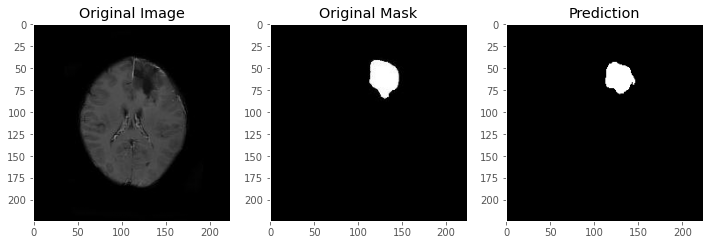

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2047.jpeg


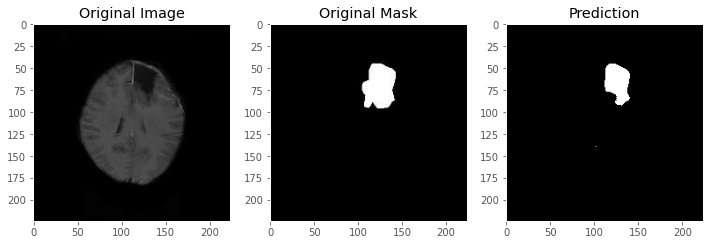

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2048.jpeg


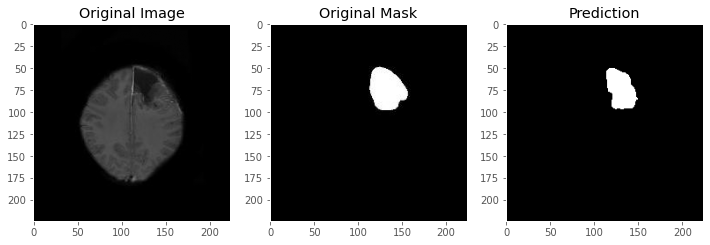

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2049.jpeg


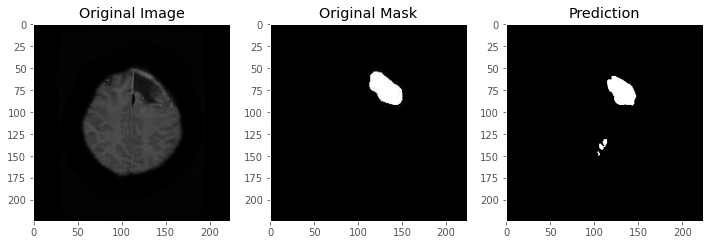

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2050.jpeg


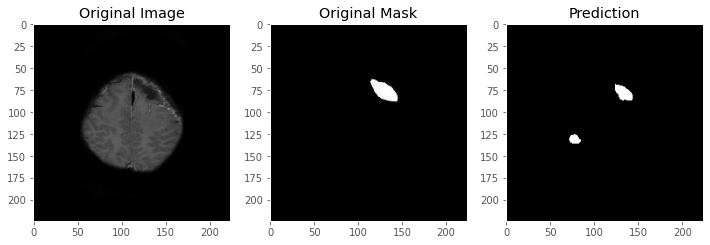

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2051.jpeg


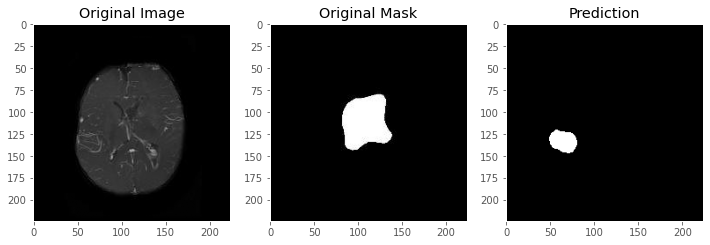

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2052.jpeg


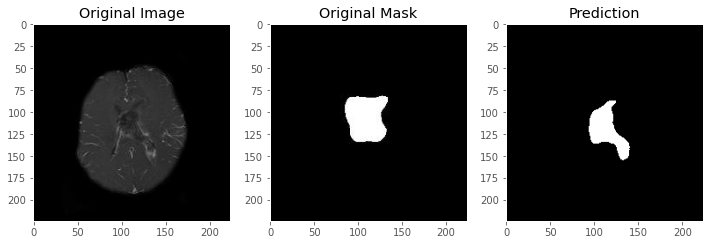

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2053.jpeg


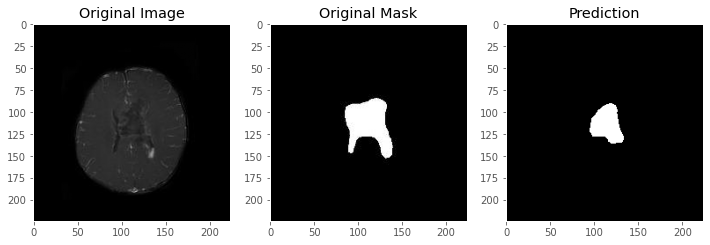

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2054.jpeg


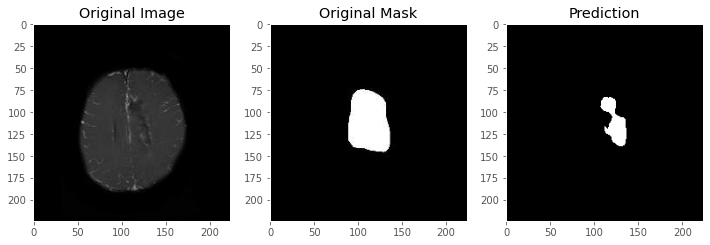

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2055.jpeg


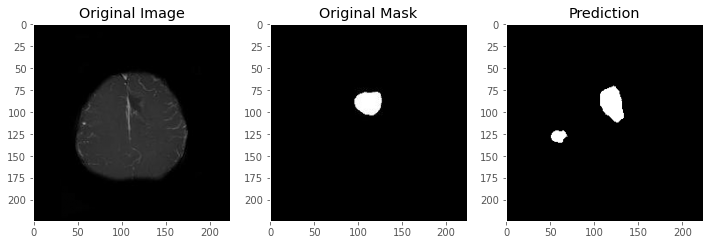

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2056.jpeg


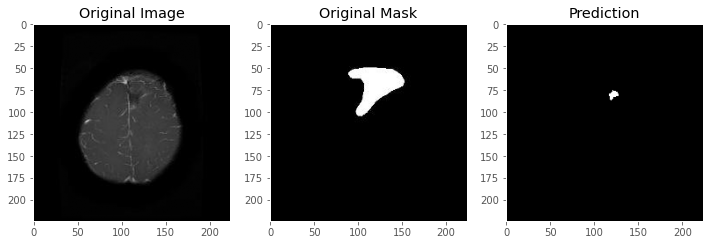

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2057.jpeg


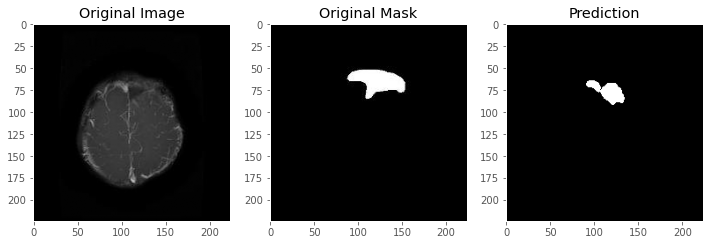

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2058.jpeg


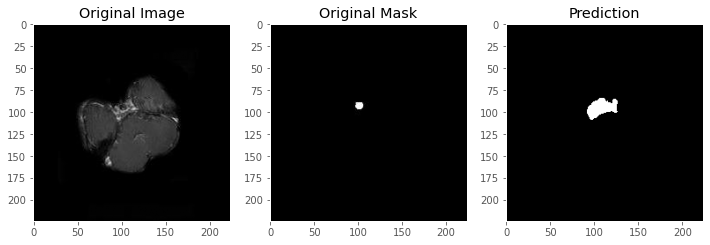

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2059.jpeg


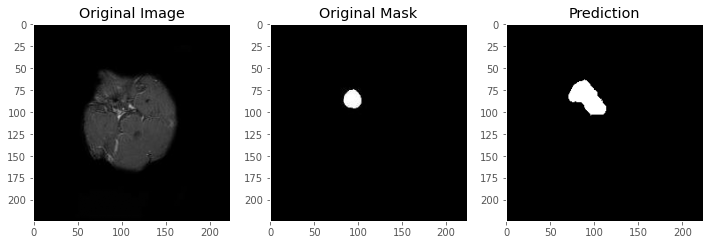

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2060.jpeg


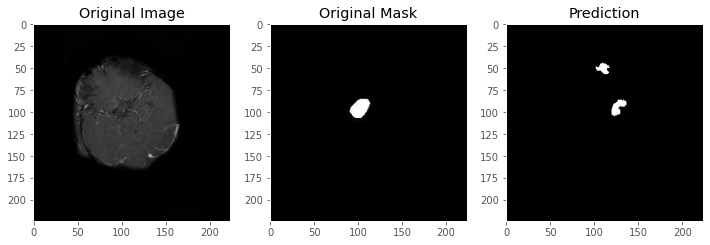

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2061.jpeg


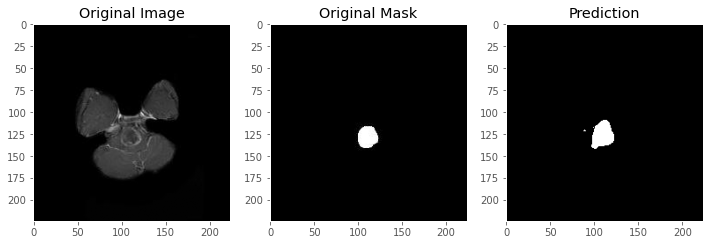

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2062.jpeg


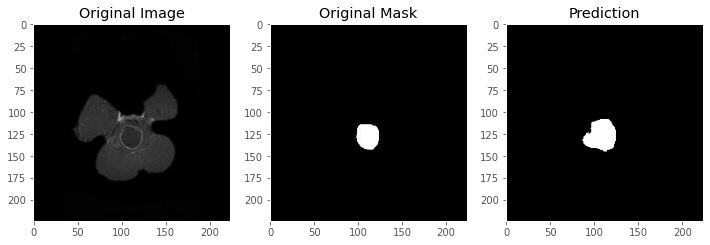

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2063.jpeg


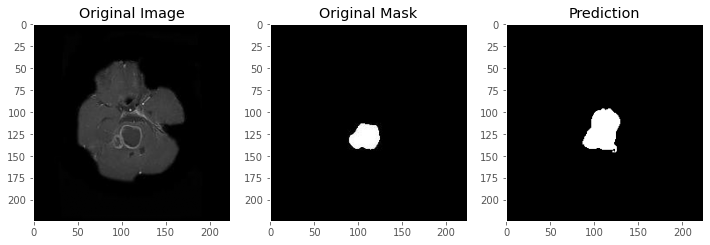

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2064.jpeg


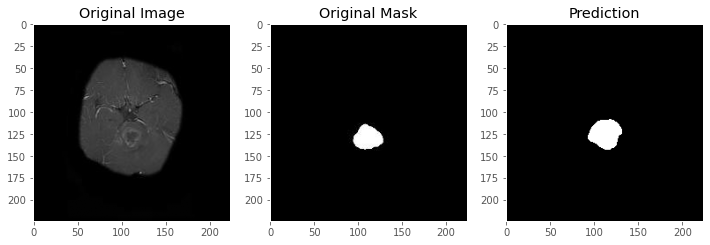

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2065.jpeg


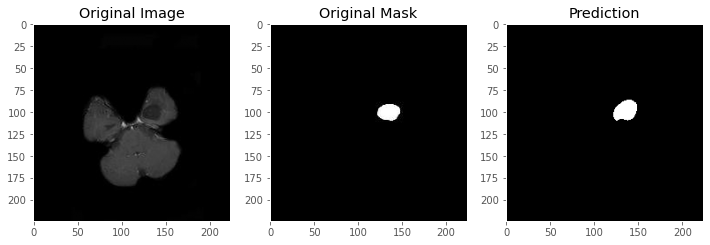

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2066.jpeg


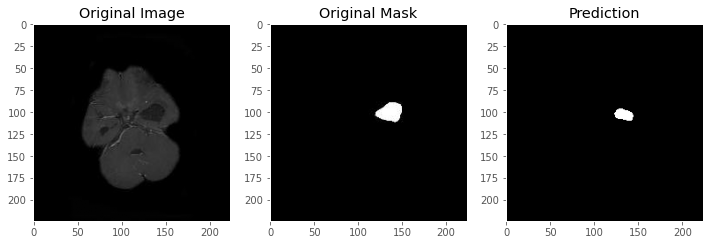

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2067.jpeg


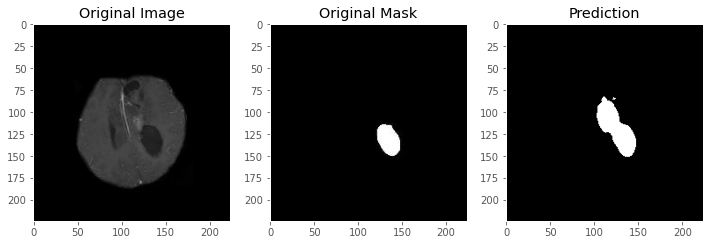

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2068.jpeg


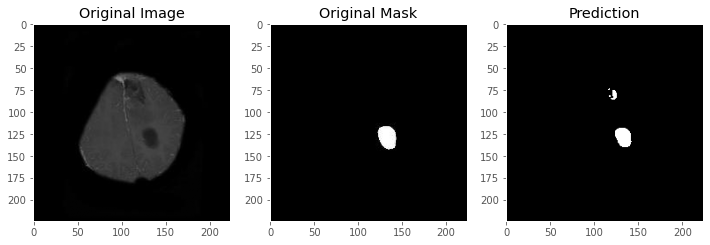

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2069.jpeg


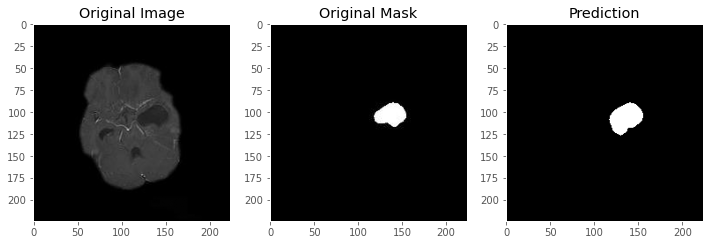

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2070.jpeg


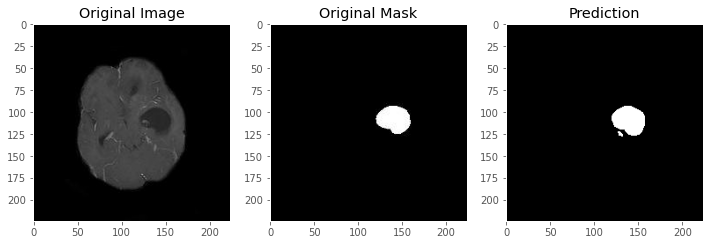

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2071.jpeg


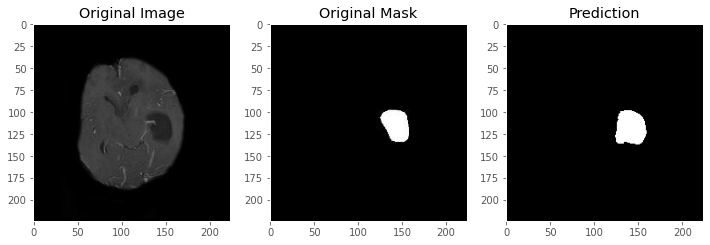

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2072.jpeg


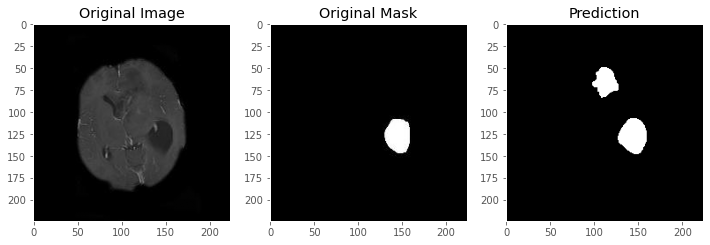

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2073.jpeg


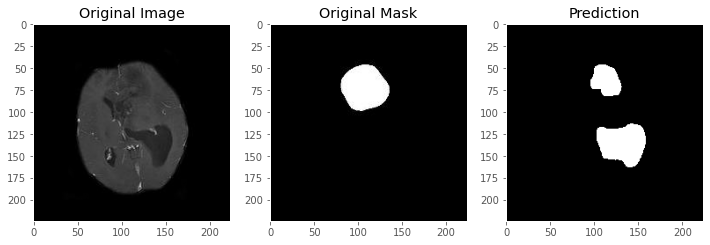

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2074.jpeg


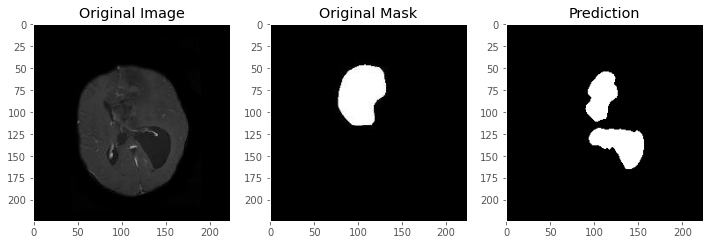

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2075.jpeg


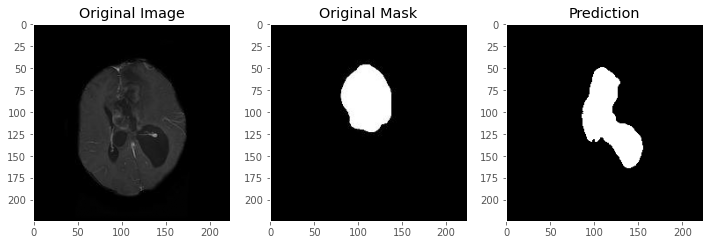

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2076.jpeg


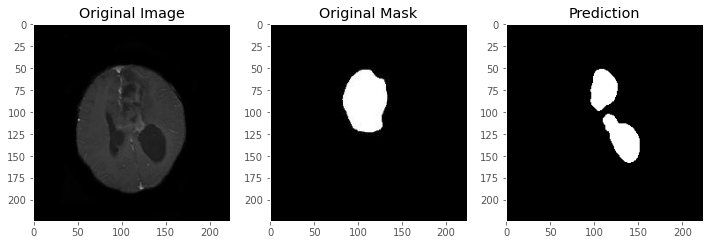

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2080.jpeg


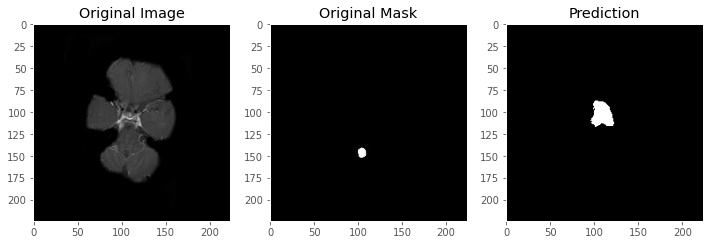

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2081.jpeg


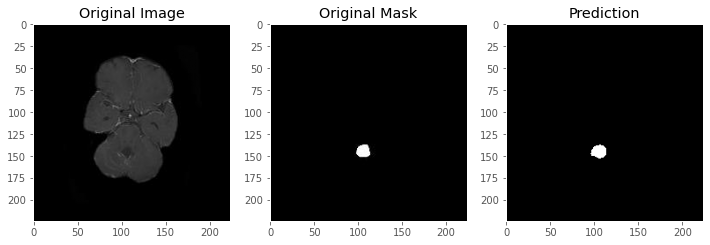

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2082.jpeg


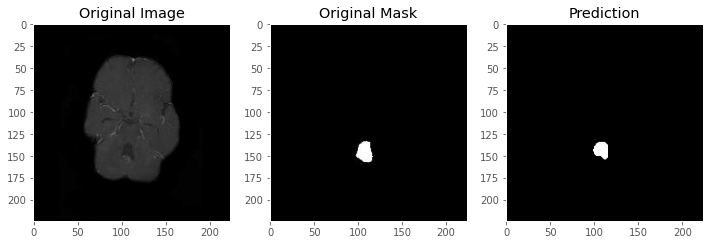

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2087.jpeg


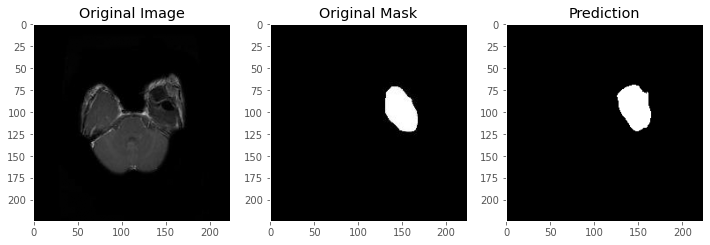

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2088.jpeg


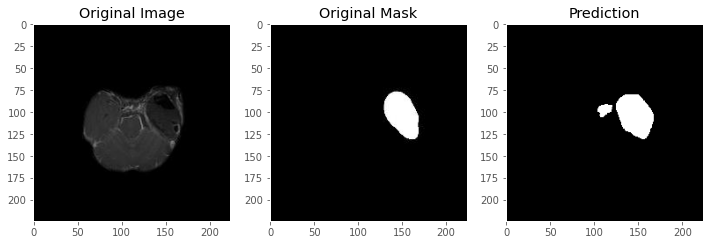

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2089.jpeg


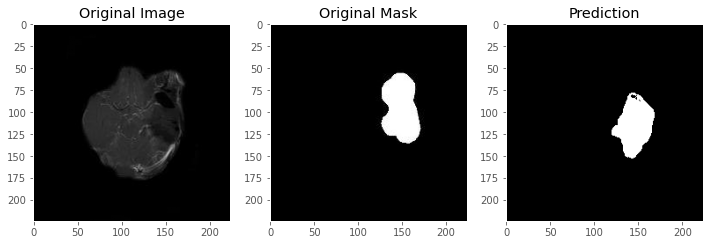

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2090.jpeg


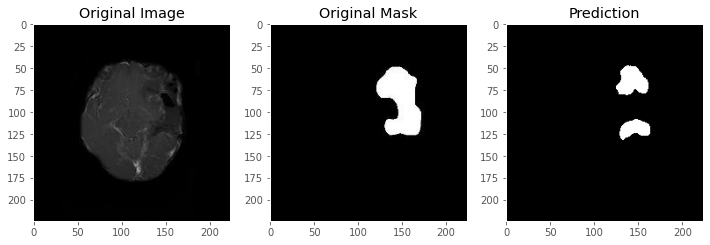

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2091.jpeg


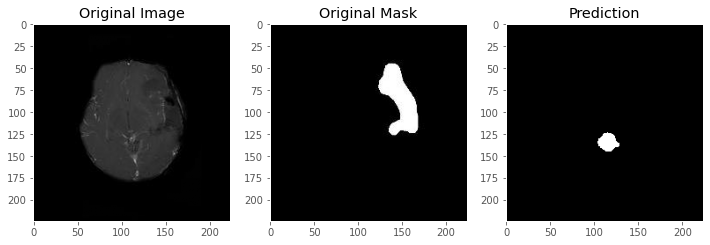

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2092.jpeg


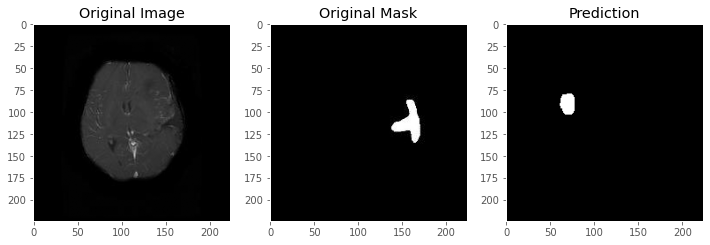

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2097.jpeg


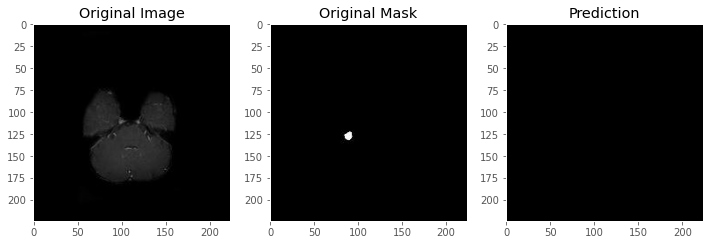

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2098.jpeg


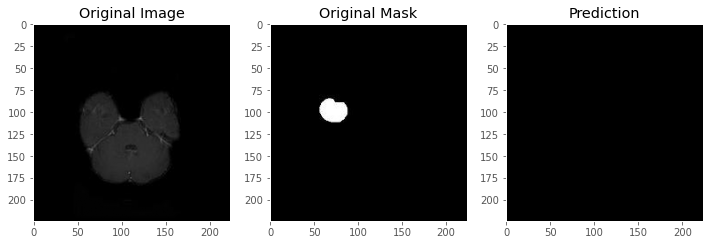

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2099.jpeg


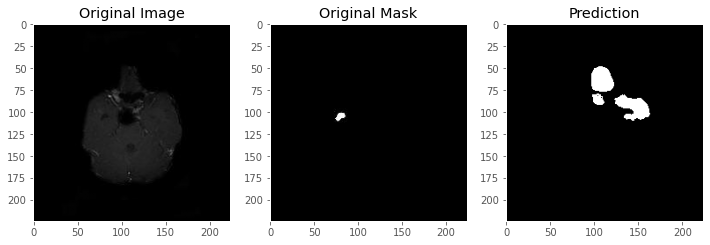

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2100.jpeg


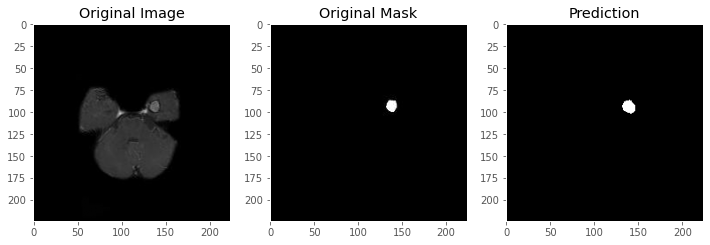

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2101.jpeg


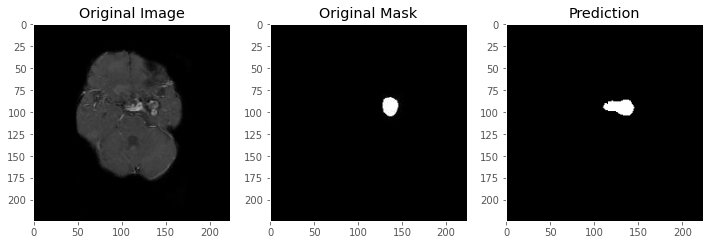

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2102.jpeg


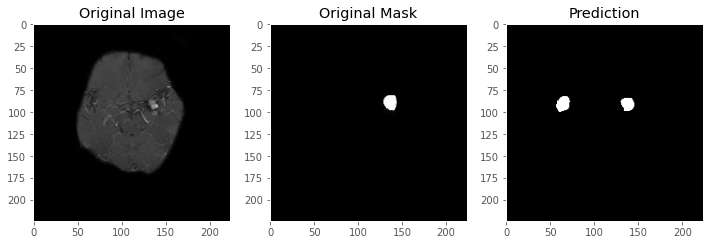

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2103.jpeg


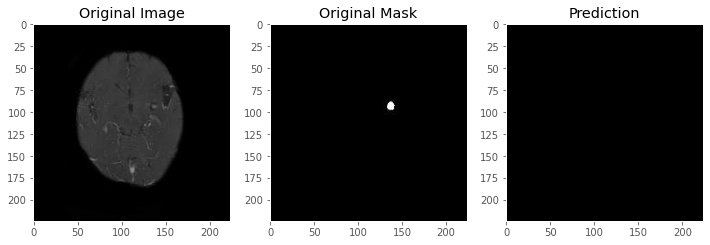

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2109.jpeg


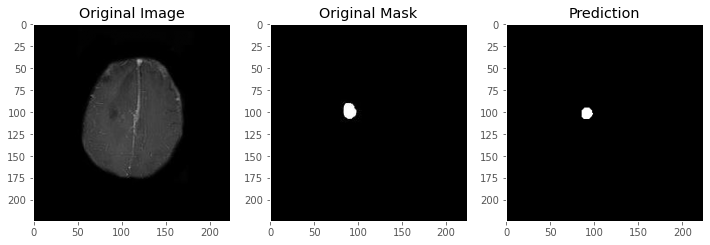

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2110.jpeg


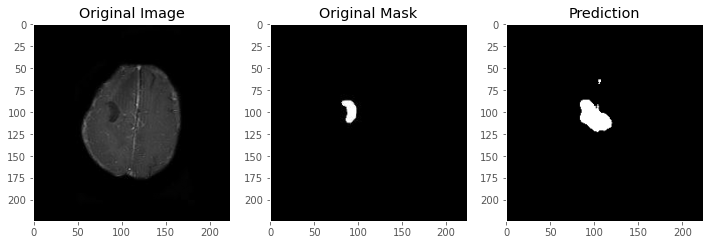

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2111.jpeg


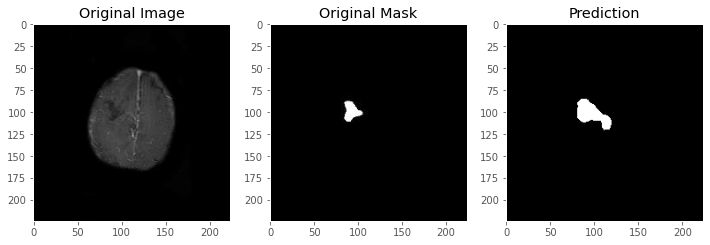

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2128.jpeg


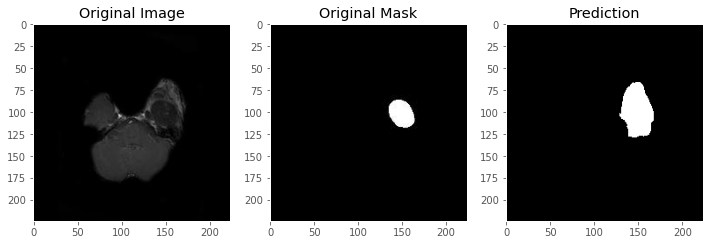

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2129.jpeg


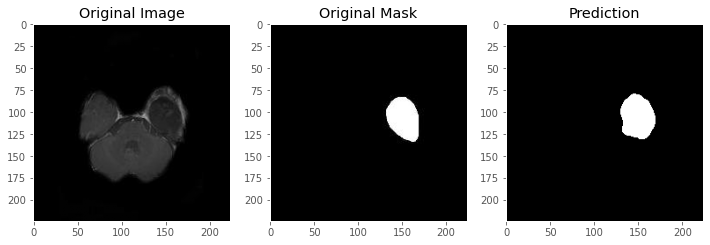

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2130.jpeg


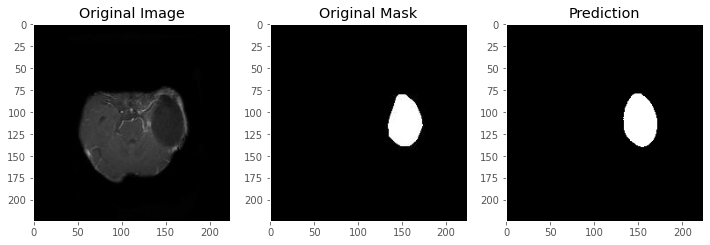

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2131.jpeg


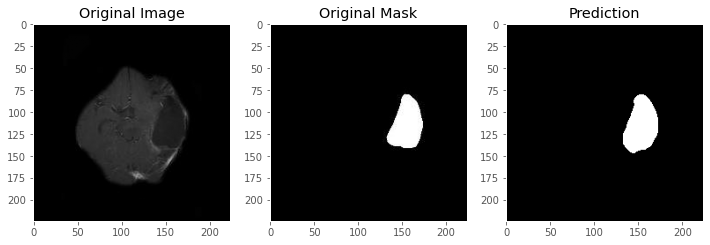

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2132.jpeg


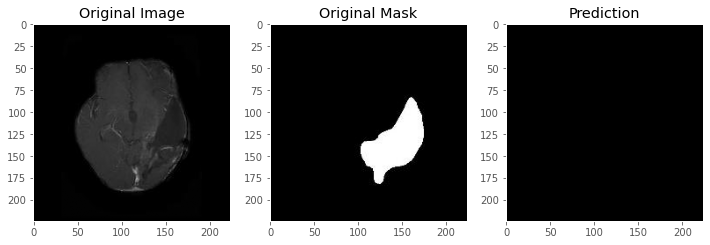

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2133.jpeg


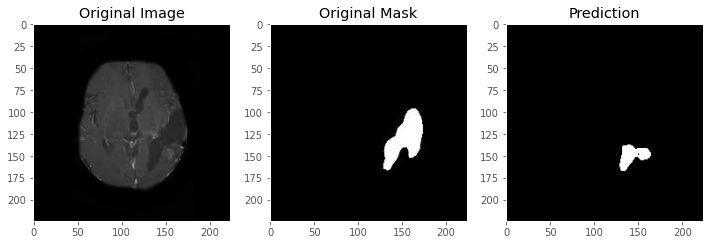

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2333.jpeg


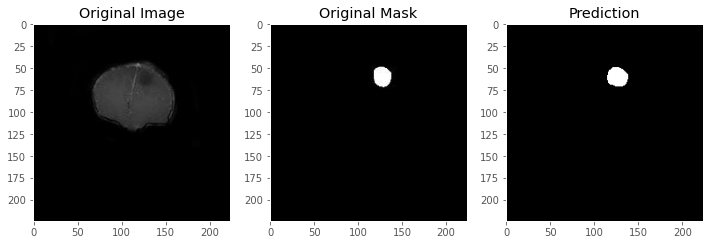

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2334.jpeg


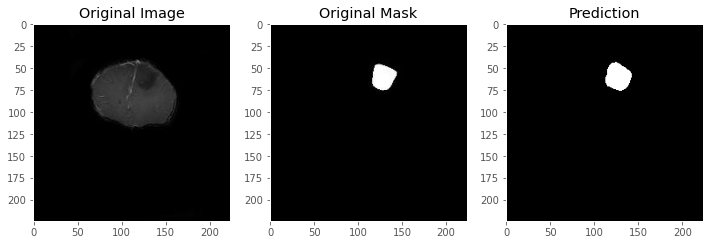

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2335.jpeg


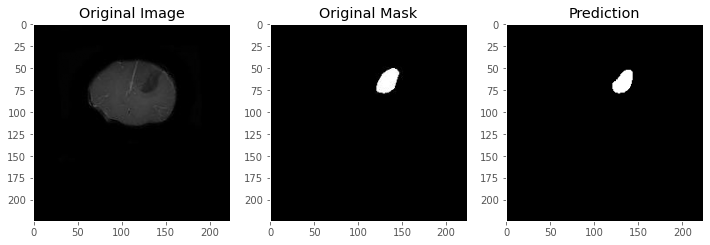

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2336.jpeg


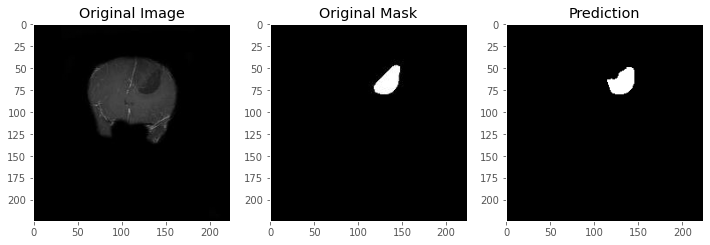

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2337.jpeg


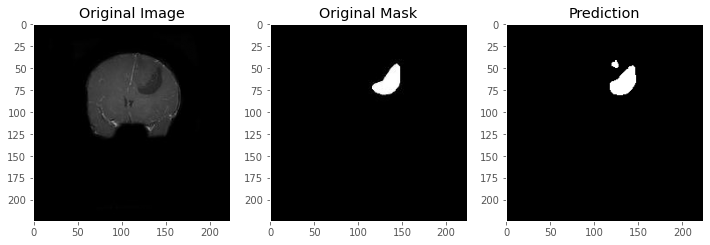

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2338.jpeg


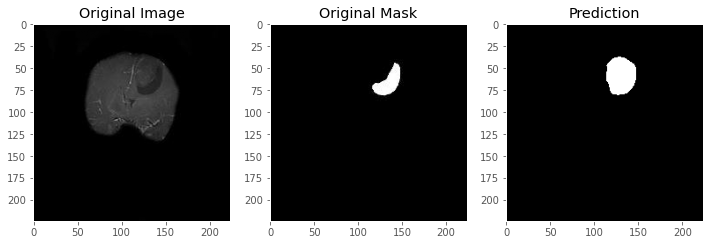

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2339.jpeg


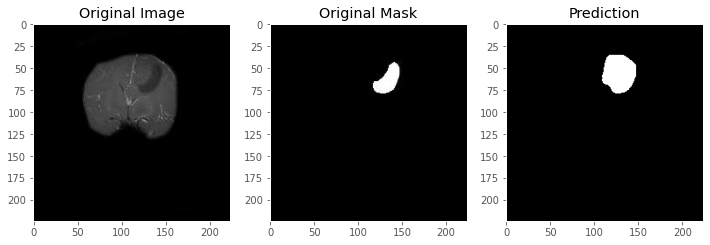

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2340.jpeg


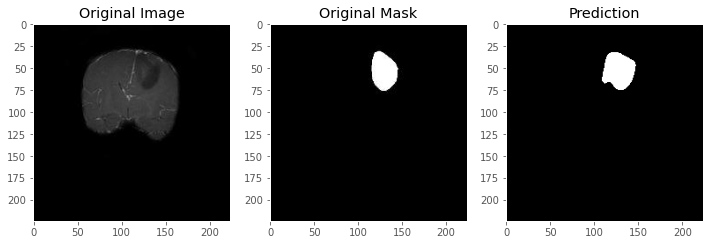

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2341.jpeg


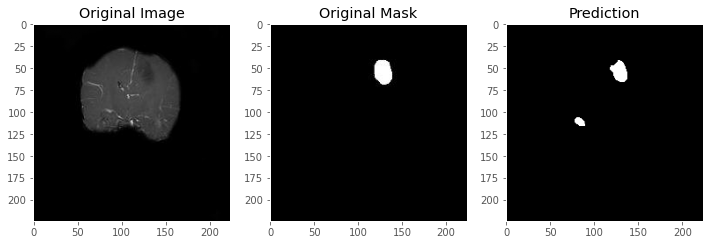

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2342.jpeg


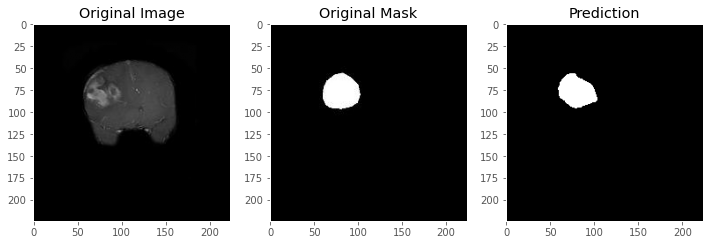

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2343.jpeg


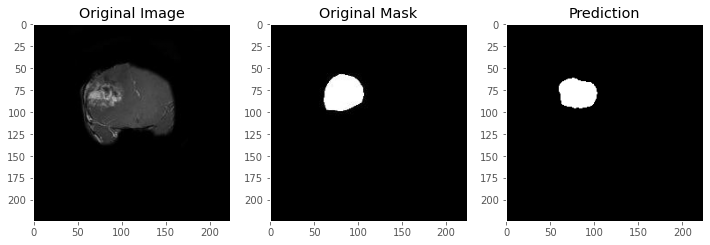

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2546.jpeg


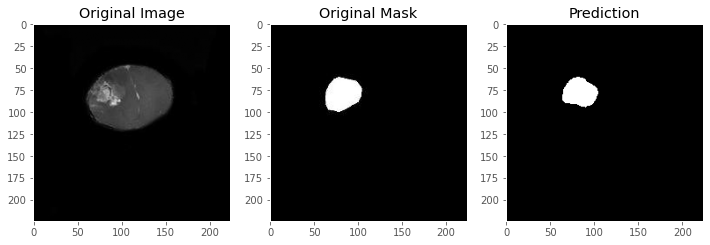

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2547.jpeg


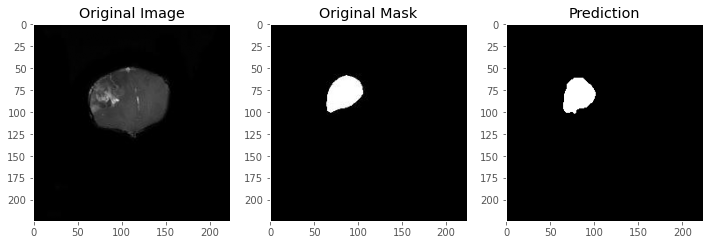

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2548.jpeg


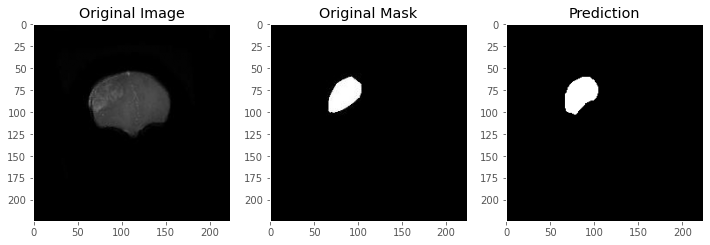

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2549.jpeg


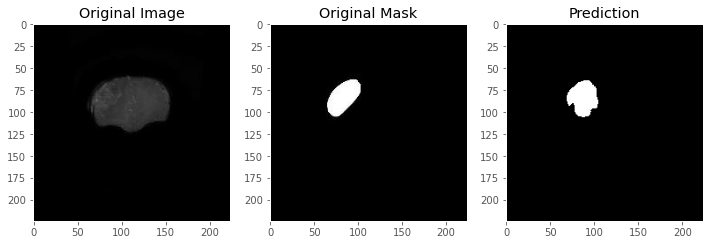

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2550.jpeg


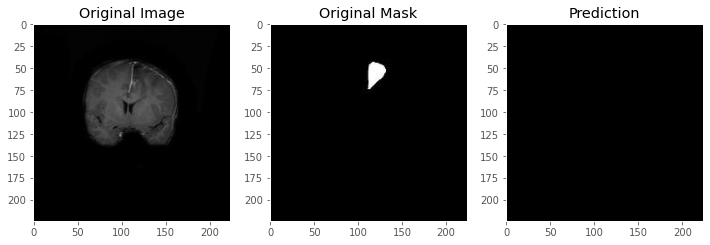

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2551.jpeg


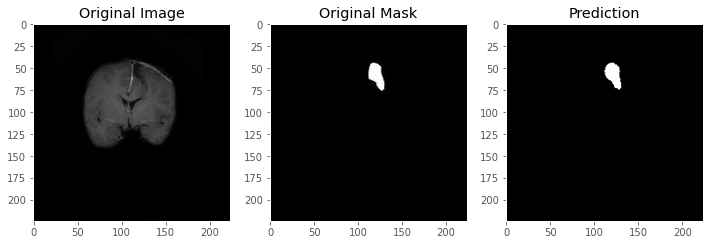

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2552.jpeg


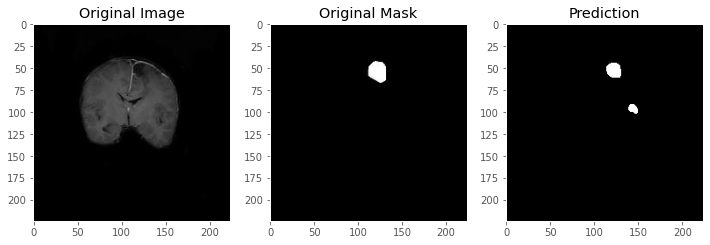

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2553.jpeg


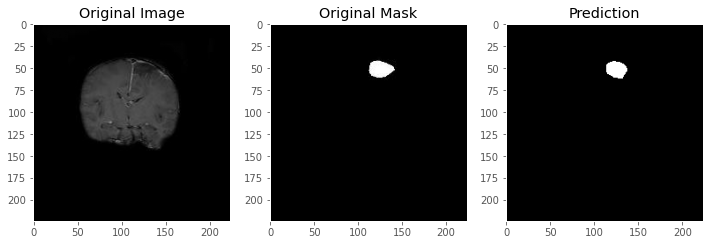

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2554.jpeg


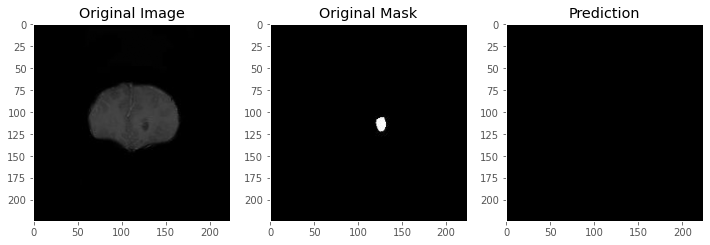

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2555.jpeg


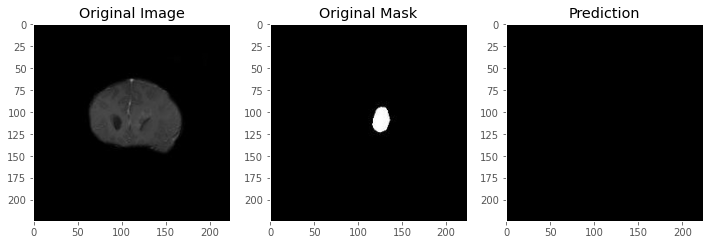

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2556.jpeg


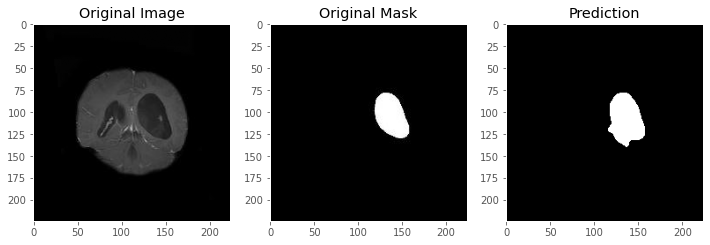

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2557.jpeg


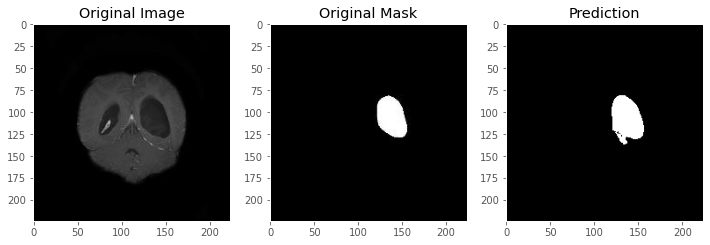

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2558.jpeg


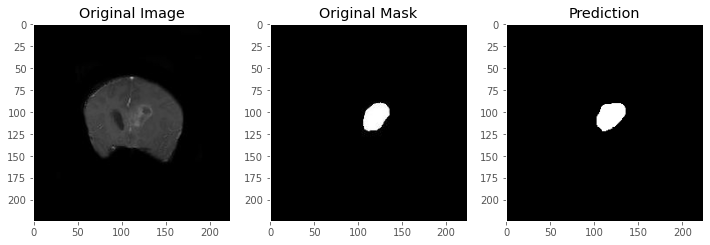

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2559.jpeg


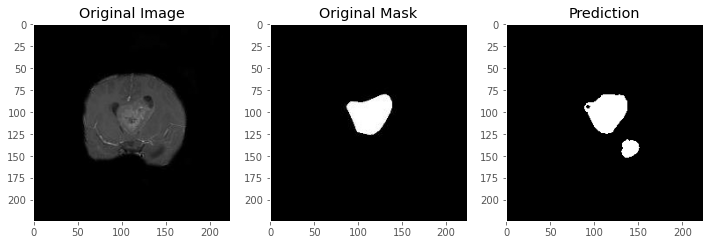

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2560.jpeg


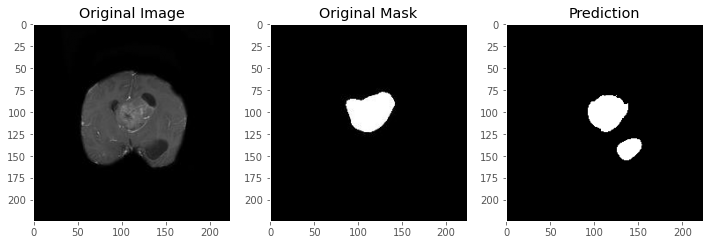

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2561.jpeg


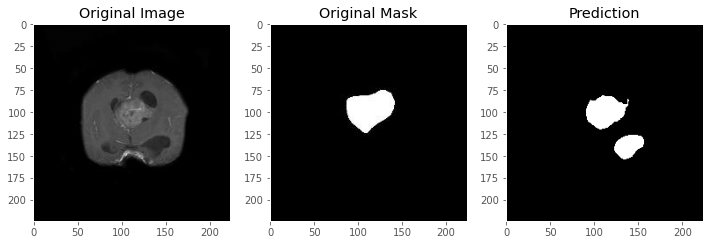

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2562.jpeg


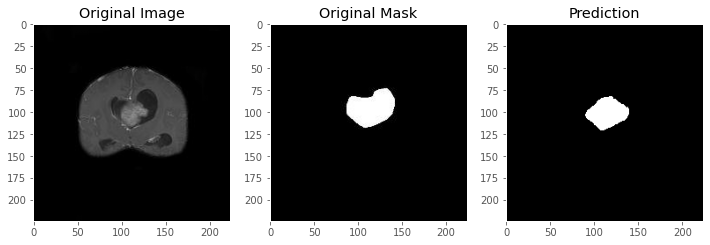

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2563.jpeg


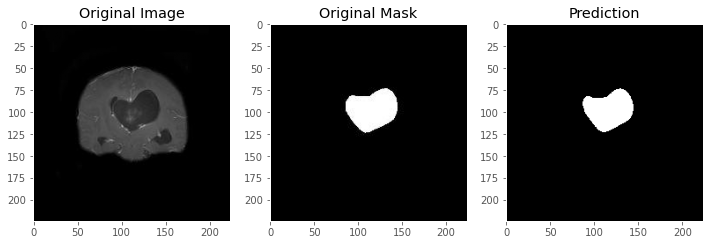

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2564.jpeg


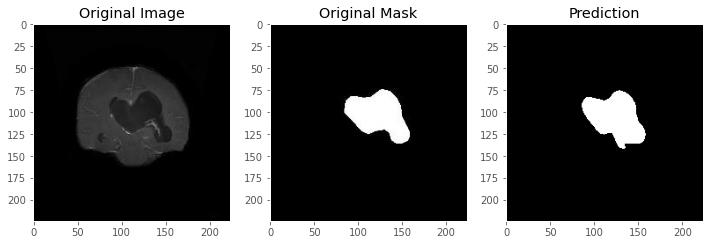

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2565.jpeg


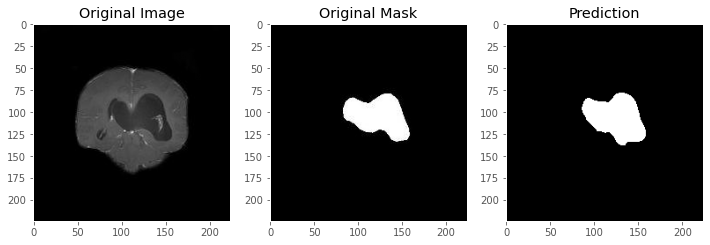

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2566.jpeg


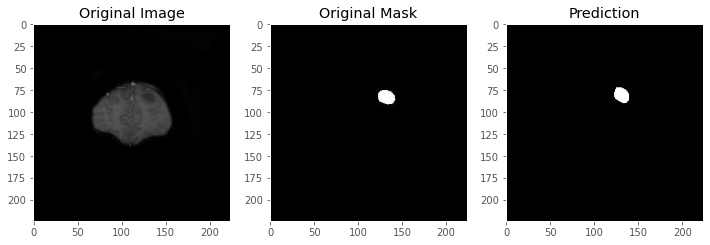

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2567.jpeg


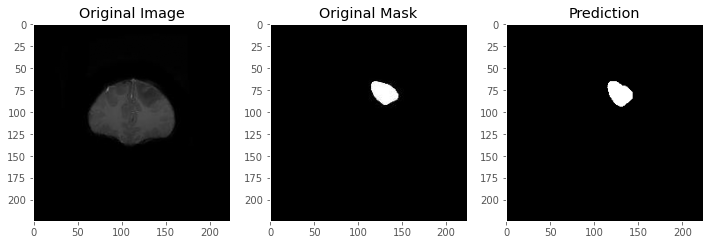

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2568.jpeg


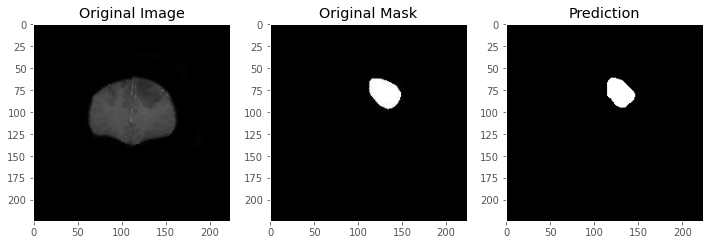

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2569.jpeg


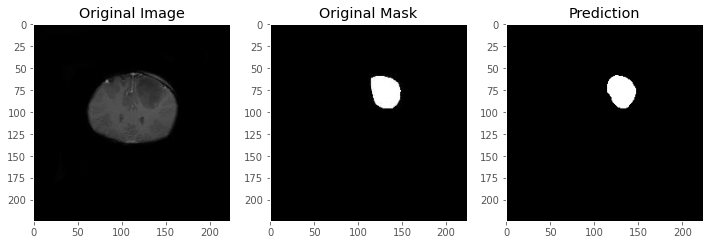

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2570.jpeg


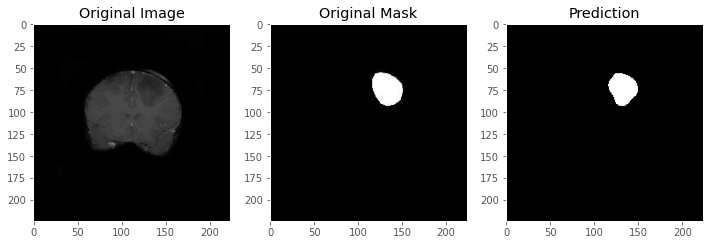

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2571.jpeg


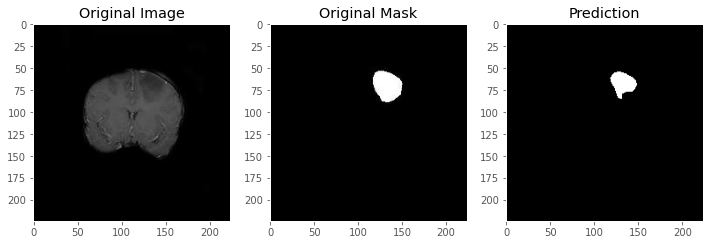

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2572.jpeg


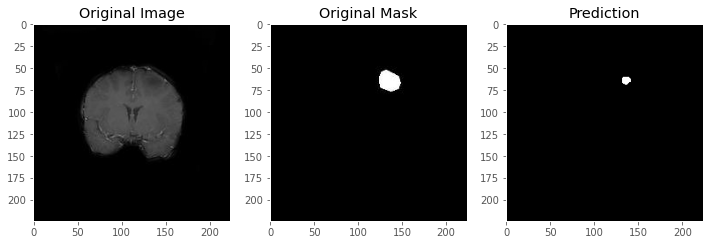

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2573.jpeg


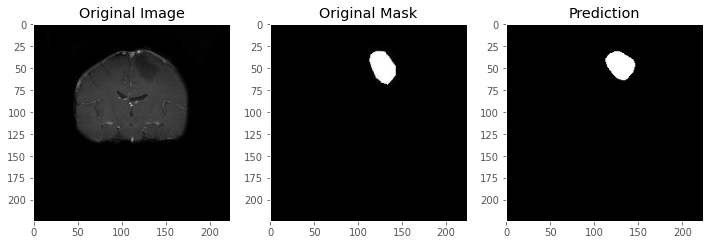

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2574.jpeg


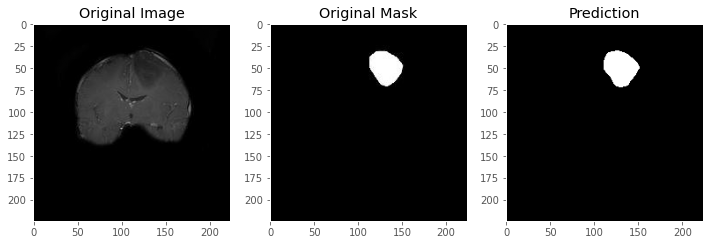

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2575.jpeg


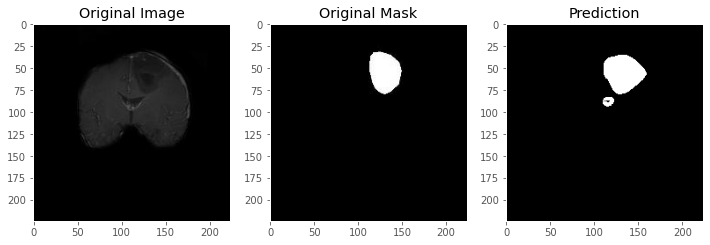

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2576.jpeg


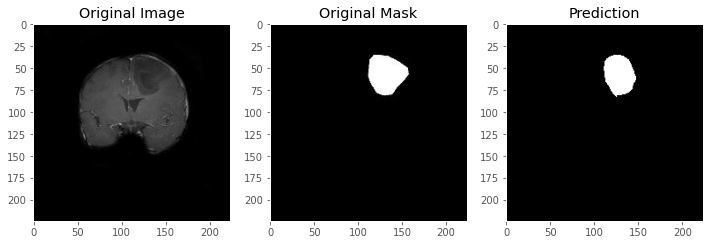

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2577.jpeg


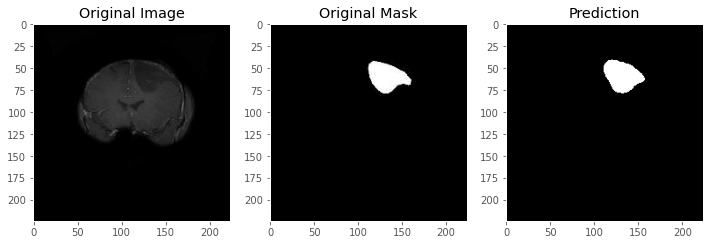

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2578.jpeg


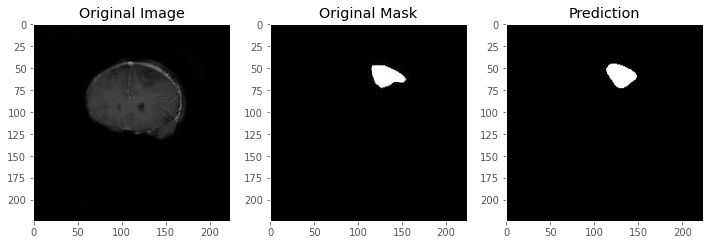

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2579.jpeg


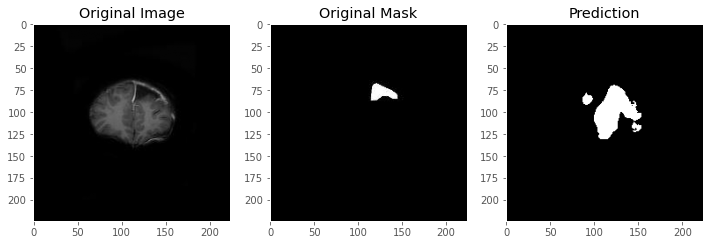

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2580.jpeg


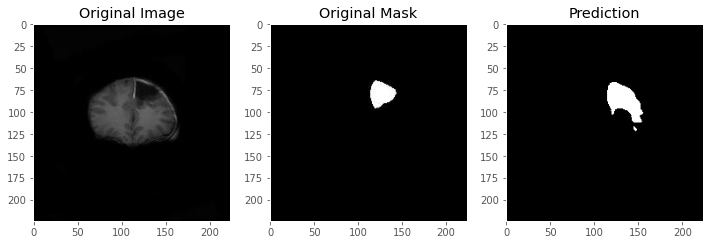

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2581.jpeg


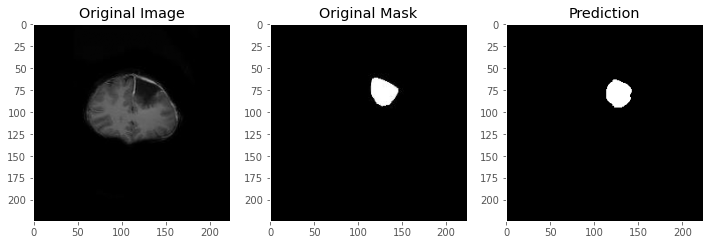

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2582.jpeg


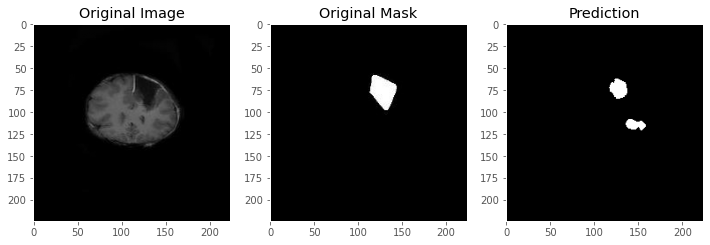

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2583.jpeg


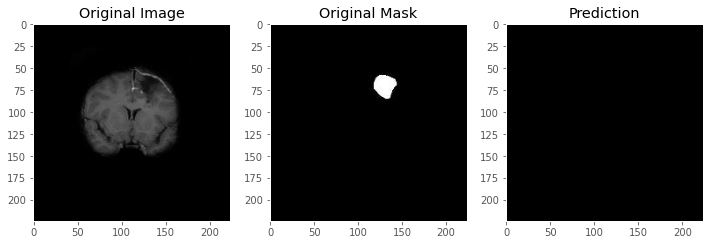

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2584.jpeg


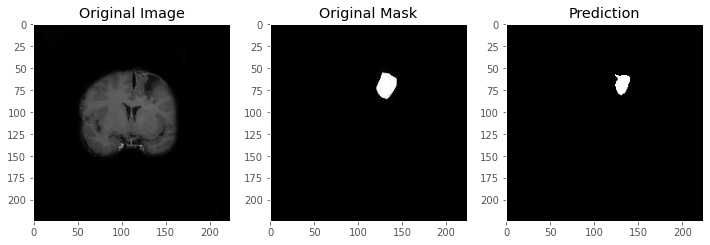

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2585.jpeg


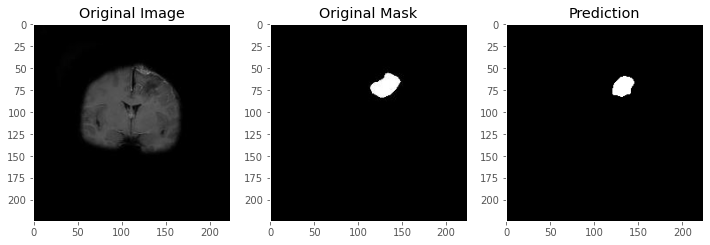

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2586.jpeg


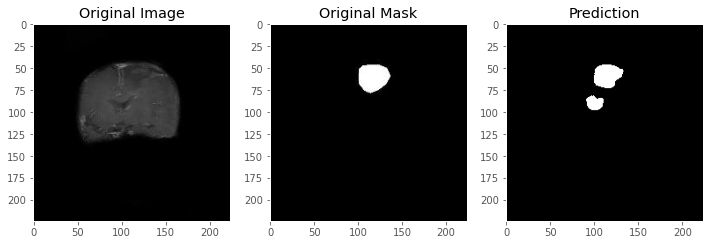

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2587.jpeg


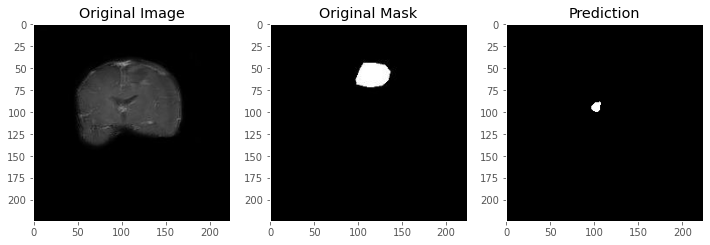

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2588.jpeg


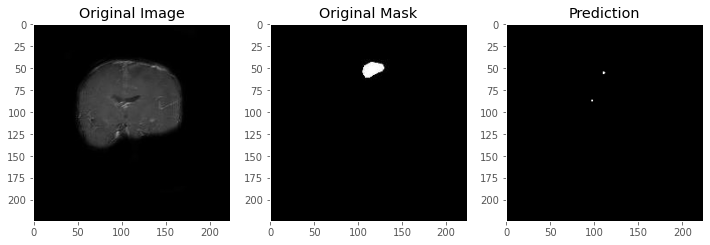

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2589.jpeg


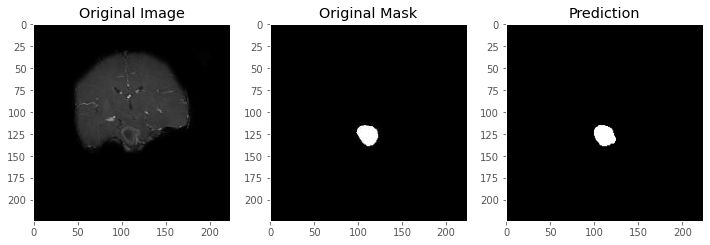

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2590.jpeg


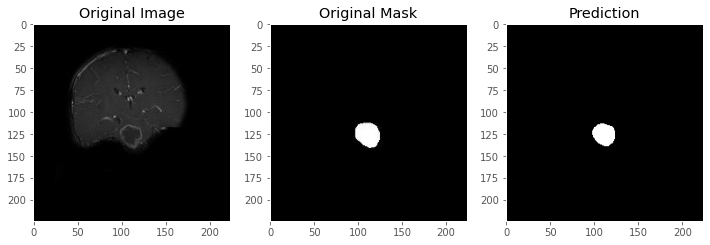

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2591.jpeg


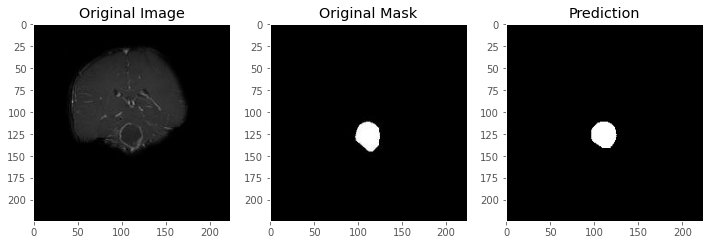

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2592.jpeg


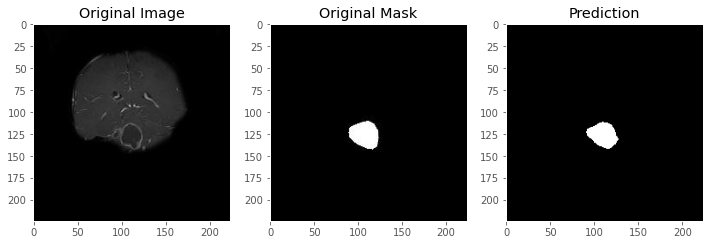

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2593.jpeg


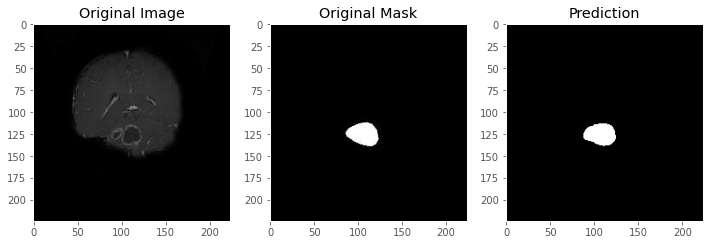

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2594.jpeg


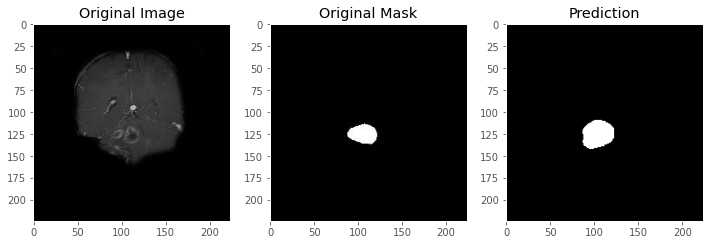

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2595.jpeg


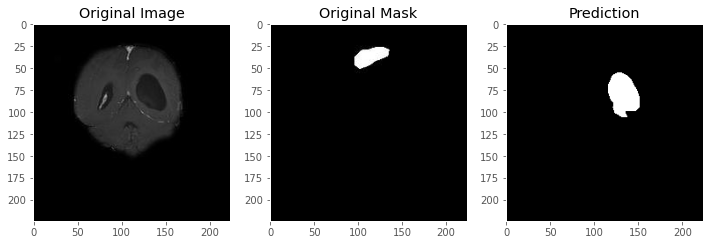

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2596.jpeg


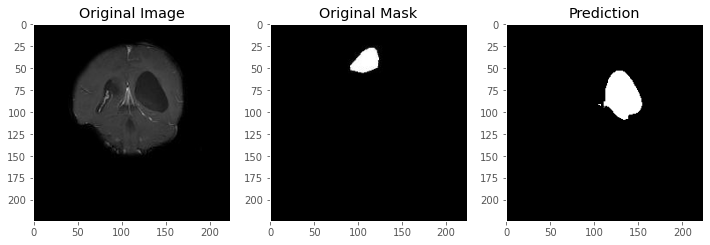

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2597.jpeg


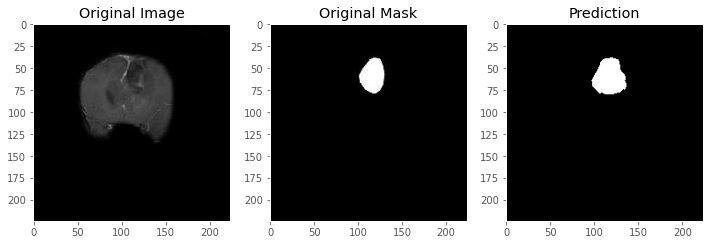

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2598.jpeg


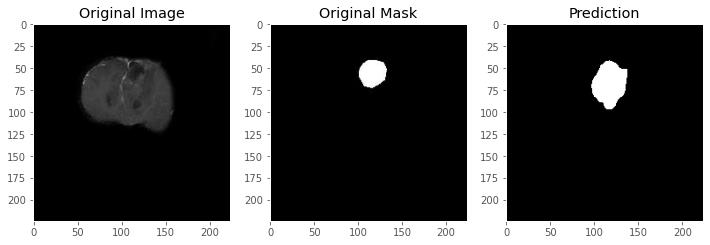

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2599.jpeg


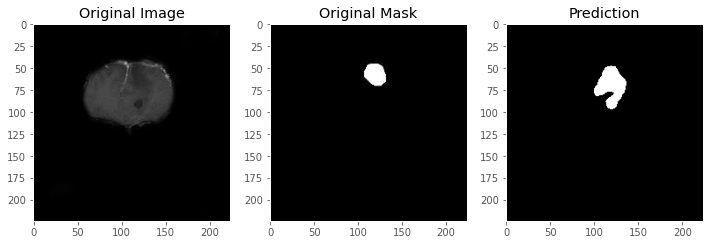

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2600.jpeg


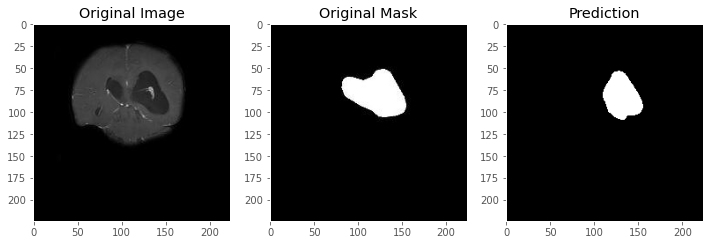

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2601.jpeg


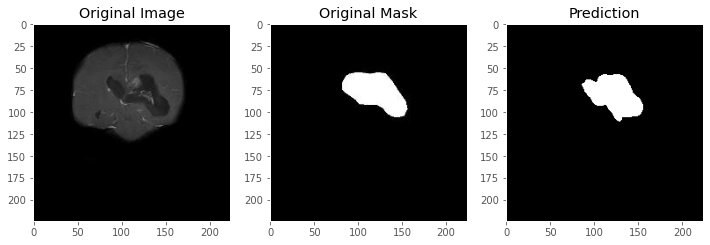

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2602.jpeg


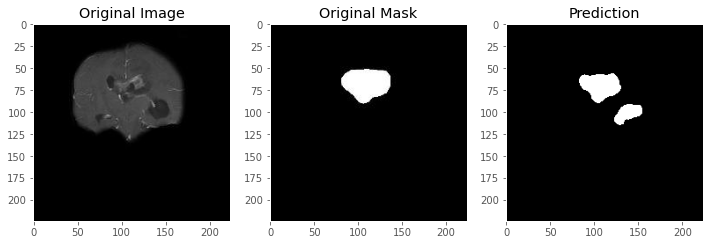

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2603.jpeg


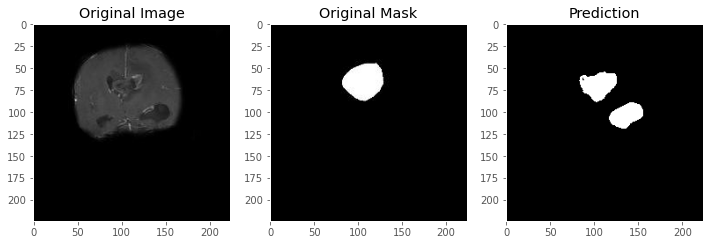

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2604.jpeg


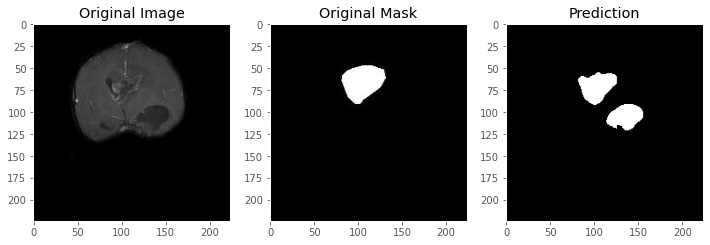

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2605.jpeg


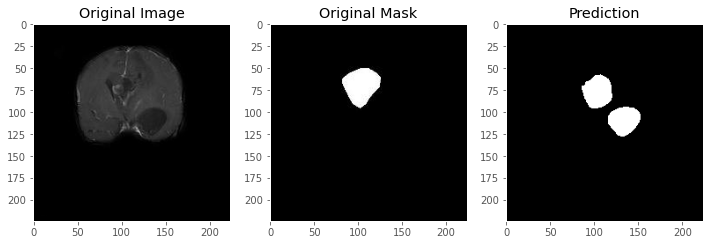

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2606.jpeg


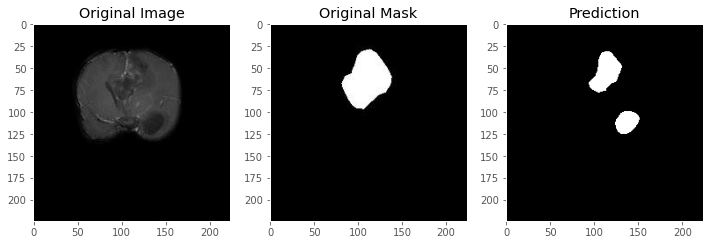

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2607.jpeg


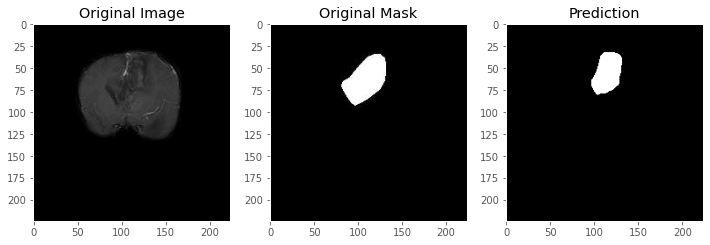

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2617.jpeg


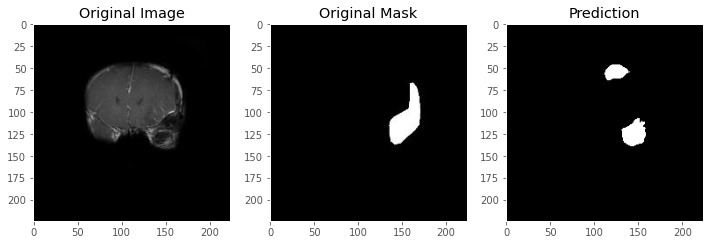

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2618.jpeg


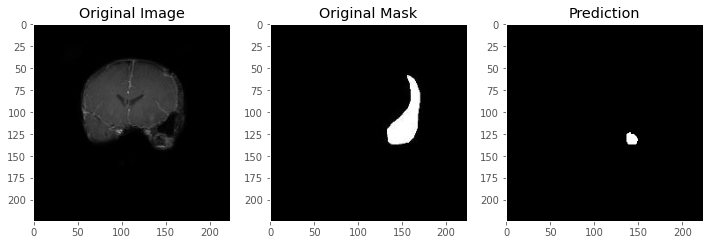

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2619.jpeg


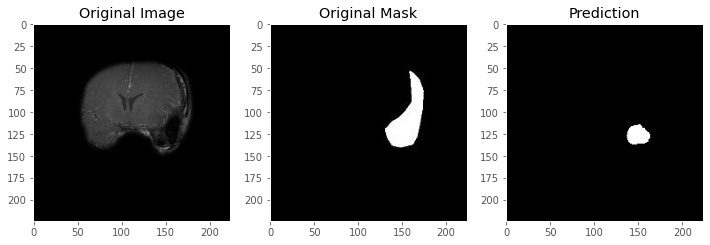

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2620.jpeg


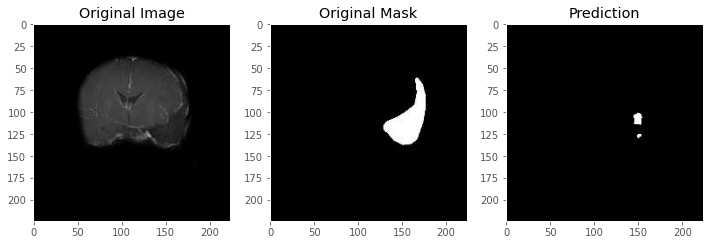

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2621.jpeg


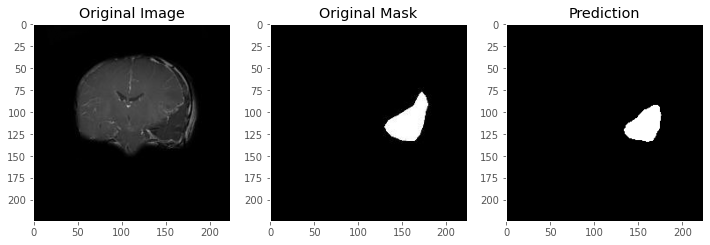

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2622.jpeg


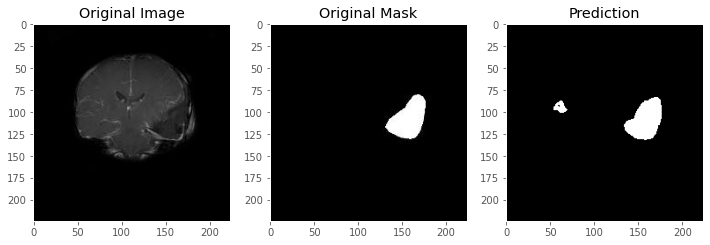

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2623.jpeg


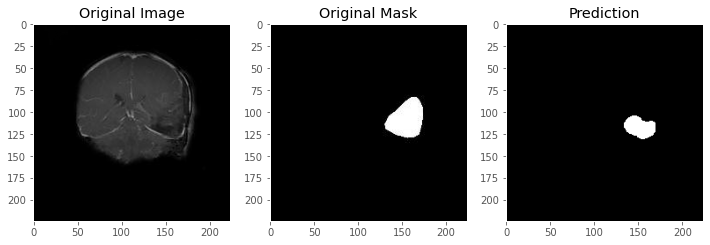

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2631.jpeg


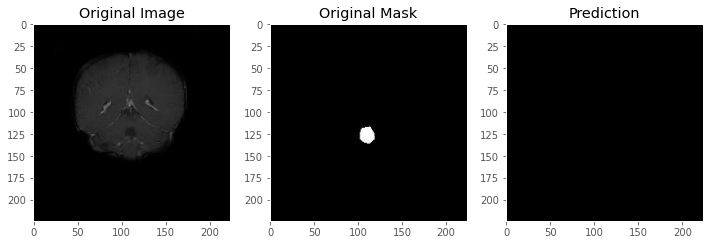

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2632.jpeg


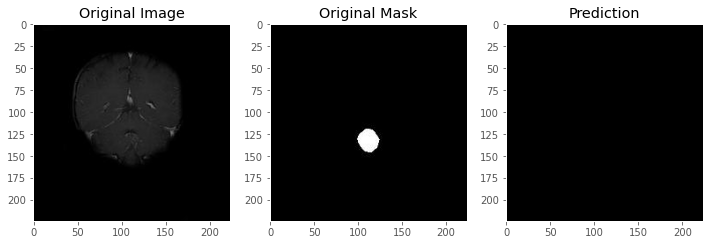

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2633.jpeg


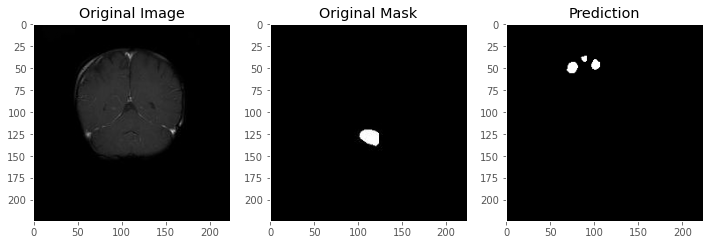

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2646.jpeg


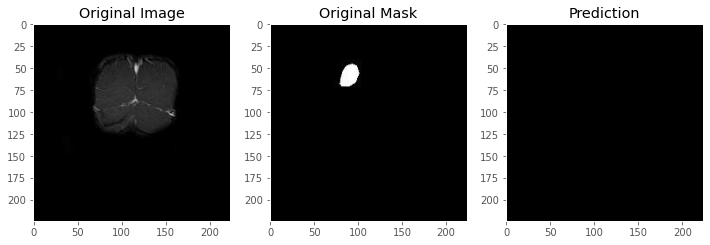

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2647.jpeg


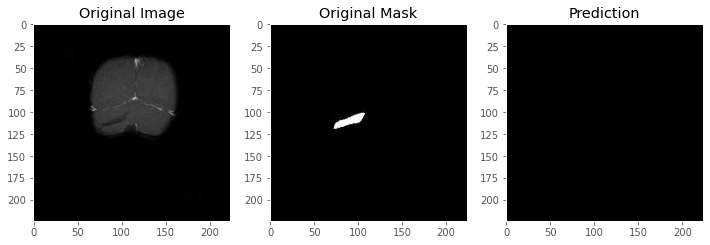

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2648.jpeg


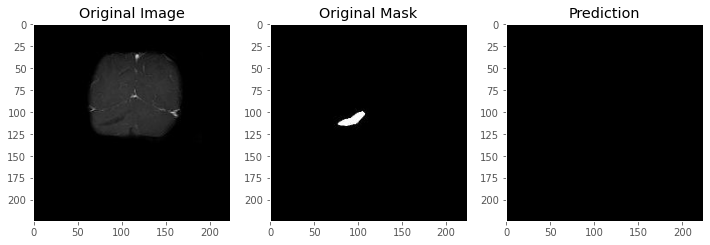

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2649.jpeg


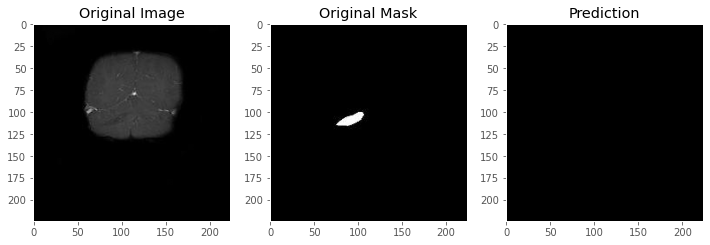

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2664.jpeg


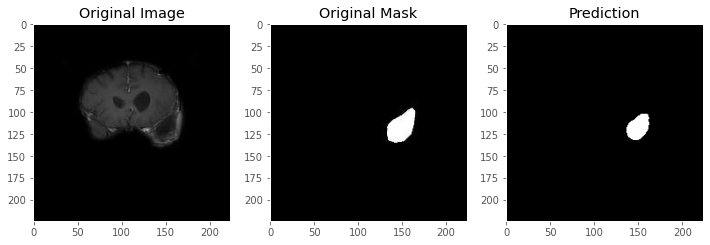

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2665.jpeg


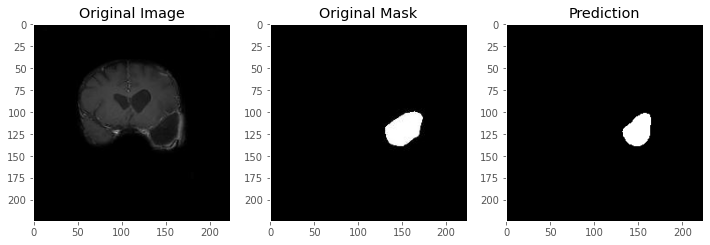

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2666.jpeg


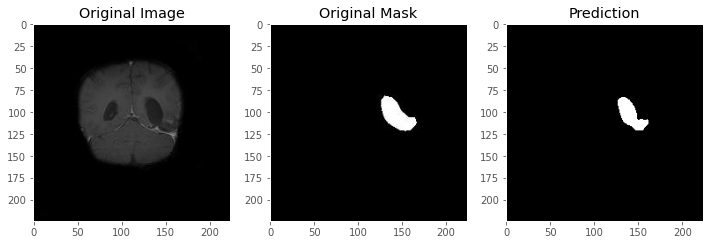

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2667.jpeg


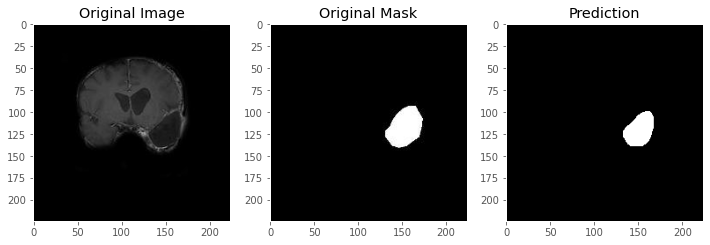

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2668.jpeg


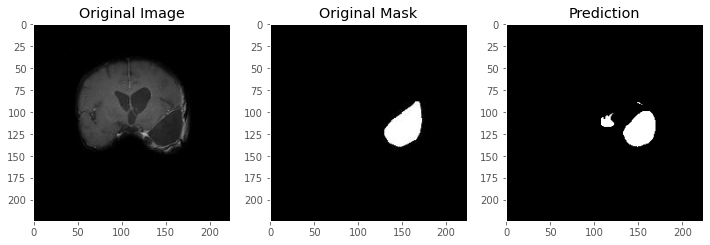

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2669.jpeg


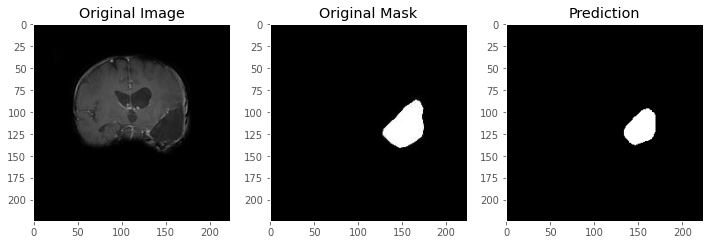

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2670.jpeg


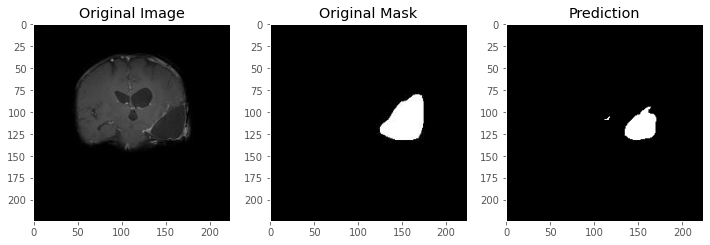

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2671.jpeg


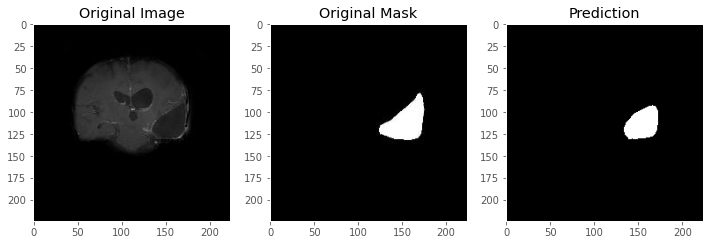

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2672.jpeg


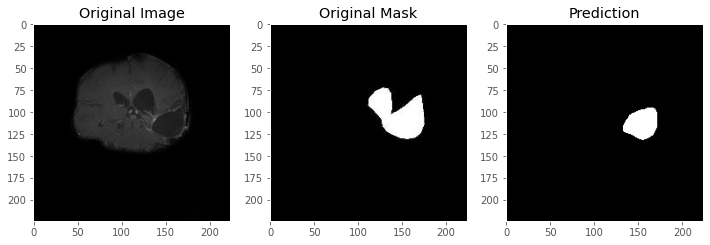

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2673.jpeg


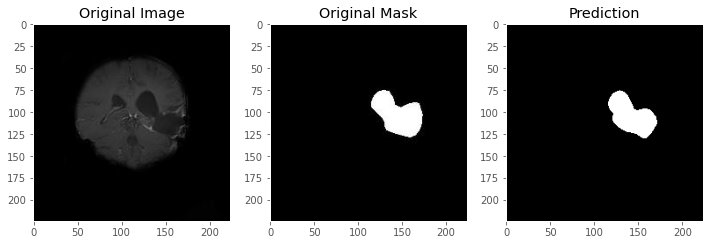

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2674.jpeg


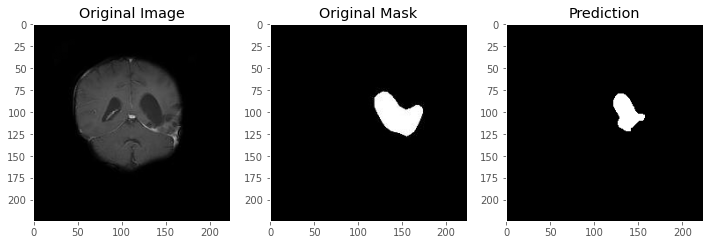

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2738.jpeg


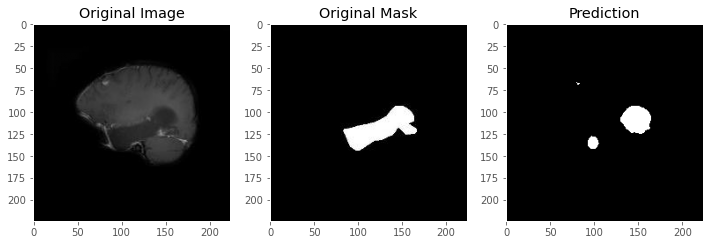

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2739.jpeg


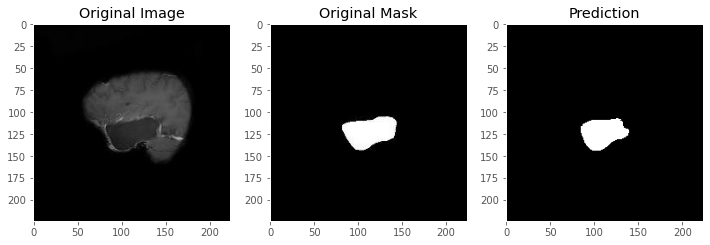

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2740.jpeg


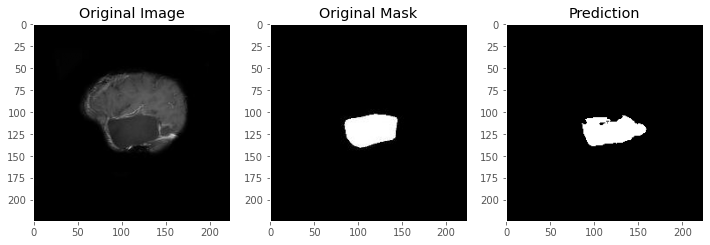

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2741.jpeg


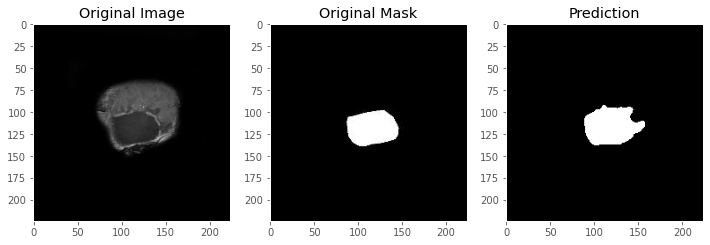

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2742.jpeg


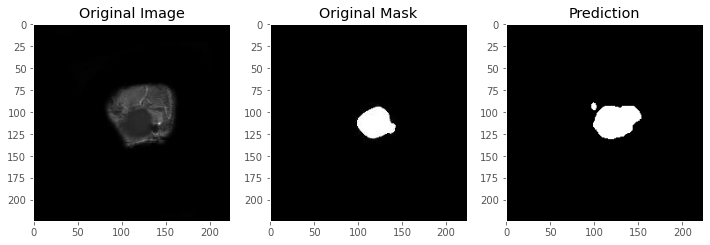

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2918.jpeg


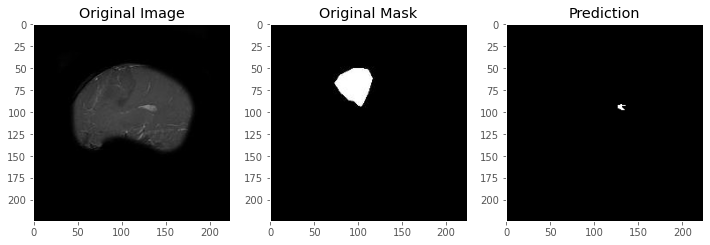

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2919.jpeg


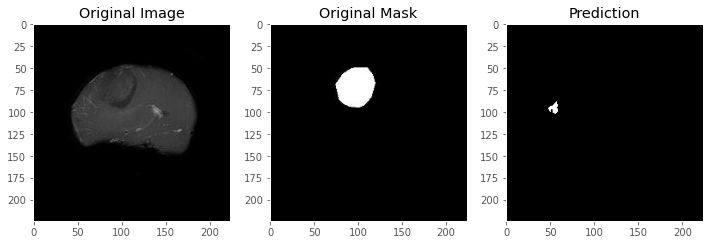

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2920.jpeg


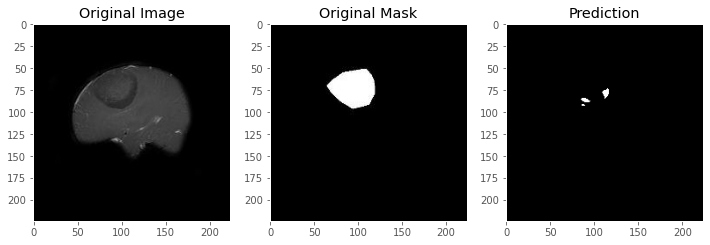

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2921.jpeg


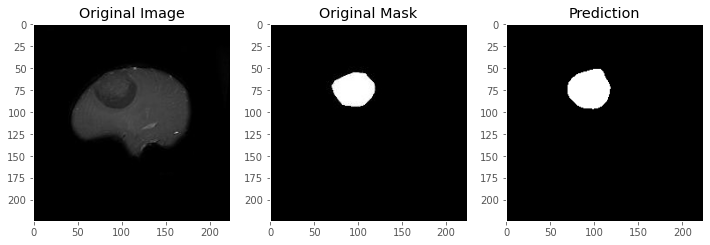

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2922.jpeg


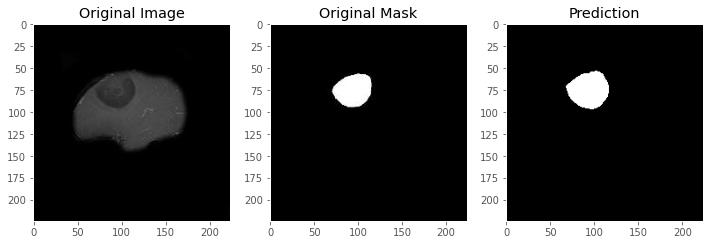

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2923.jpeg


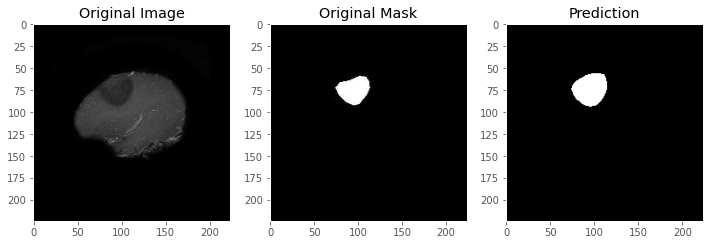

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2924.jpeg


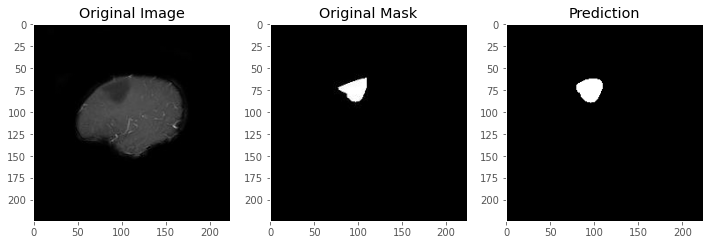

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2925.jpeg


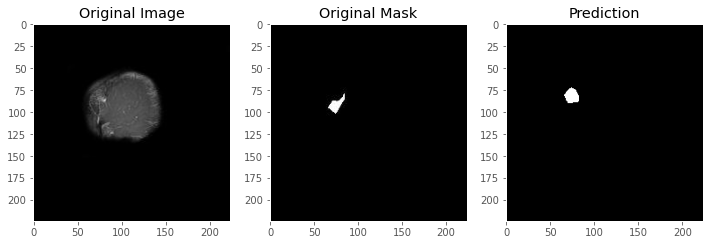

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2926.jpeg


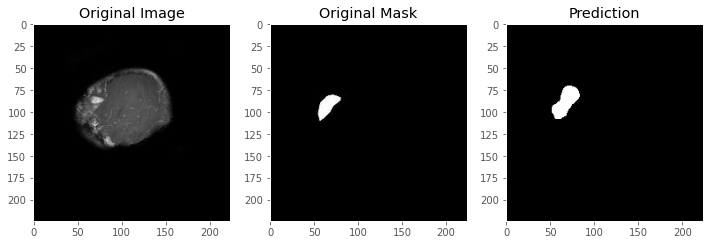

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2927.jpeg


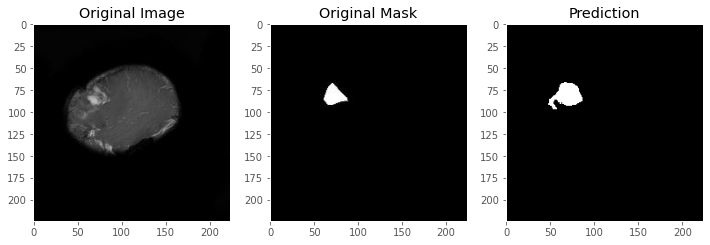

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2928.jpeg


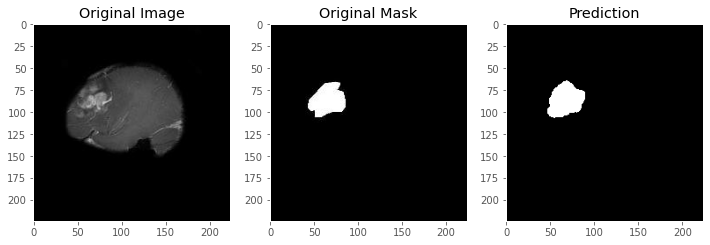

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2929.jpeg


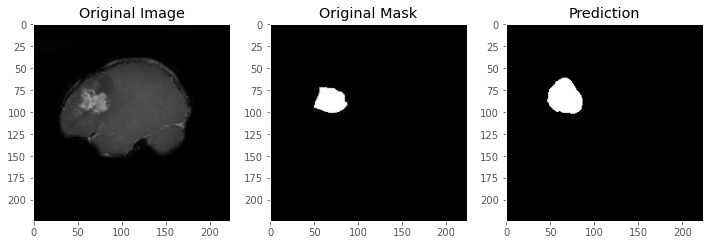

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2930.jpeg


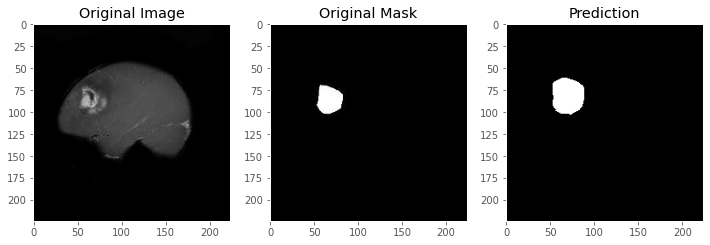

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2931.jpeg


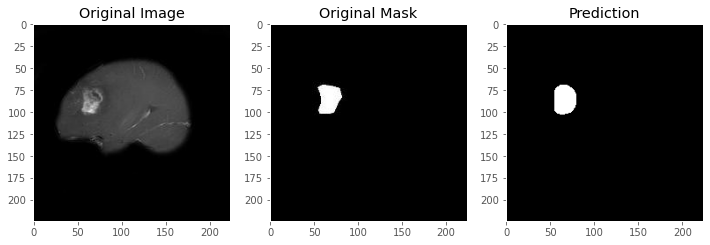

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2932.jpeg


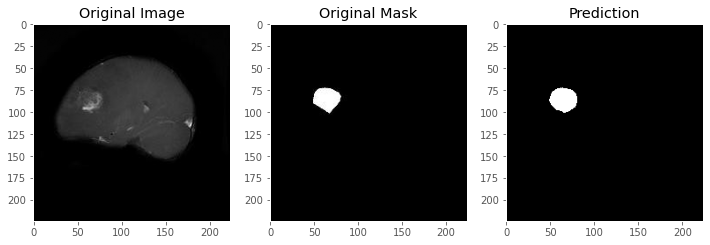

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2933.jpeg


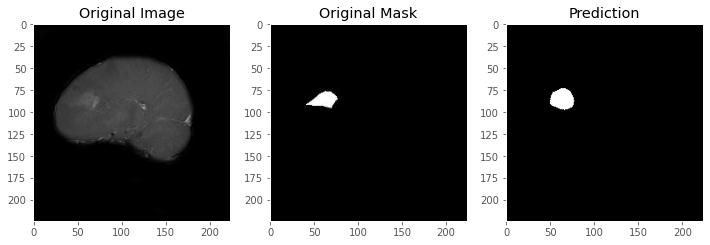

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2934.jpeg


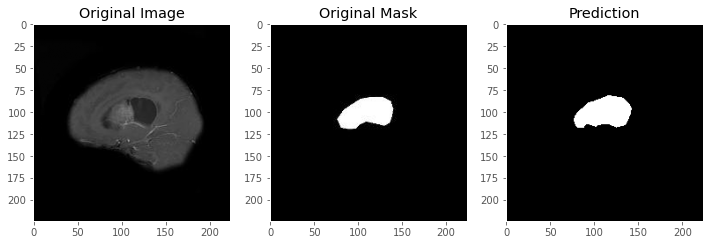

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2935.jpeg


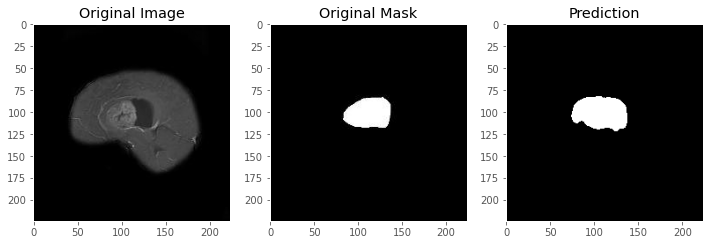

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2936.jpeg


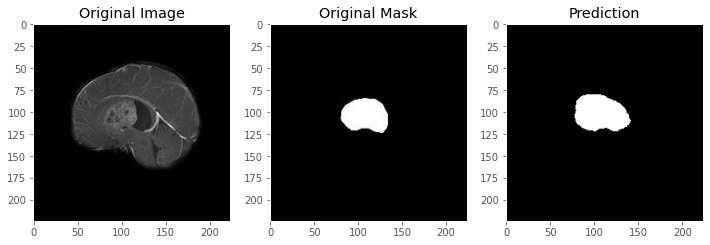

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2937.jpeg


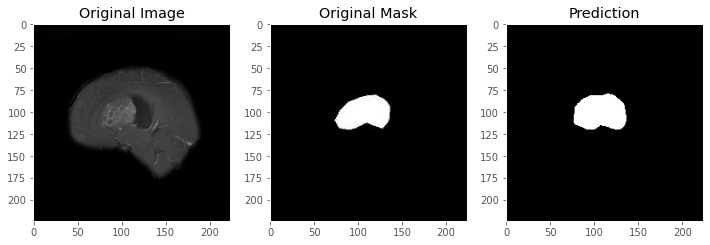

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2938.jpeg


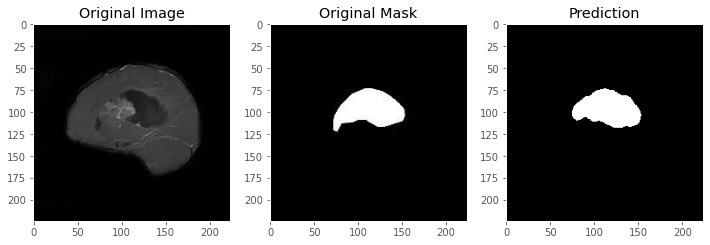

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2939.jpeg


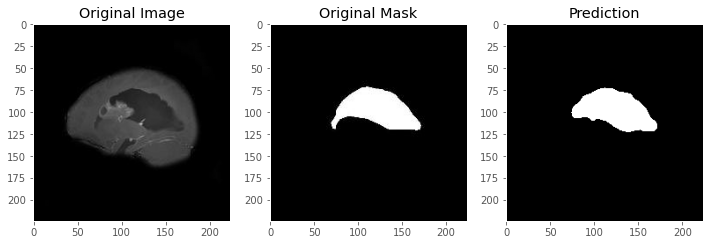

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2940.jpeg


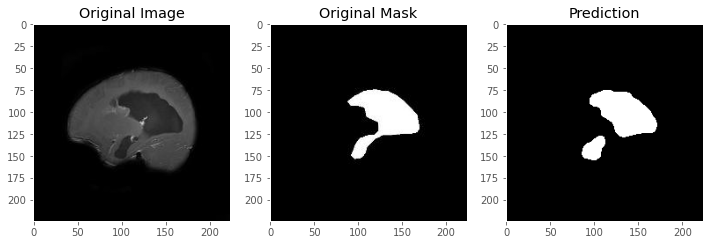

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2941.jpeg


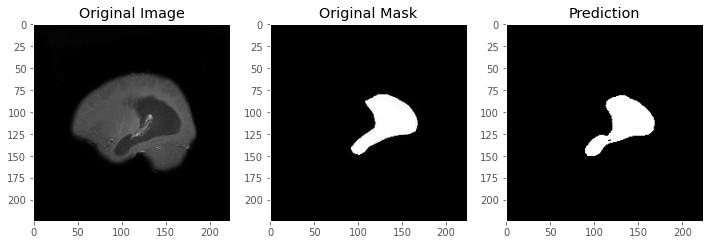

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2942.jpeg


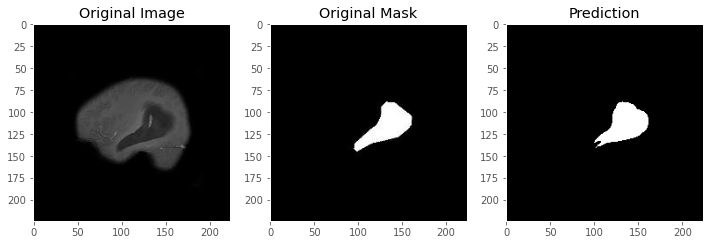

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2943.jpeg


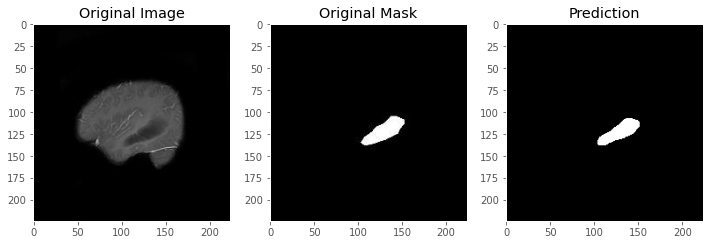

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2944.jpeg


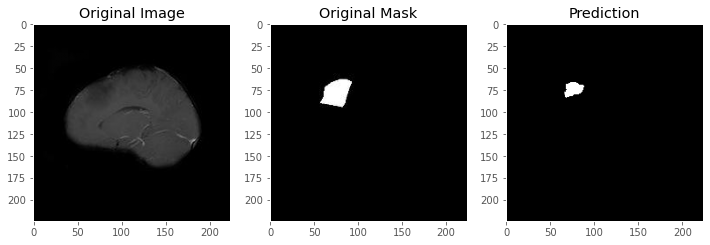

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2945.jpeg


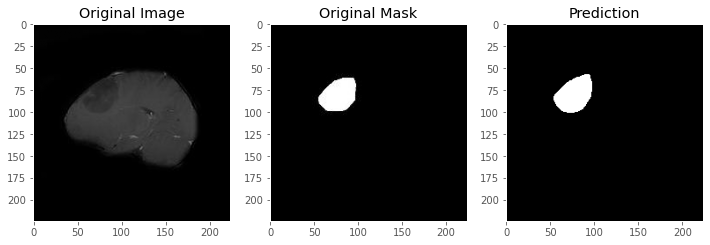

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2946.jpeg


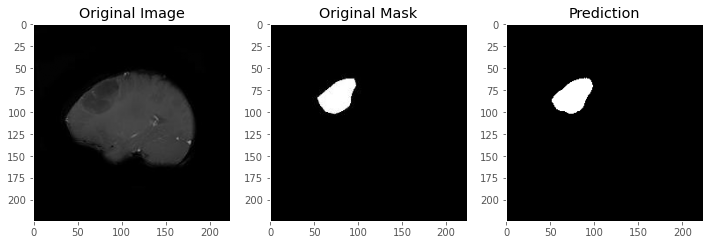

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2947.jpeg


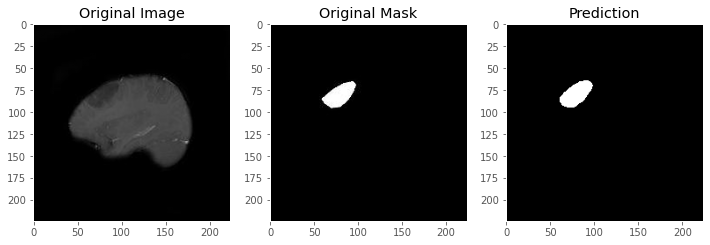

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2948.jpeg


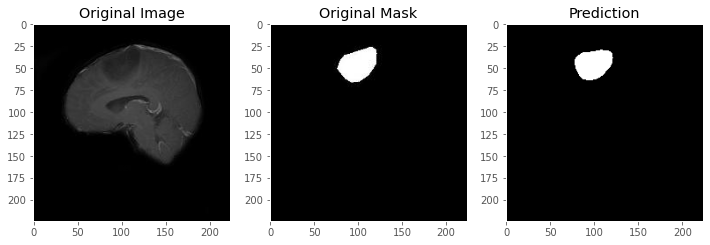

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2949.jpeg


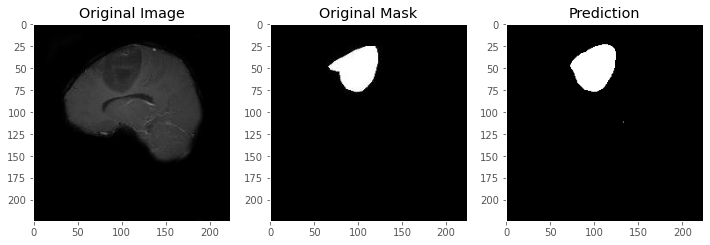

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2950.jpeg


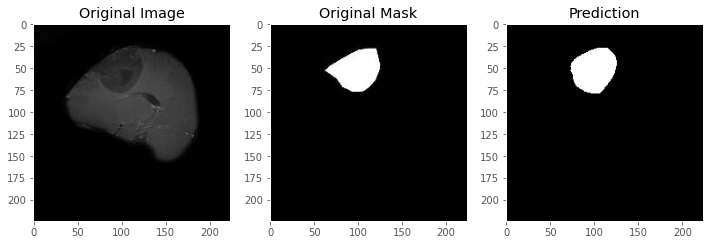

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2951.jpeg


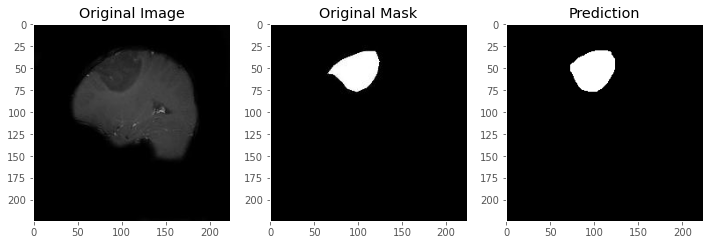

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2952.jpeg


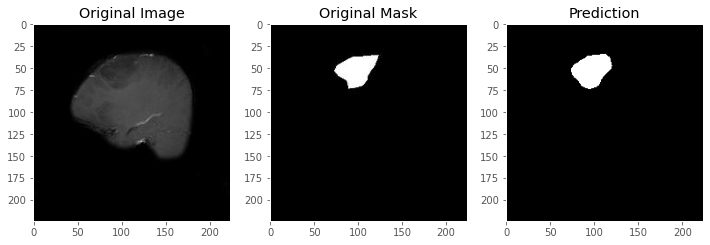

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2953.jpeg


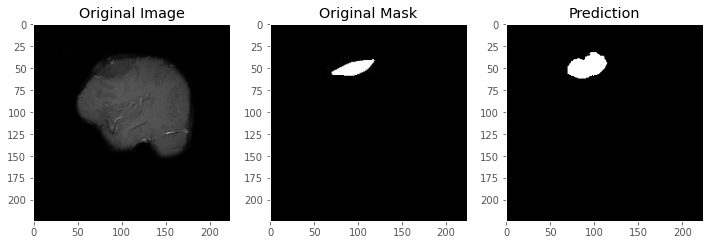

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2954.jpeg


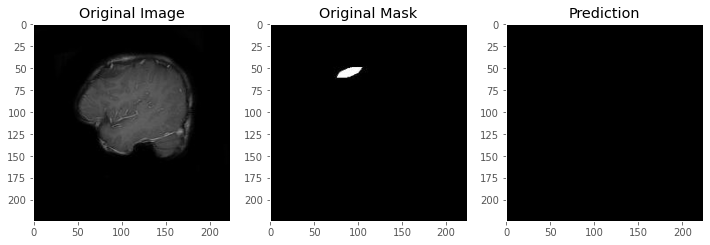

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2955.jpeg


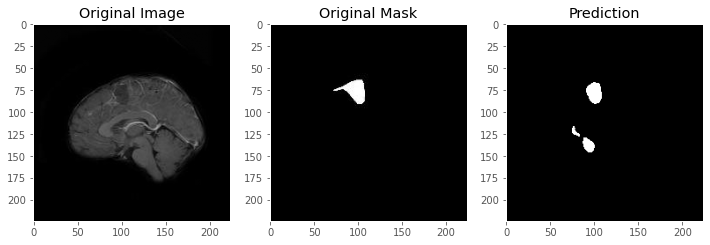

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2956.jpeg


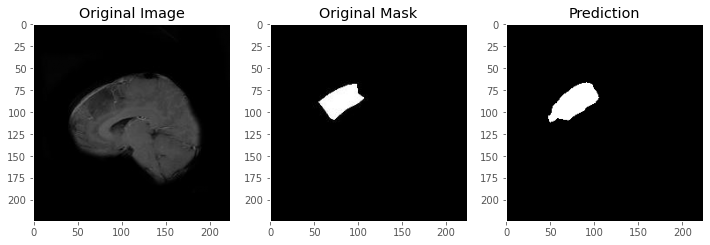

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2957.jpeg


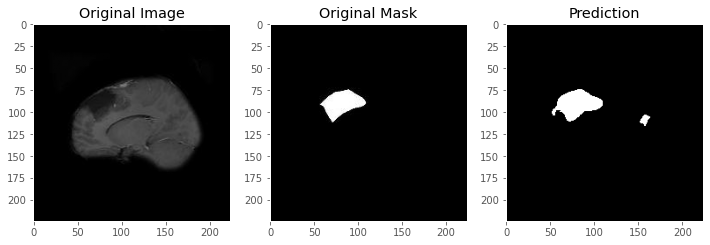

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2958.jpeg


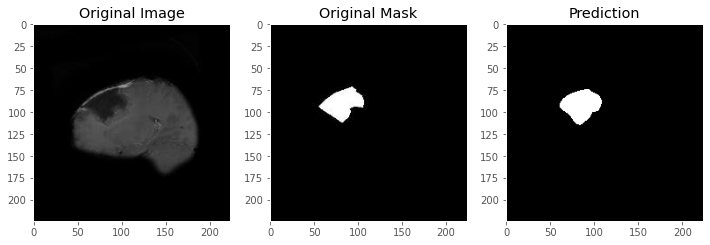

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2959.jpeg


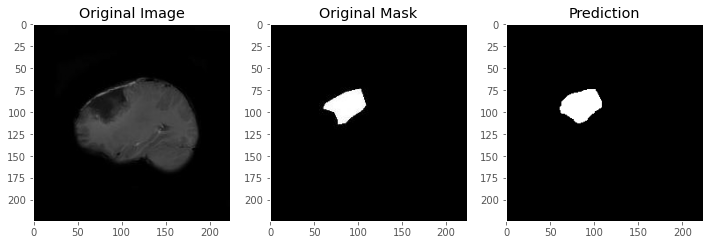

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2960.jpeg


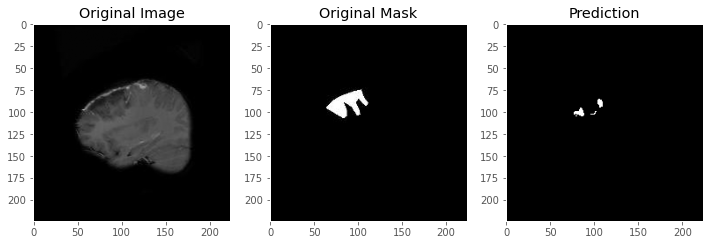

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2961.jpeg


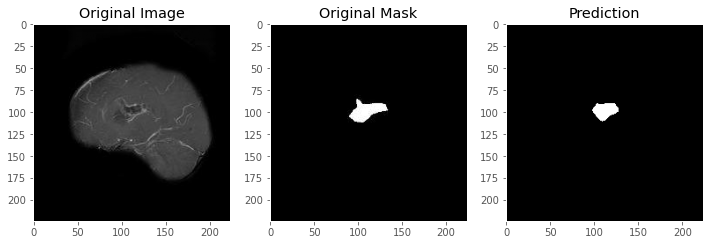

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2962.jpeg


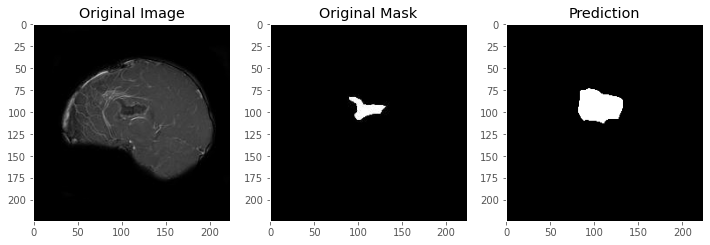

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2963.jpeg


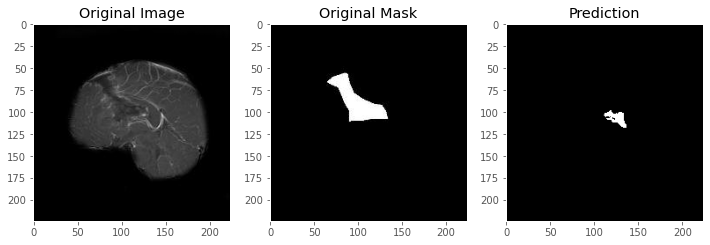

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2964.jpeg


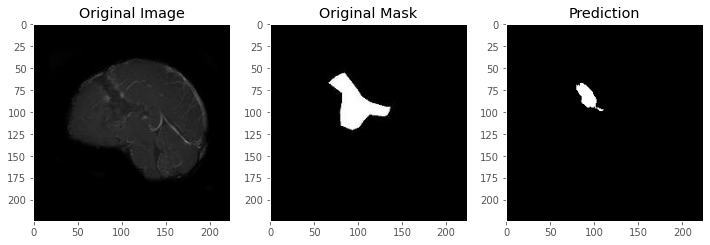

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2965.jpeg


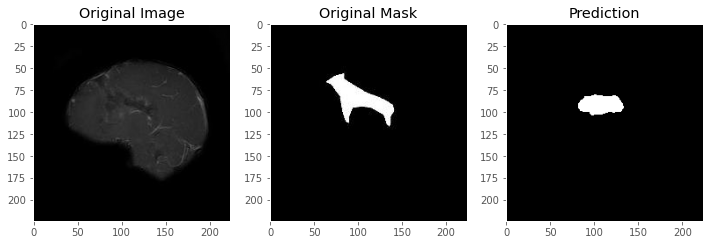

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2966.jpeg


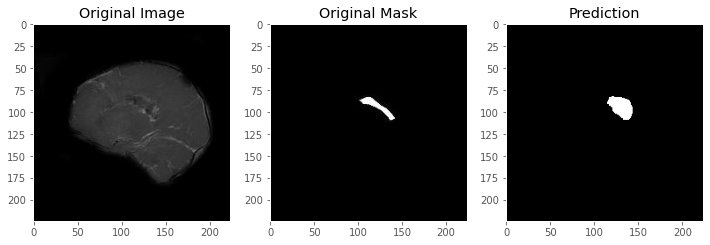

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2967.jpeg


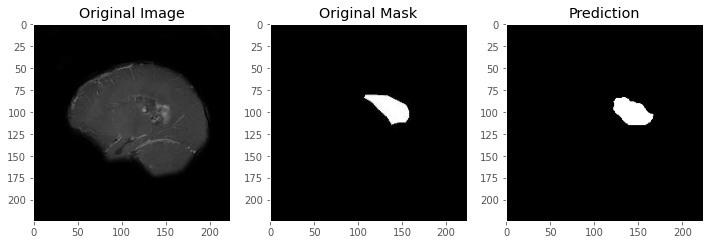

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2968.jpeg


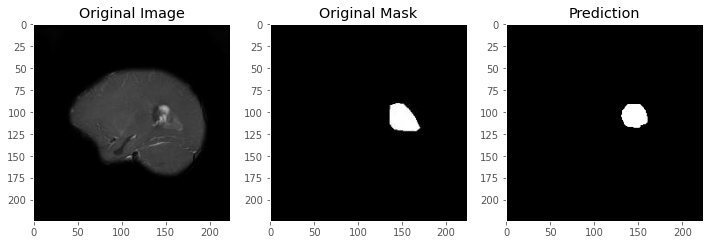

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2969.jpeg


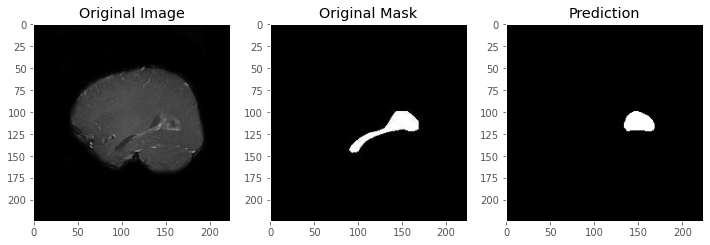

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2970.jpeg


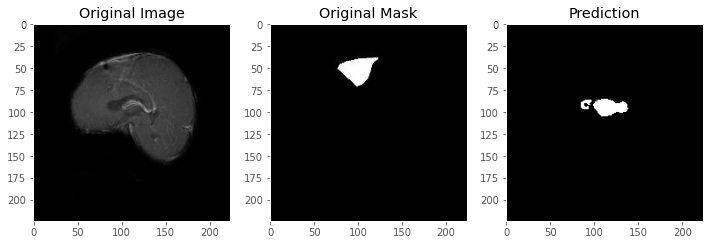

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2971.jpeg


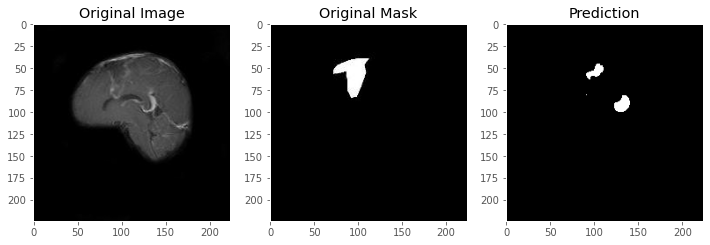

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2972.jpeg


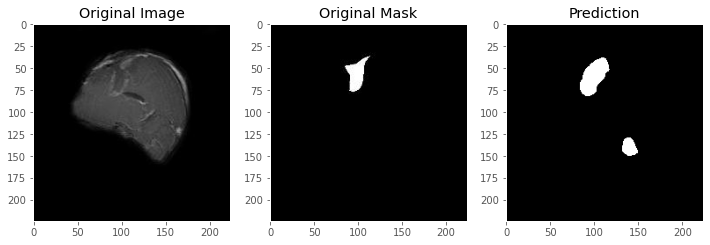

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2973.jpeg


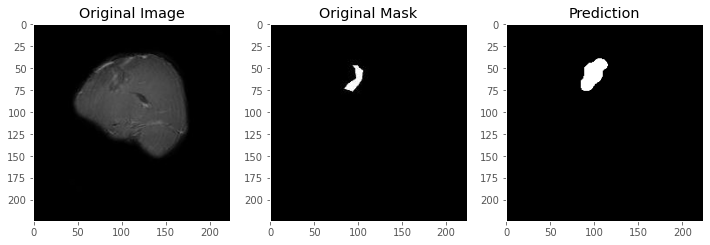

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2974.jpeg


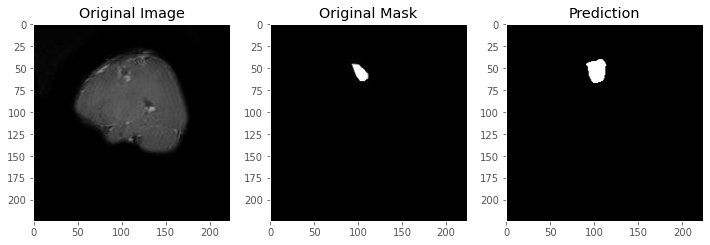

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2975.jpeg


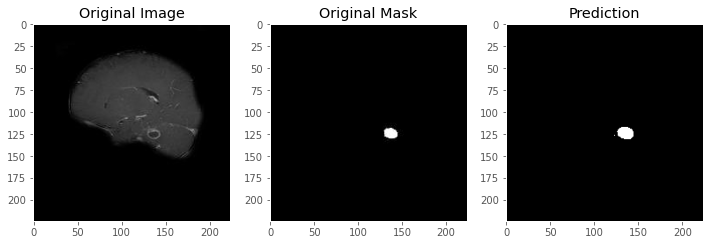

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2976.jpeg


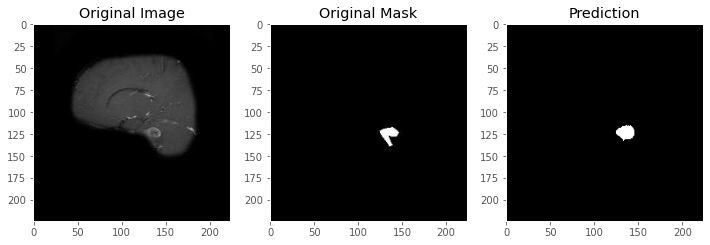

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2977.jpeg


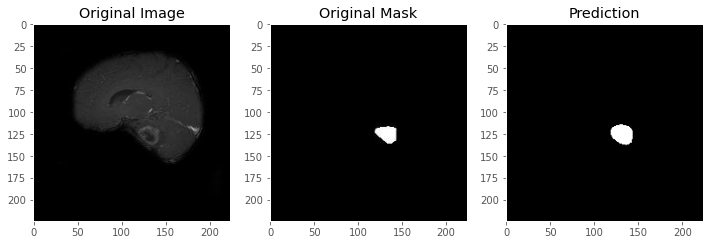

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2978.jpeg


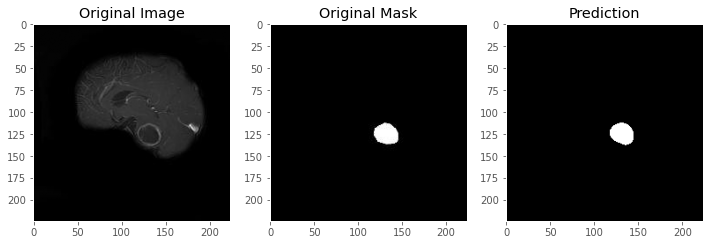

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2979.jpeg


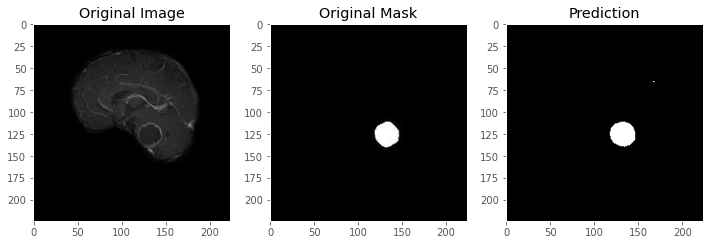

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2980.jpeg


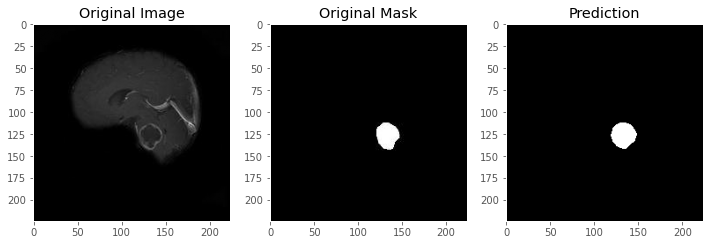

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2981.jpeg


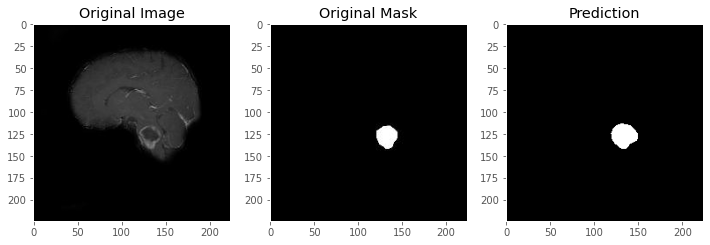

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2982.jpeg


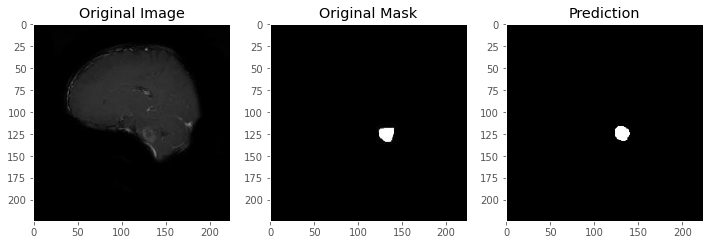

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2983.jpeg


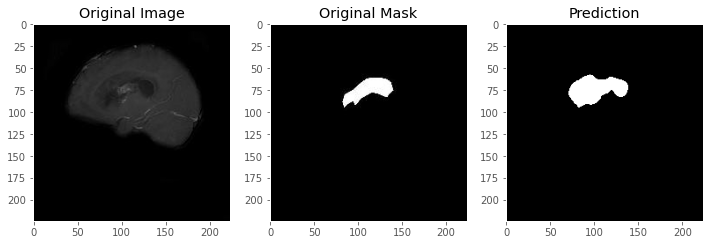

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2984.jpeg


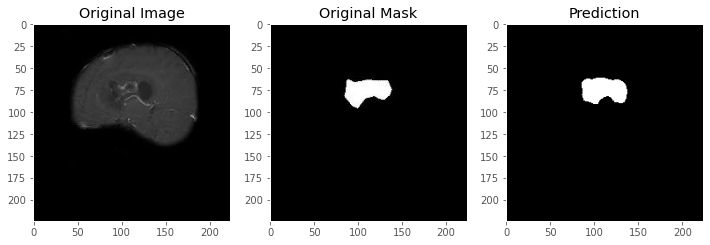

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2985.jpeg


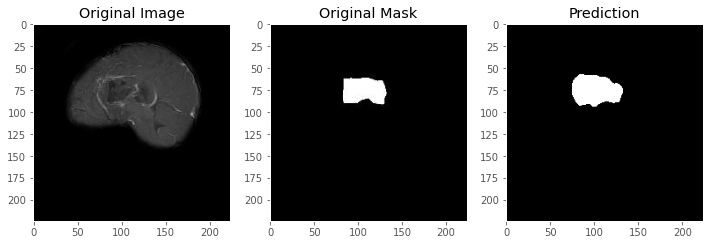

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2986.jpeg


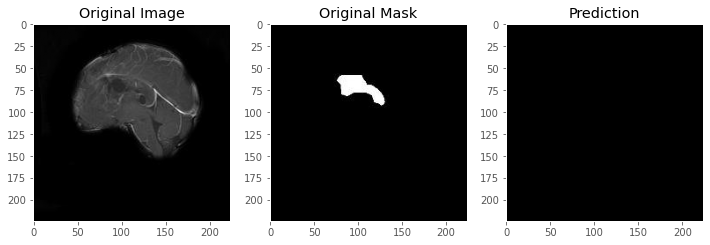

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2987.jpeg


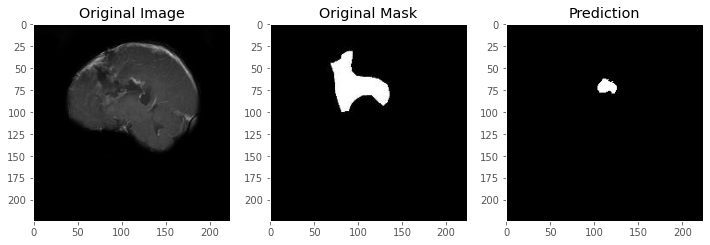

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2988.jpeg


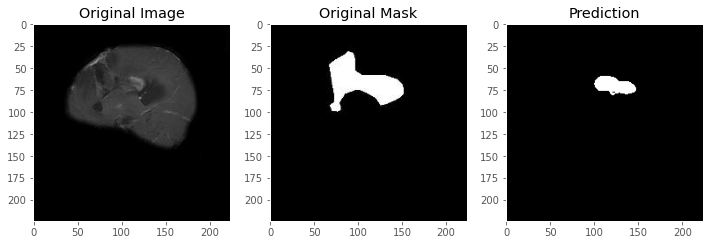

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2989.jpeg


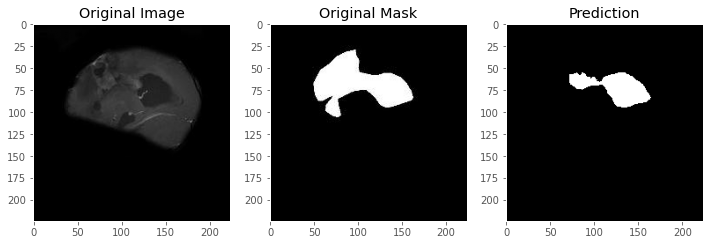

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2990.jpeg


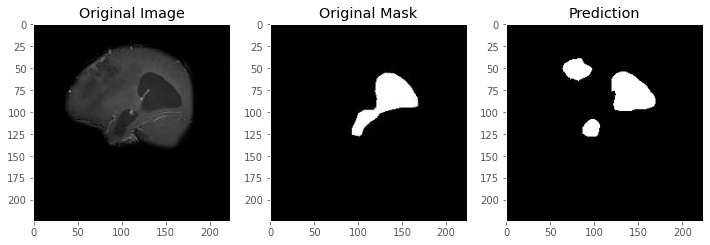

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2991.jpeg


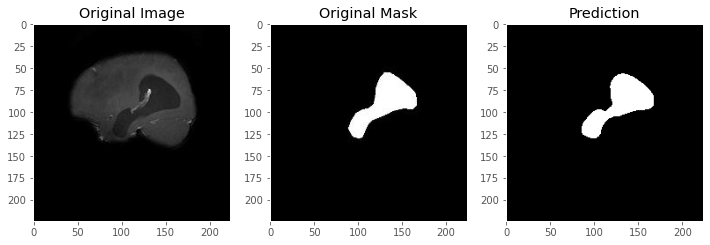

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2992.jpeg


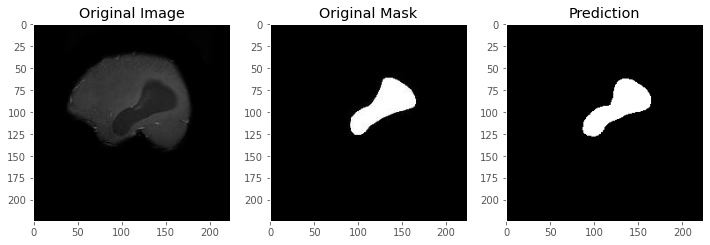

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2996.jpeg


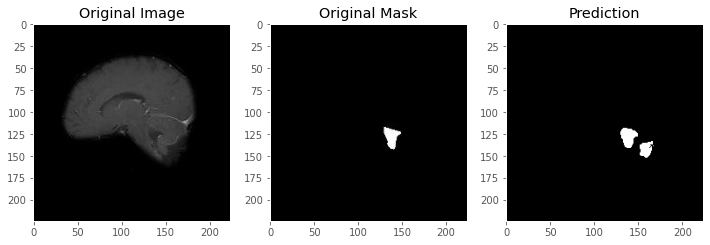

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2997.jpeg


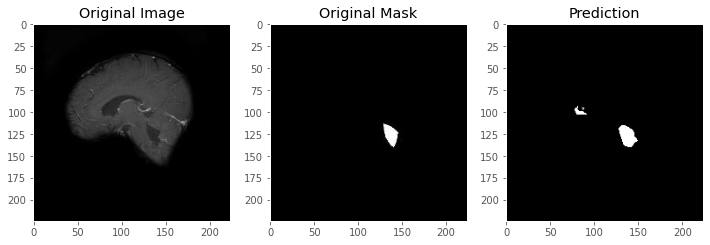

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2998.jpeg


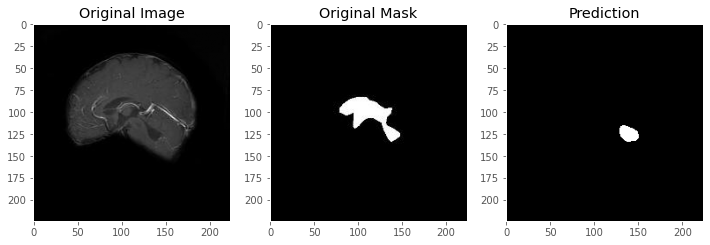

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_2999.jpeg


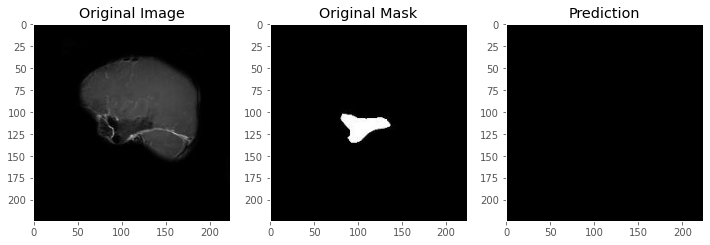

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3000.jpeg


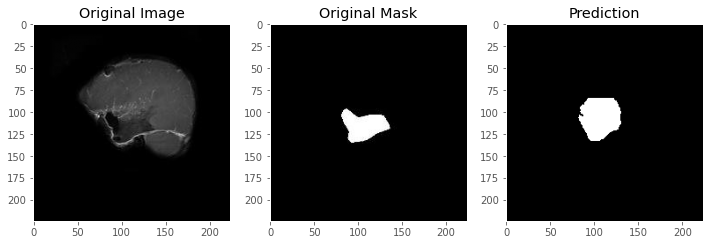

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3001.jpeg


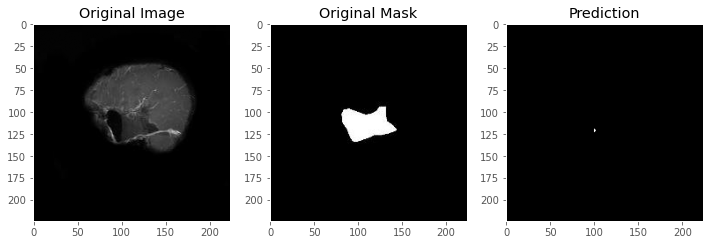

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3002.jpeg


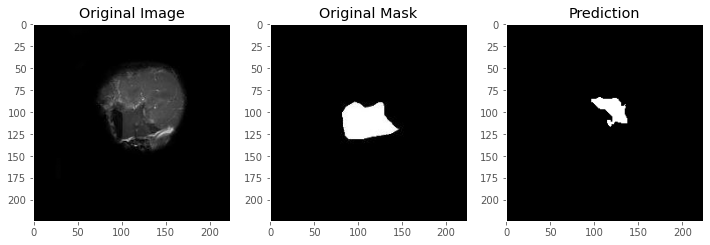

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3003.jpeg


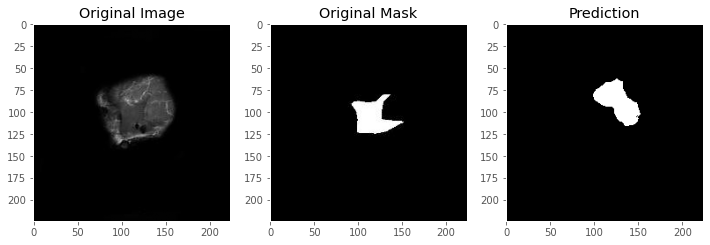

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3004.jpeg


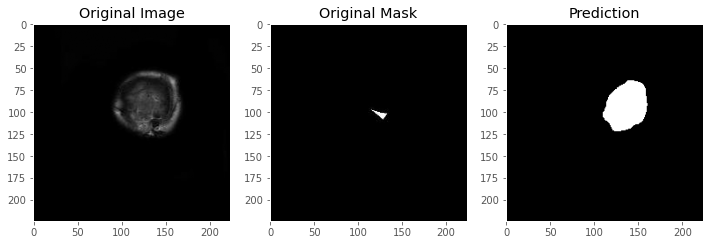

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3009.jpeg


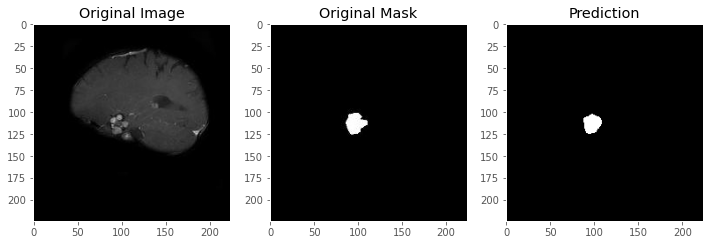

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3010.jpeg


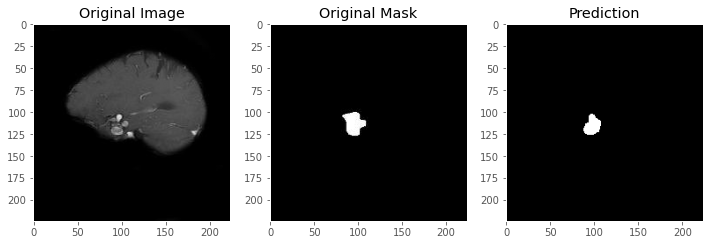

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3011.jpeg


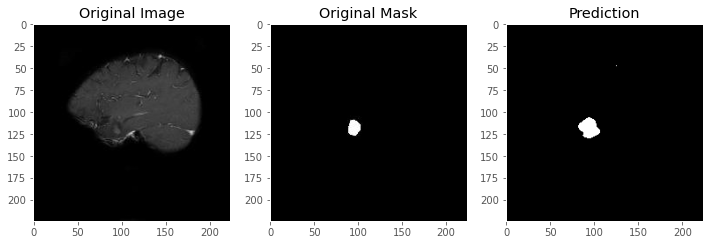

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3012.jpeg


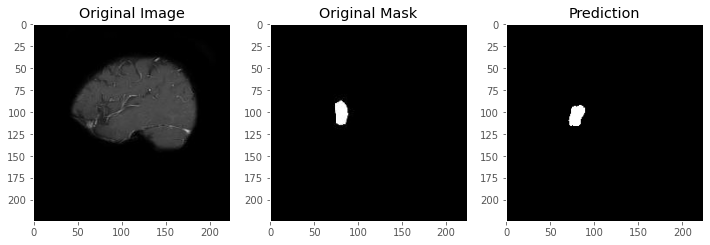

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3013.jpeg


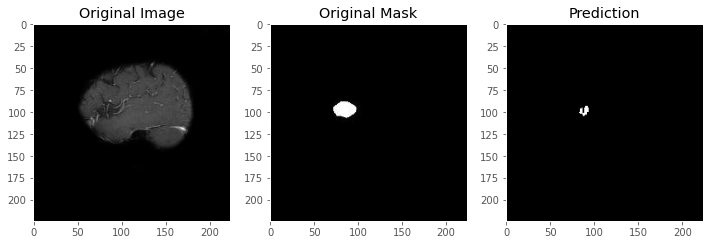

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3020.jpeg


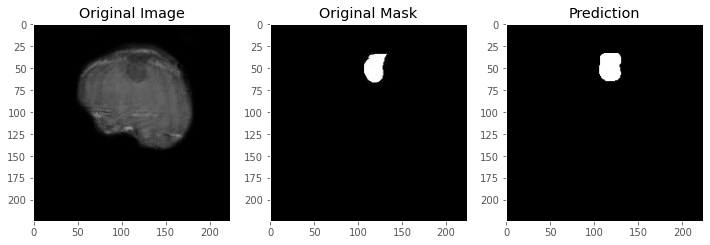

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_3021.jpeg


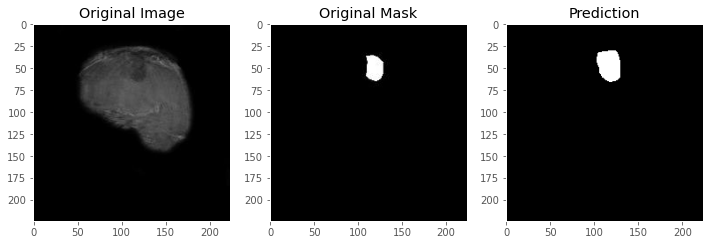

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_362.jpeg


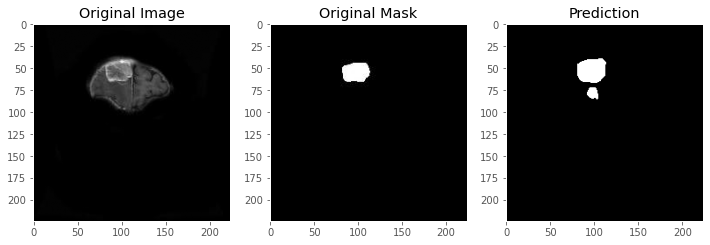

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_363.jpeg


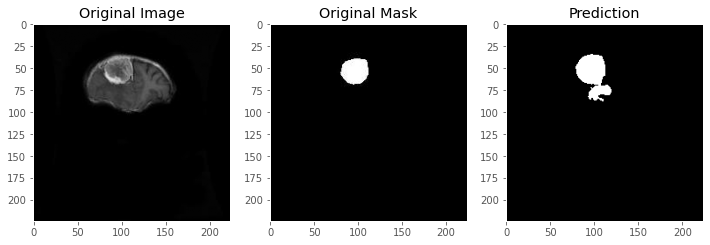

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_364.jpeg


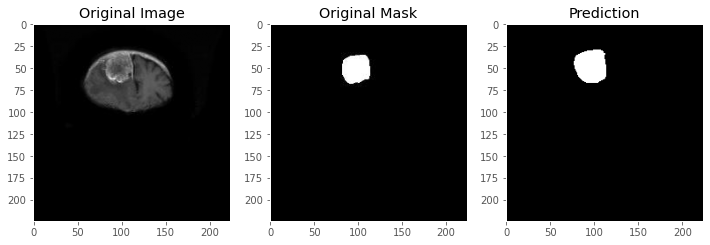

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_365.jpeg


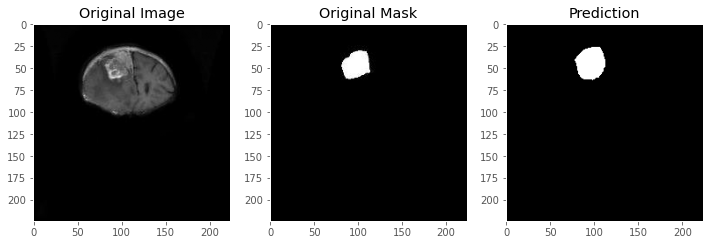

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_366.jpeg


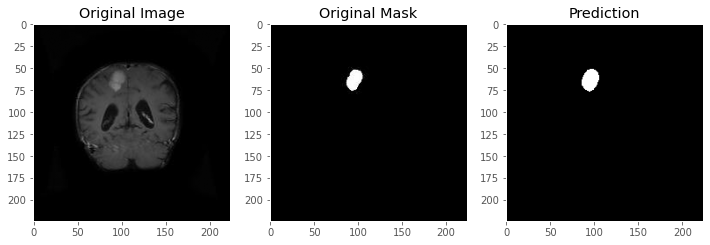

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_367.jpeg


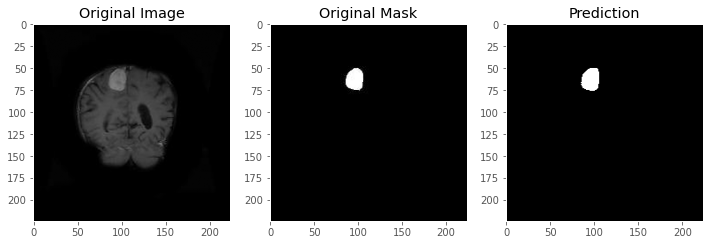

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_368.jpeg


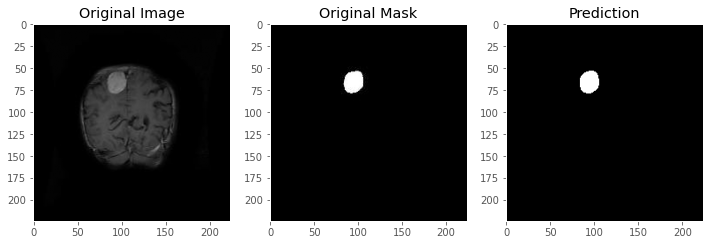

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_369.jpeg


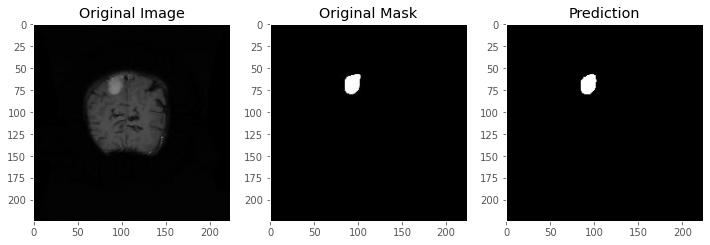

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_370.jpeg


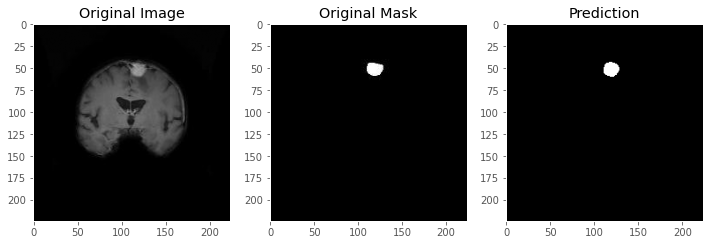

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_371.jpeg


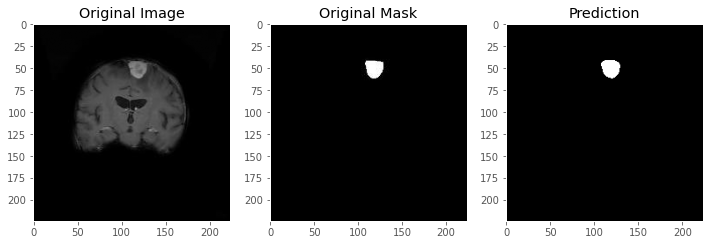

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_372.jpeg


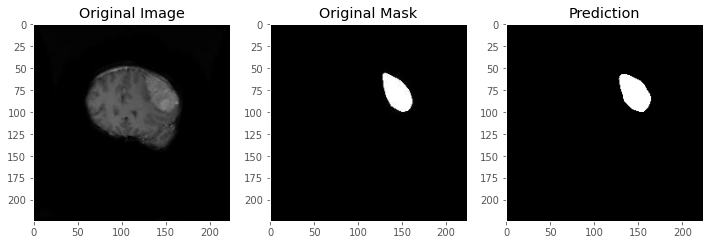

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_373.jpeg


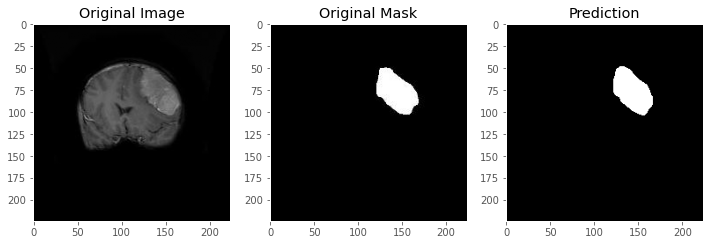

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_374.jpeg


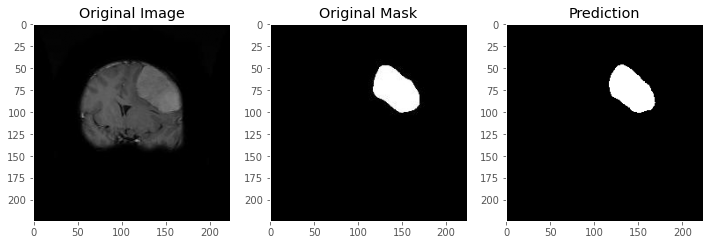

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_375.jpeg


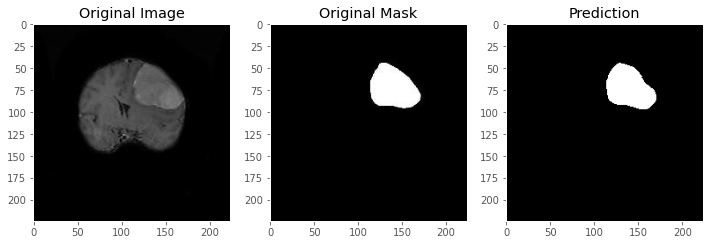

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_376.jpeg


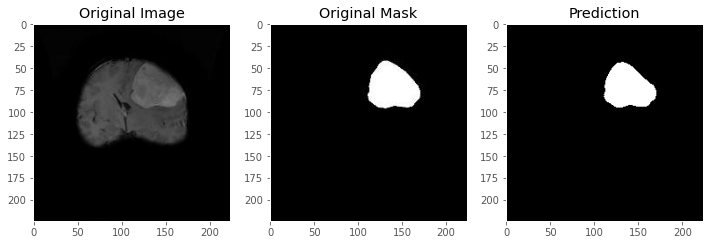

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_377.jpeg


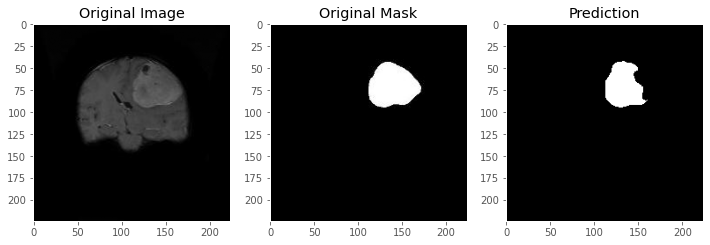

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_378.jpeg


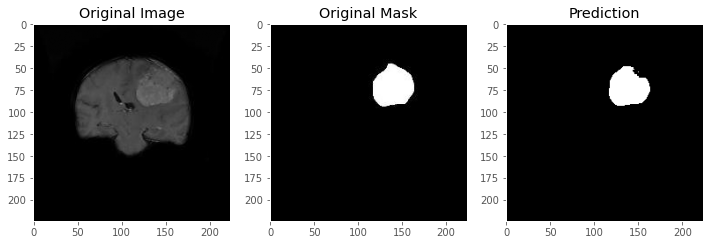

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_379.jpeg


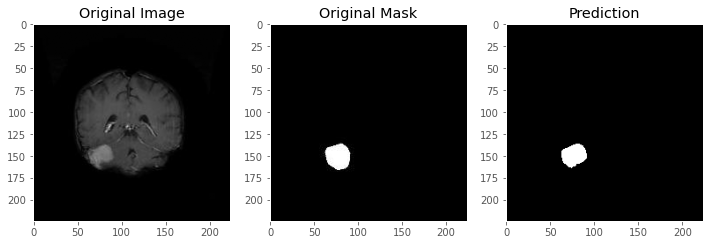

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_380.jpeg


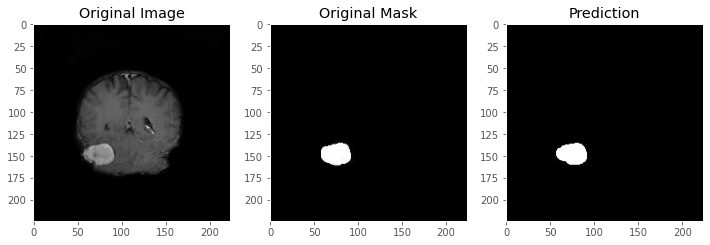

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_381.jpeg


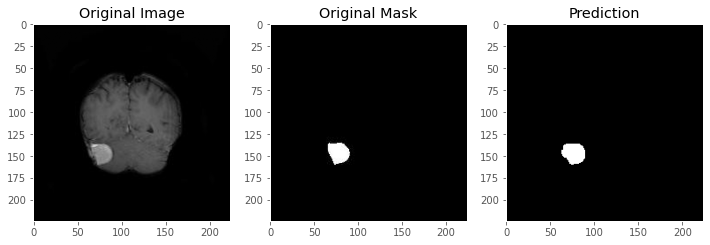

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_382.jpeg


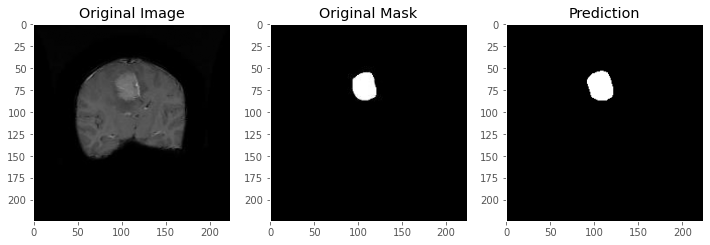

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_383.jpeg


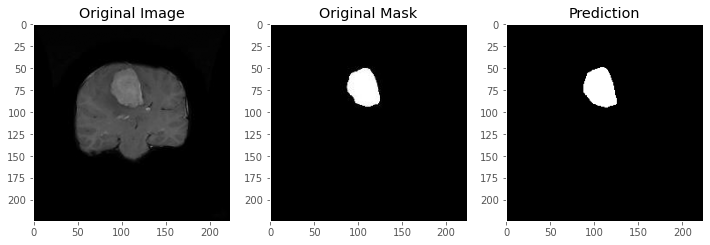

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_384.jpeg


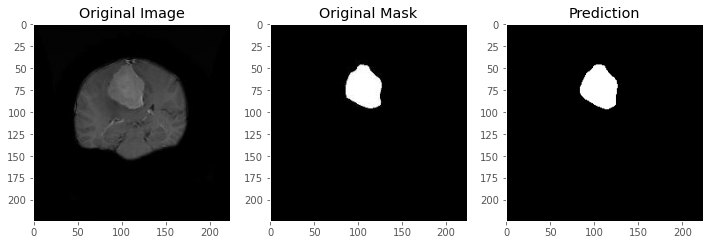

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_385.jpeg


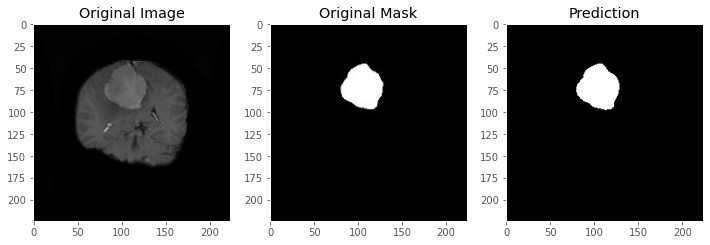

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_386.jpeg


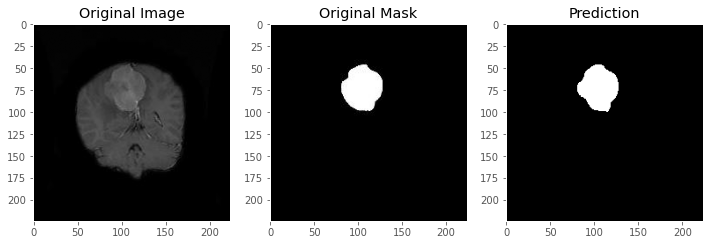

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_387.jpeg


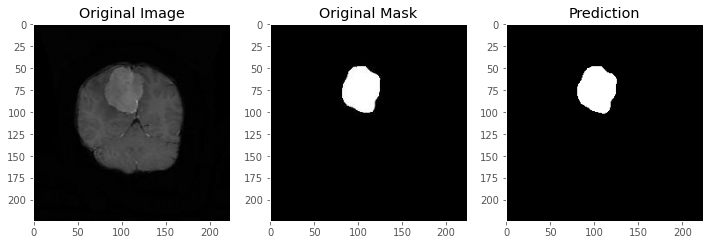

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_388.jpeg


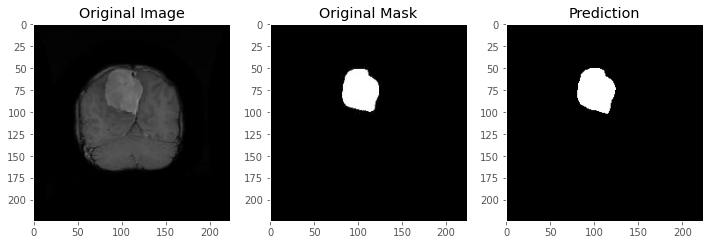

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_389.jpeg


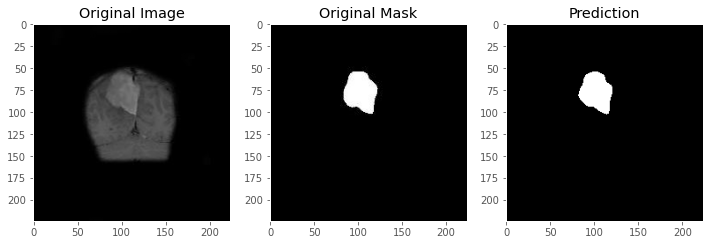

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_390.jpeg


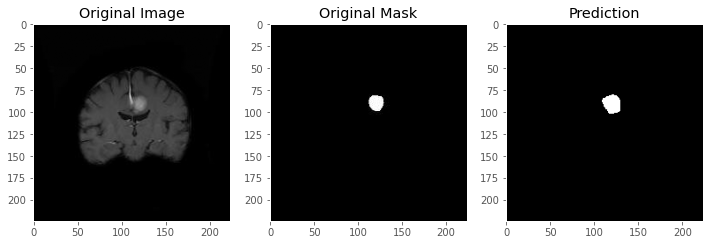

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_391.jpeg


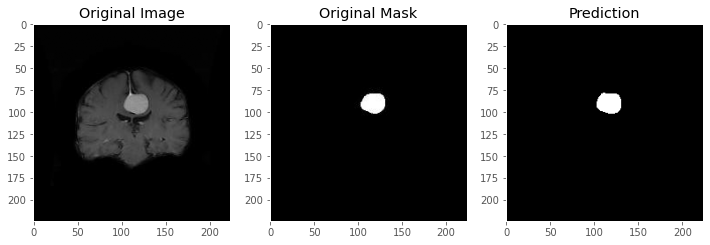

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_392.jpeg


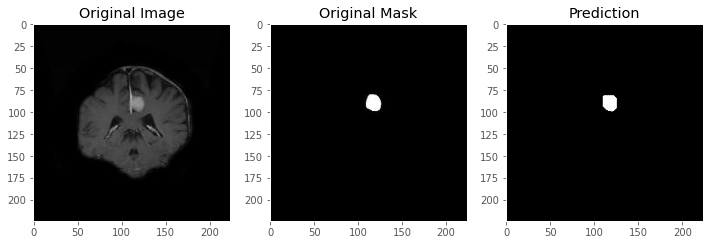

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_393.jpeg


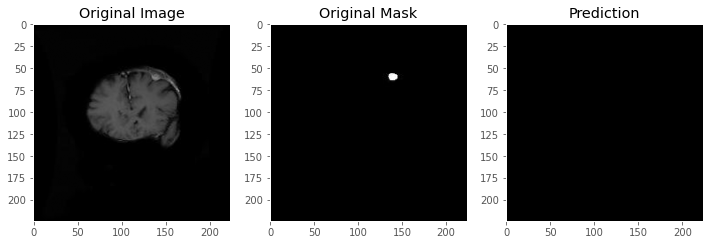

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_394.jpeg


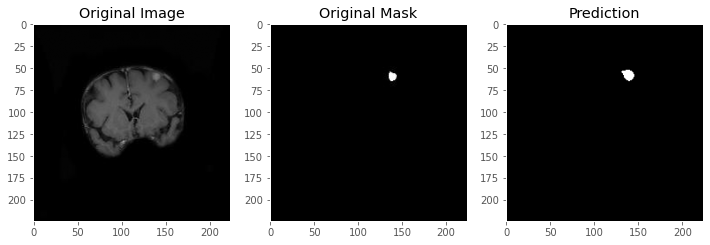

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_395.jpeg


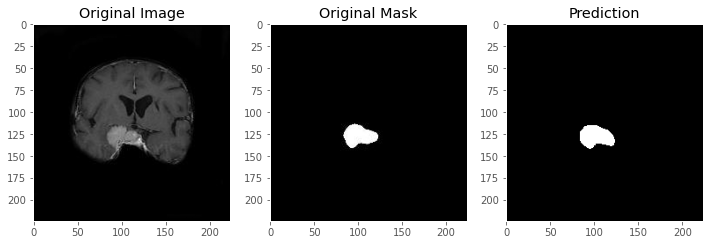

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_396.jpeg


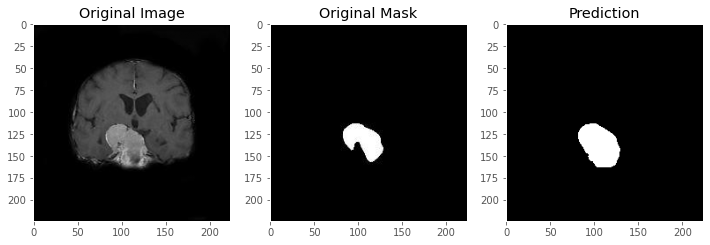

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_397.jpeg


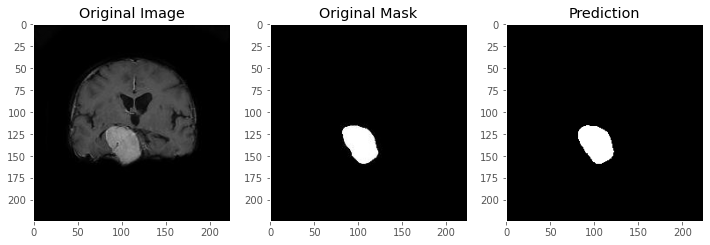

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_398.jpeg


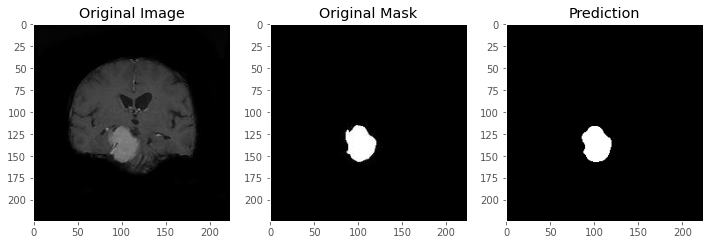

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_399.jpeg


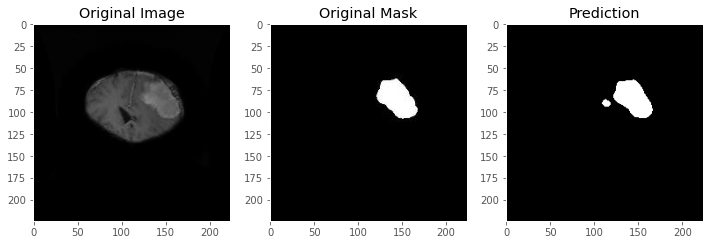

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_400.jpeg


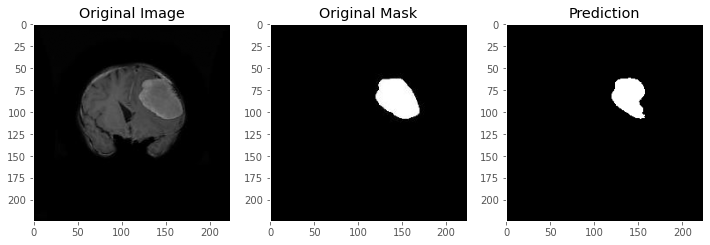

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_401.jpeg


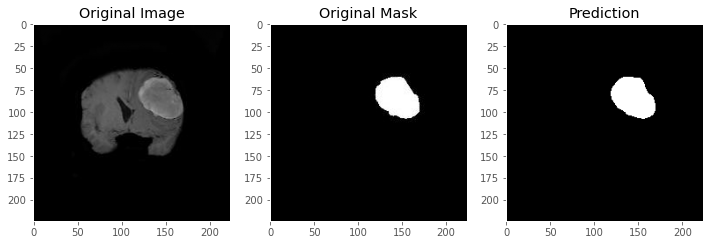

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_402.jpeg


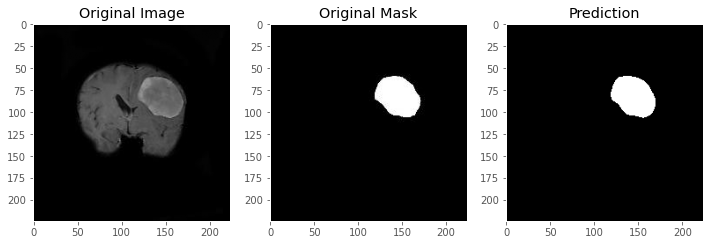

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_403.jpeg


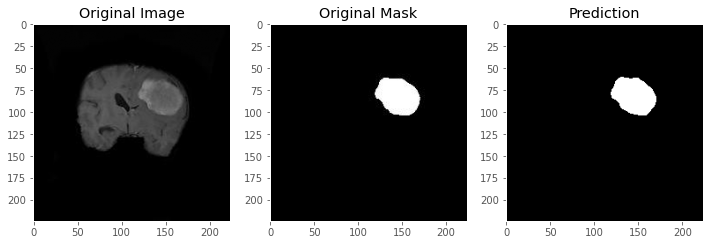

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_404.jpeg


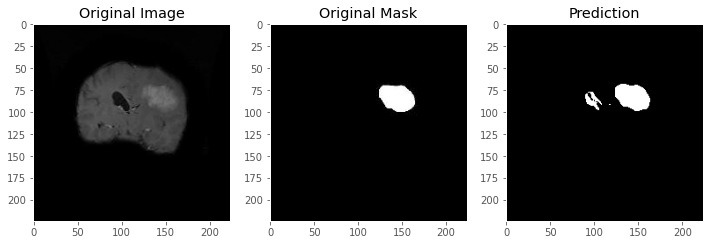

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_597.jpeg


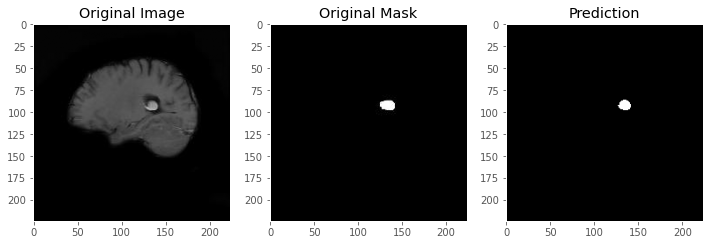

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_598.jpeg


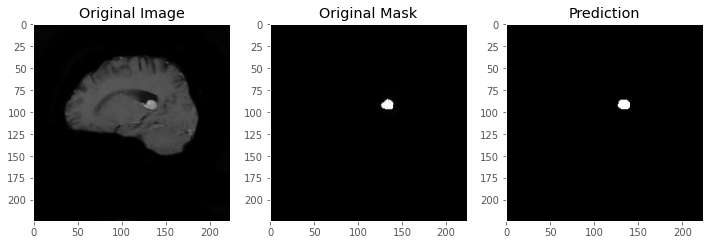

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_599.jpeg


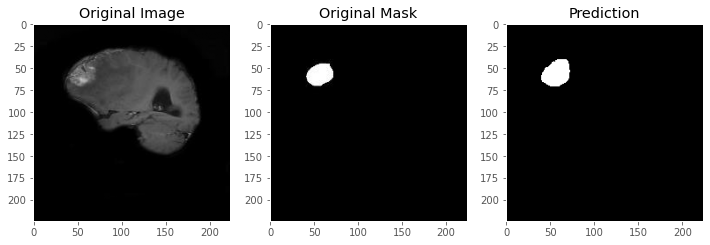

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_600.jpeg


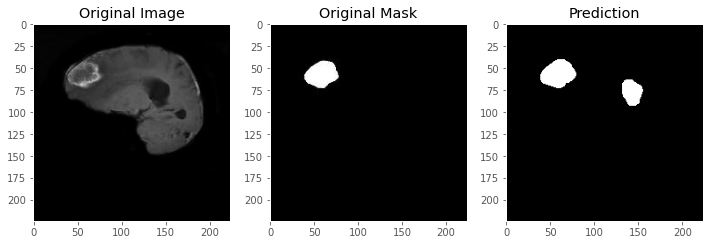

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_601.jpeg


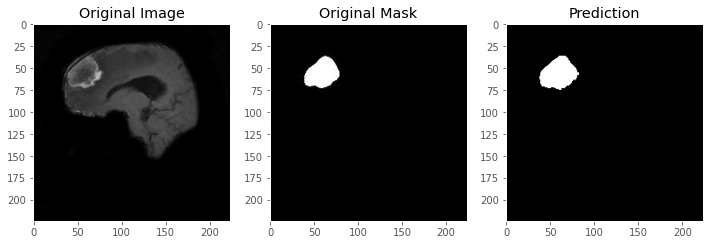

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_602.jpeg


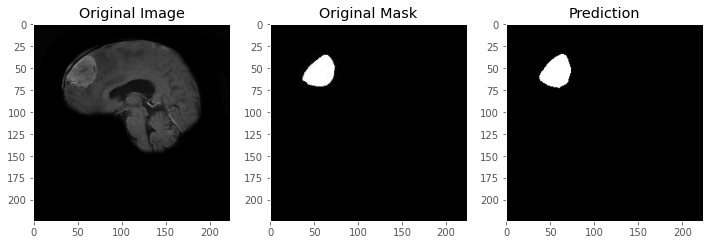

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_603.jpeg


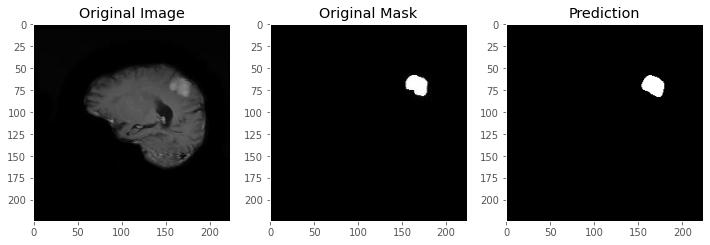

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_604.jpeg


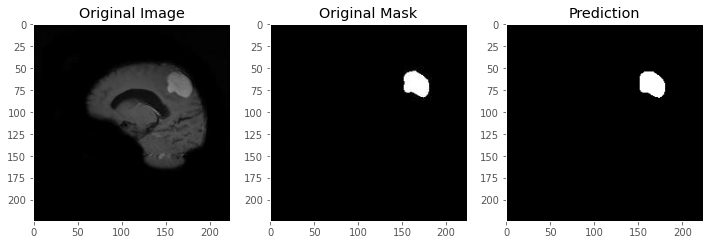

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_605.jpeg


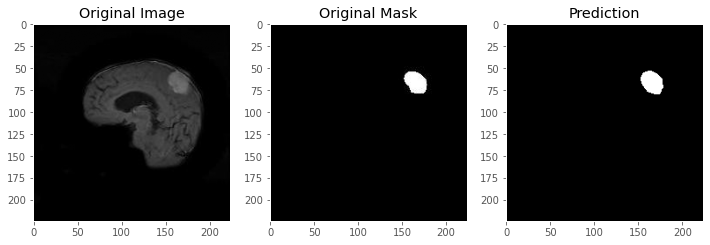

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_606.jpeg


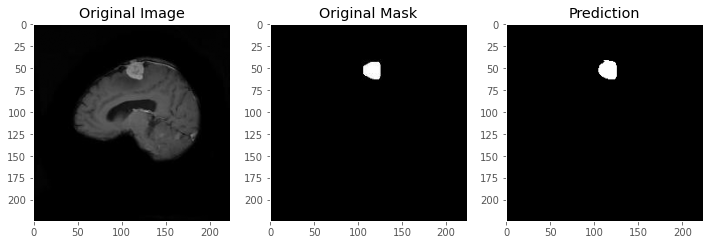

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_607.jpeg


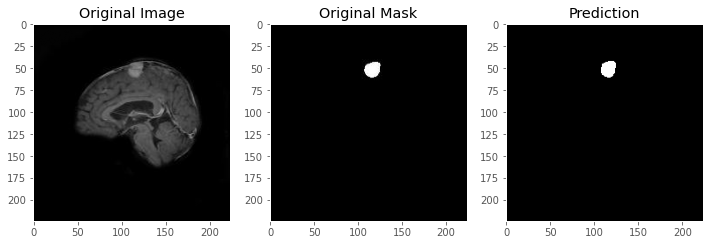

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_608.jpeg


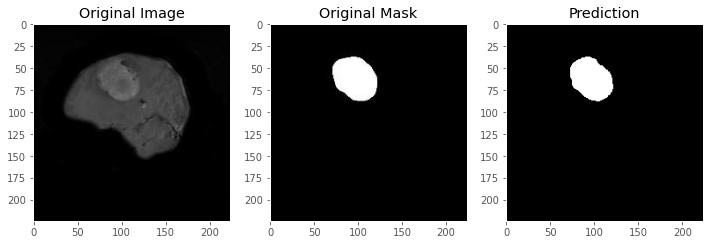

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_609.jpeg


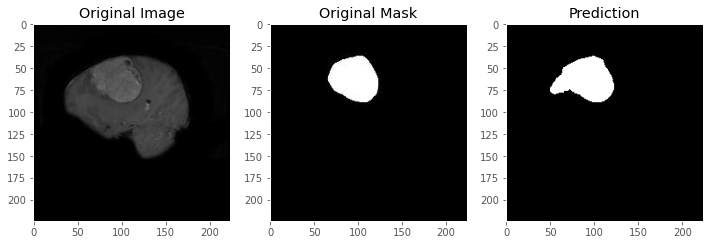

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_610.jpeg


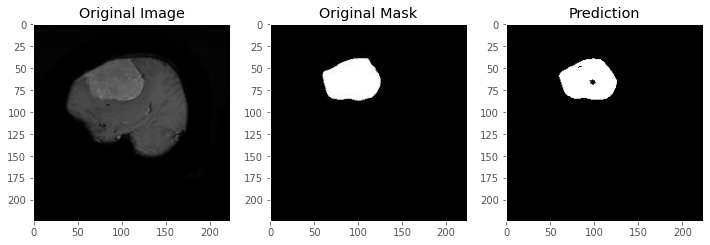

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_611.jpeg


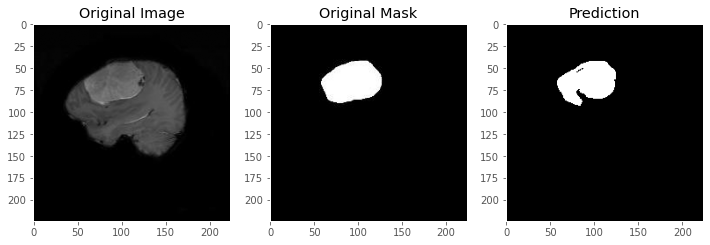

/content/gdrive/MyDrive/Segmentation/Original data/Test_images/Image_612.jpeg


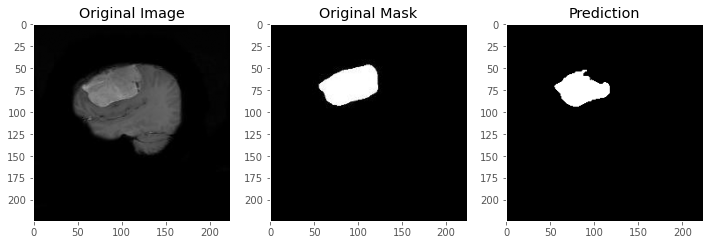

In [ ]:
for i in range(200):
    img = cv2.imread(df_test['filename'].iloc[i])
    print(df_test['filename'].iloc[i])
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)
    y=np.squeeze(pred)
    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.grid(False)
    plt.subplot(1,3,2)
    plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[i])))
    plt.title('Original Mask')
    plt.grid(False)
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5, cmap='gray')
    plt.title('Prediction')
    plt.grid(False)
    plt.show()